Cel: Analiza wpływu migracji na rynek pracy
* Ocena korelacji pomiędzy poziomem migracji a wskaźnikami zatrudnienia, bezrobocia oraz zatrudnienia w poszczególnych sektorach
* Stworzenie modeli statystycznych oceniających wpływ 
* Wykorzystane zestawy danych z Eurostatu:
    - Employment by citizenship
    - Employment rates by sex, age and citizenship - QUARTERLY & YEARLY
    - Unemployment rates by sex, age and citizenship QUARTERLY & YEARLY
    - Employment by sex, age and economic activity

In [9]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
import pycountry
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Employment rates by sex, age and citizenship quarterly

W analizie biorę pod uwagę: 
* citizenship jako Reporting country/Foreign country/Total
* age -> jedynie 15-64 (w statystyce porównawczej te granice są najczęściej przyjmowane)
* sex -> Females/Males/Total

Wskaźnik zatrudnienia – wskaźnik określający, jaki odsetek ludności w wieku produkcyjnym pracuje zawodowo (jednostka: %)

### Wstępna anliza danych 

In [2]:
e_rate_df = pd.read_csv('../processed_data/employmnet_rates.csv')

In [3]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = e_rate_df[e_rate_df['geo'].isin(selected_countries)]

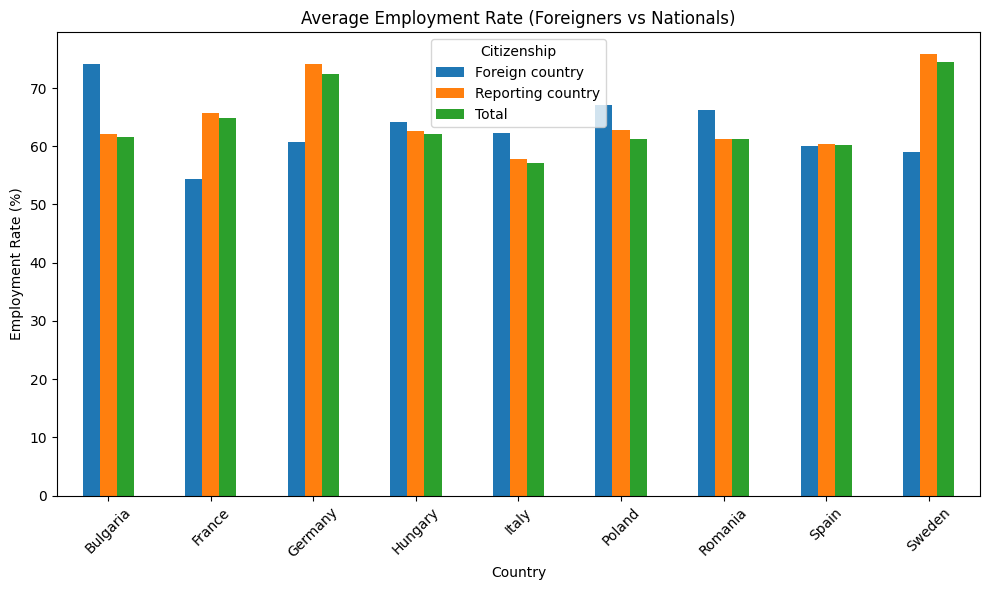

<Figure size 1200x600 with 0 Axes>

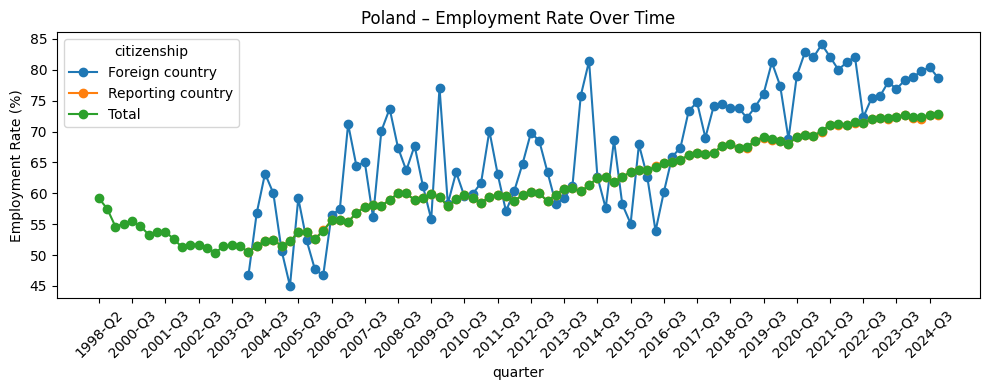

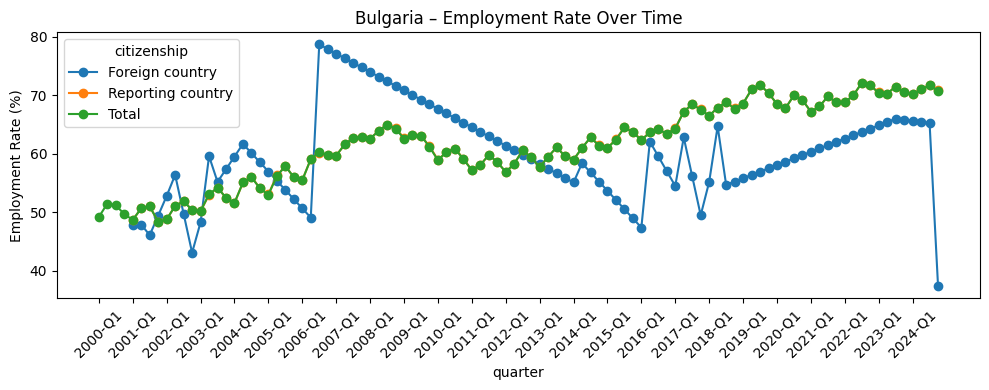

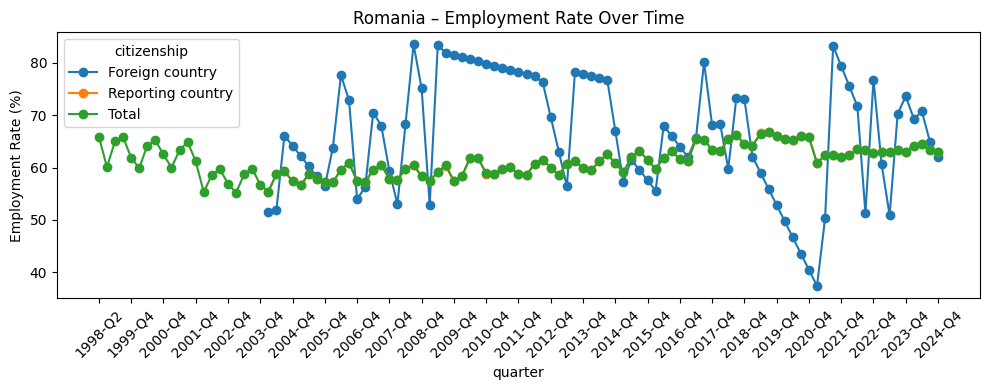

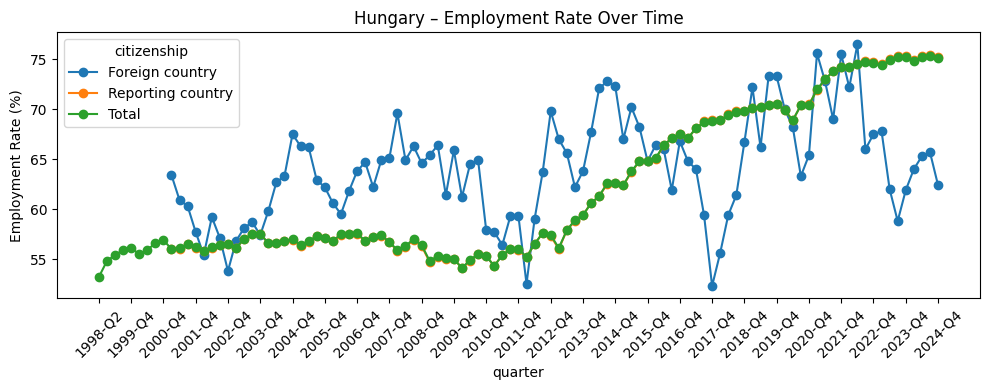

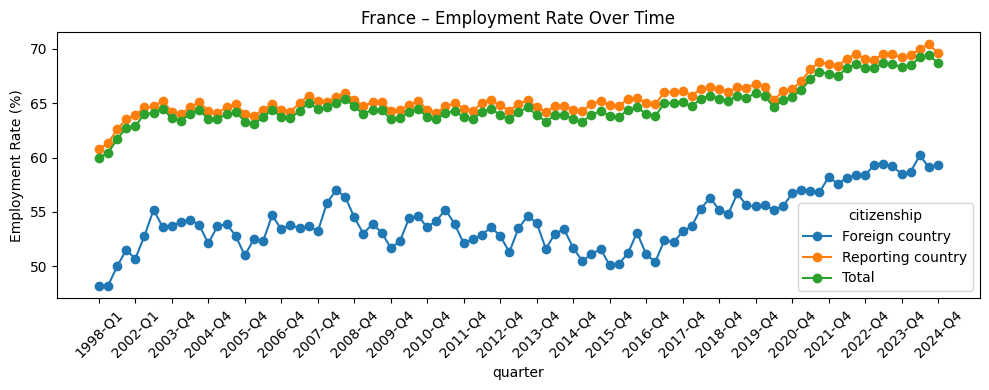

...

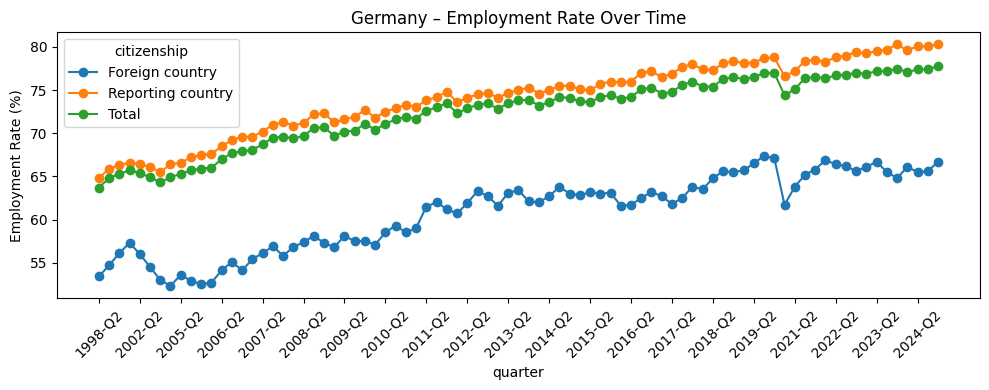

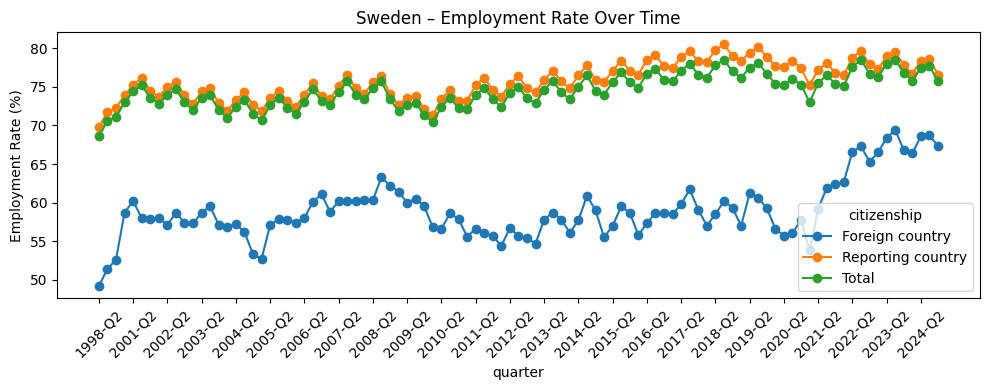

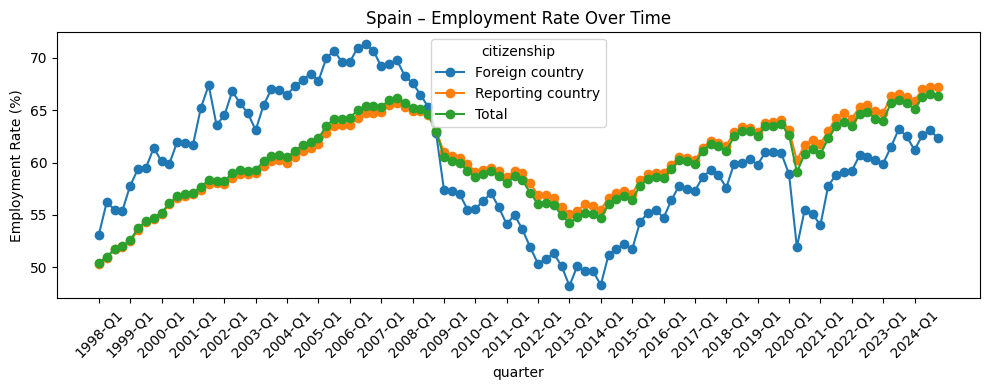

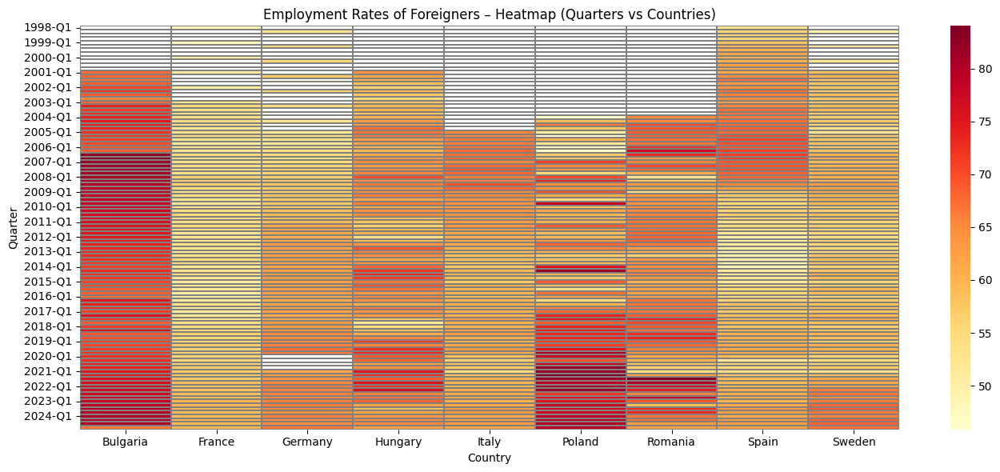

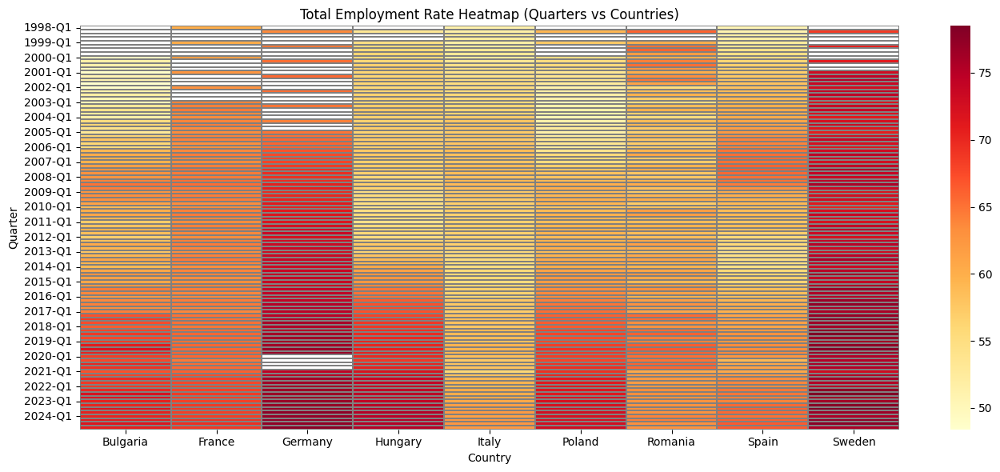

In [4]:
# Average employment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Employment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='quarter', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='quarter', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Employment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


Wątpliwe długie liniowe fragmenty - dla Bułgarii oraz Rumunii

### Próba analizy dla Bułgarii i Rumunii (foreign citizens) - dane rzeczywiste bez liniowej interpolacji

In [76]:
extra_df = pd.read_csv('../processed_data/employment_and_unemployment_rates_quarter.csv')

In [77]:
countries = ['Bulgaria', 'Romania']
extra_df = extra_df[
    (extra_df['geo'].isin(countries)) & 
    (extra_df['Country of citizenship'] == 'Foreign country')
]

In [78]:
print(len(extra_df[extra_df['employment_rate'] == 0])/len(extra_df)) 

0.3055555555555556


In [79]:
filtered_df = extra_df[extra_df['employment_rate'] > 0]
filtered_df = filtered_df.dropna(subset=['employment_rate'])

<Figure size 1200x600 with 0 Axes>

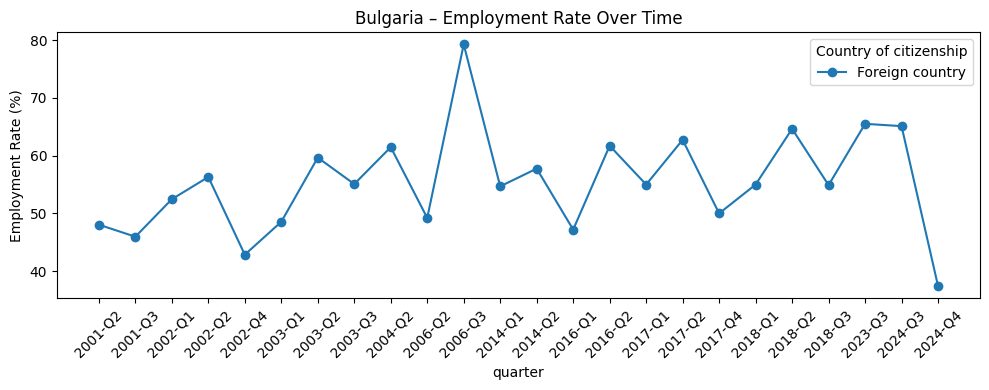

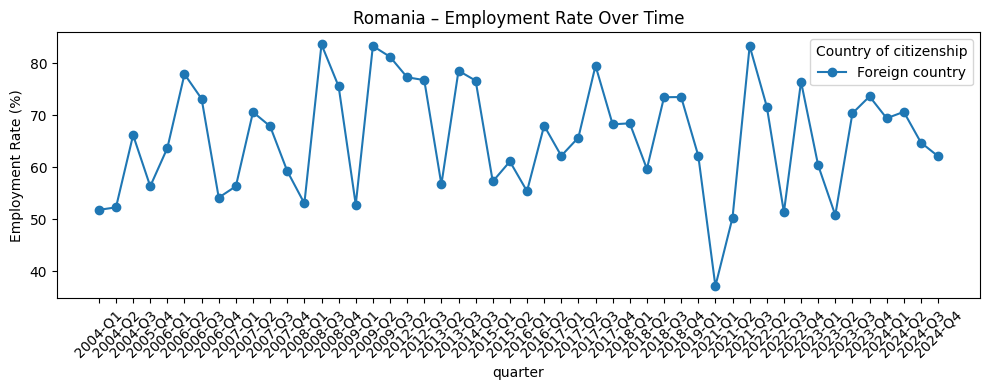

In [80]:
# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in countries:
    subset = filtered_df[(filtered_df['geo'] == country) & (filtered_df['Country of citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (filtered_df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='Country of citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks)), labels=xticks, rotation=45)
    plt.tight_layout()
    plt.show()

Niewiele pomogło, ale coś można odczytywać

Widać znaczny wzrost wskaźnika zatrudnienia w Polsce na przestrzeni lat

Widać braki w danych dla niektórych krajów - Bługarię i Rumunię należy wykluczyć z tej analizy / zastąpić innymi krajami / samodzielnie wyliczyć employment rate (z danych dotyczących employment). Postanowiono sprawdzić Grecję i Słowenię. 

In [81]:
new_countries = ['Greece', 'Slovenia']
# Filter the DataFrame for the new countries
df_extra_countries = e_rate_df[e_rate_df['geo'].isin(new_countries)]


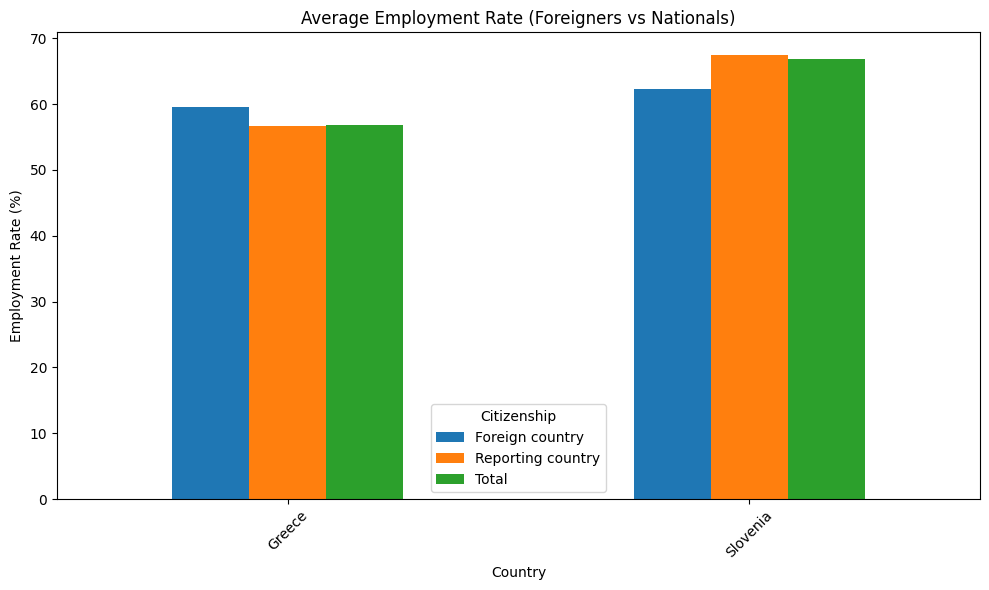

<Figure size 1200x600 with 0 Axes>

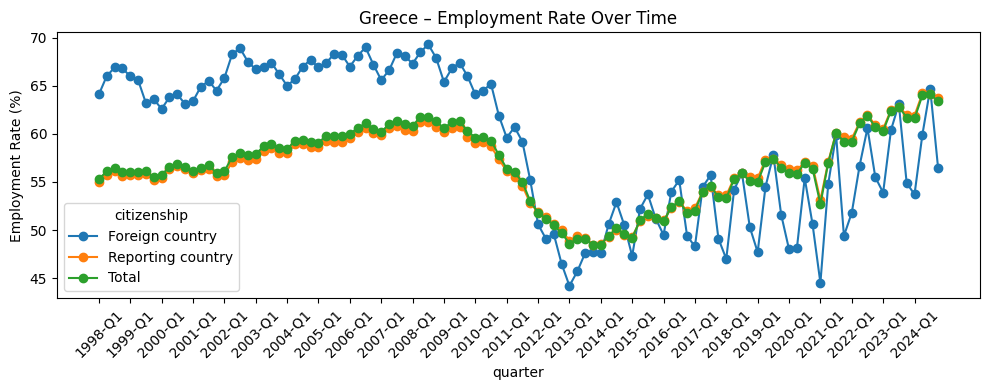

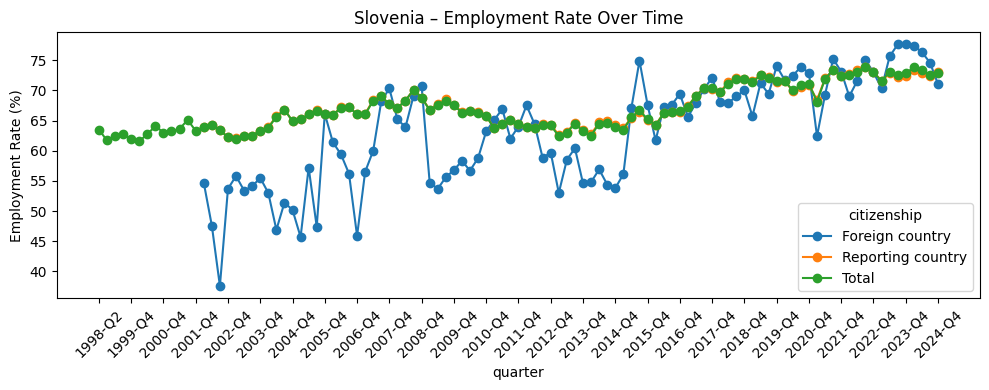

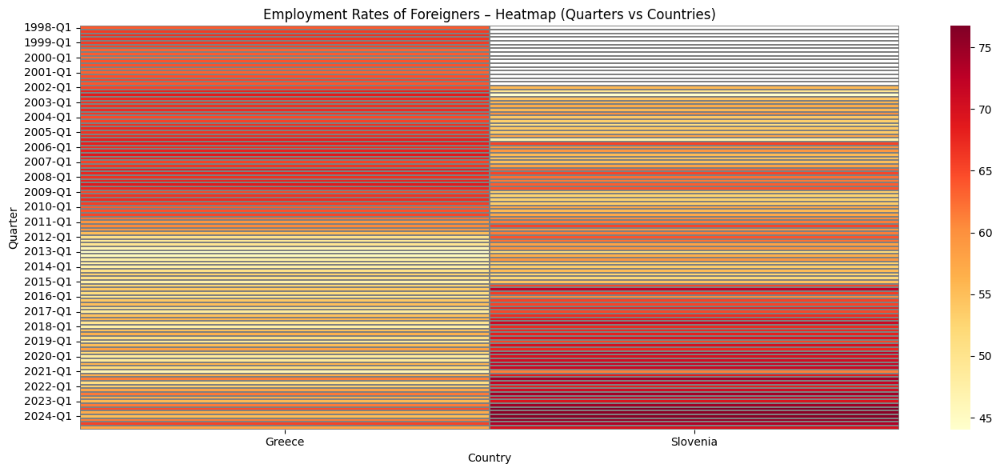

In [82]:
# Average employment rate by citizenship and country
pivot_mean = df_extra_countries.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Employment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in new_countries:
    subset = df_extra_countries[
        (df_extra_countries['geo'] == country) &
        (df_extra_countries['citizenship'].isin(['Reporting country', 'Foreign country', 'Total'])) &
        (df_extra_countries['Sex'] == 'Total')
    ]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()


# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df_extra_countries[df_extra_countries['citizenship'] == 'Foreign country'].pivot_table(
    index='quarter', columns='geo', values='employment_rate'
)

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


### Analiza związana z płcią


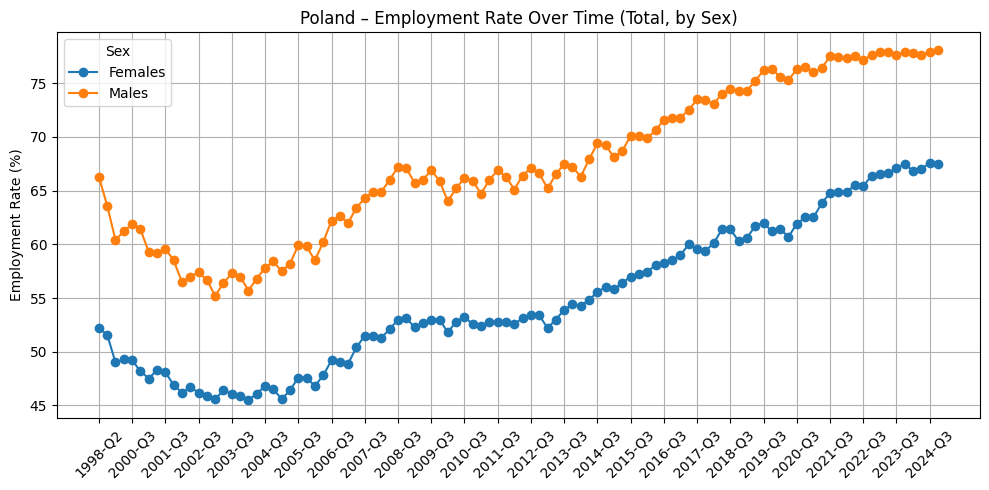

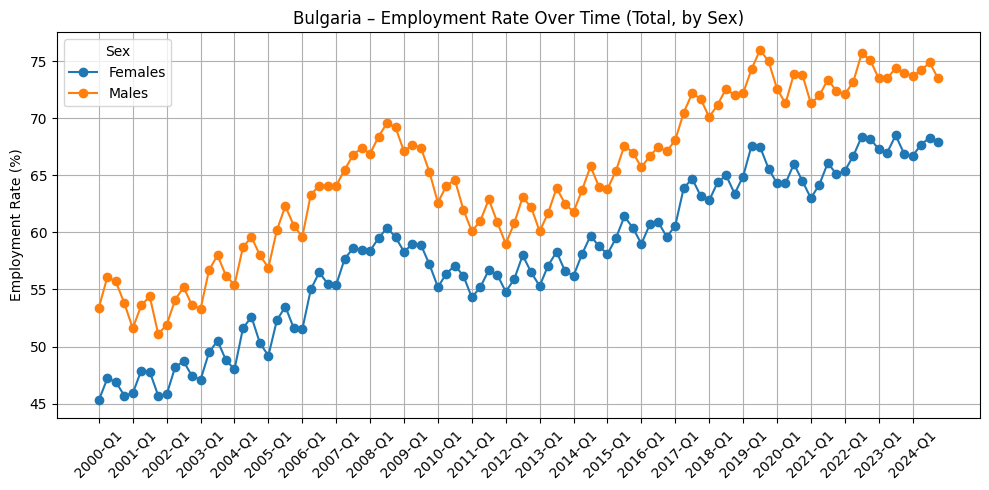

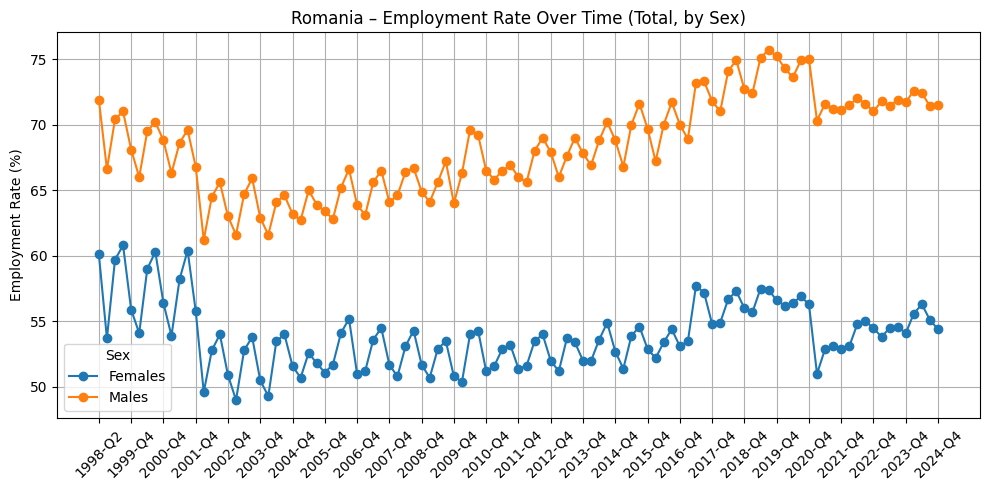

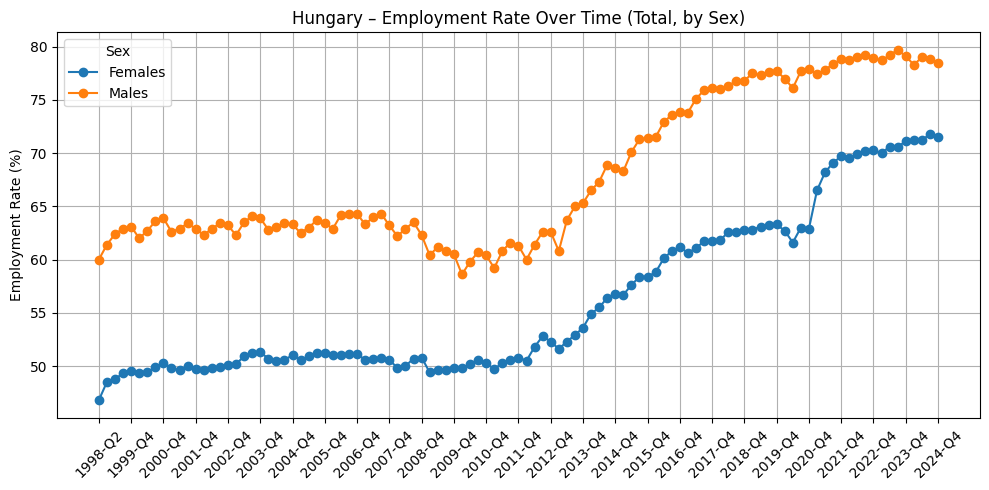

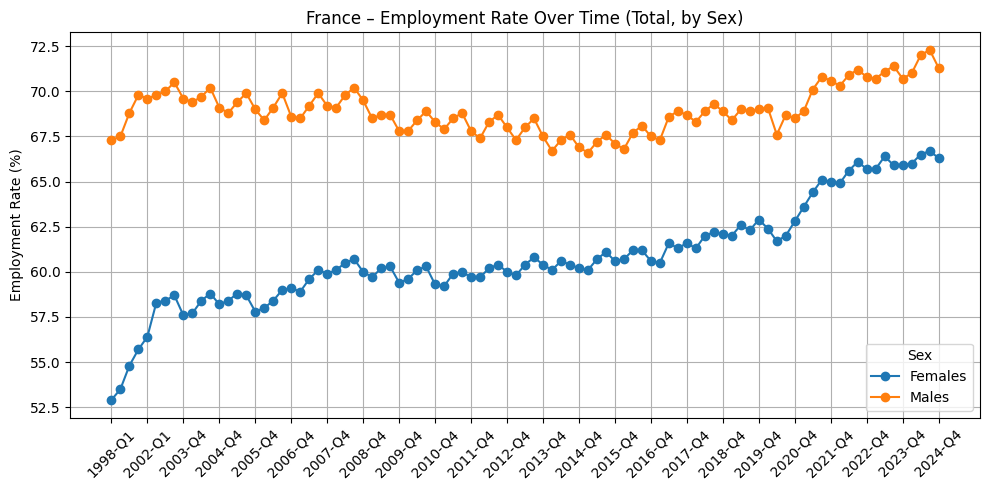

...

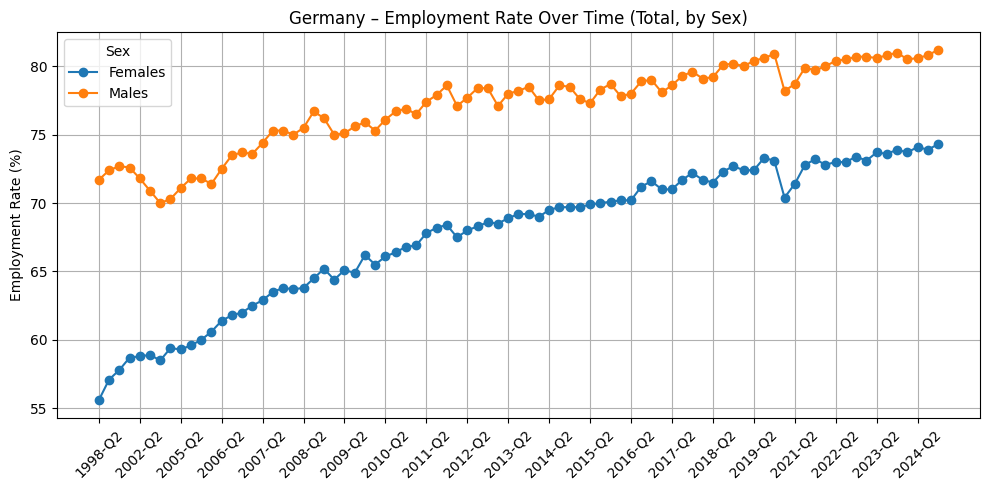

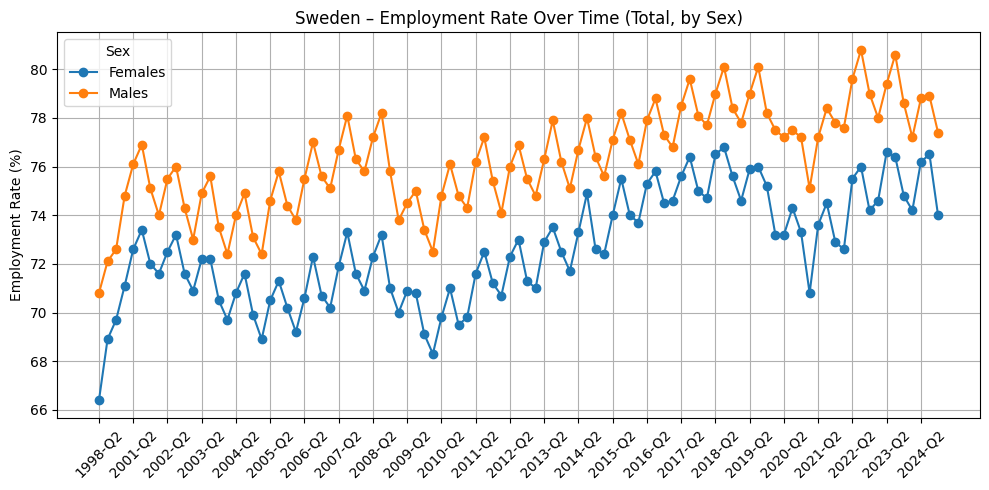

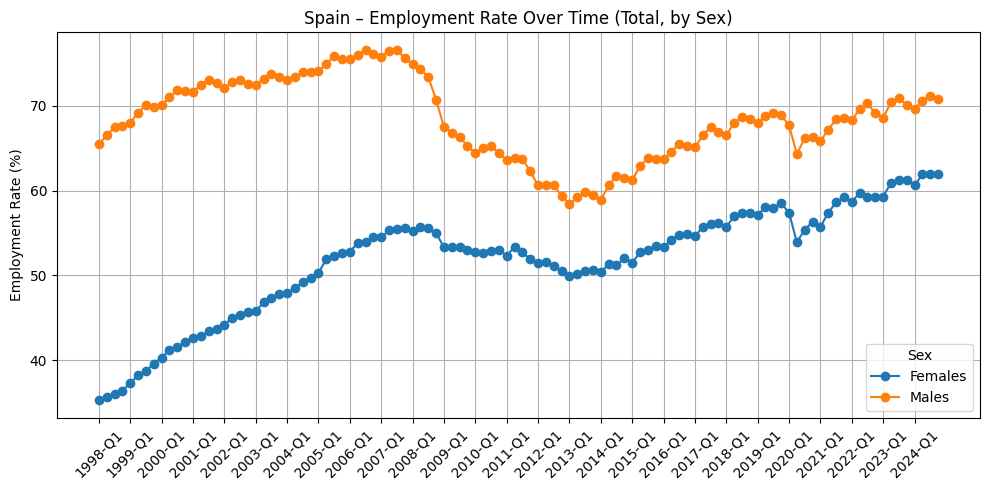

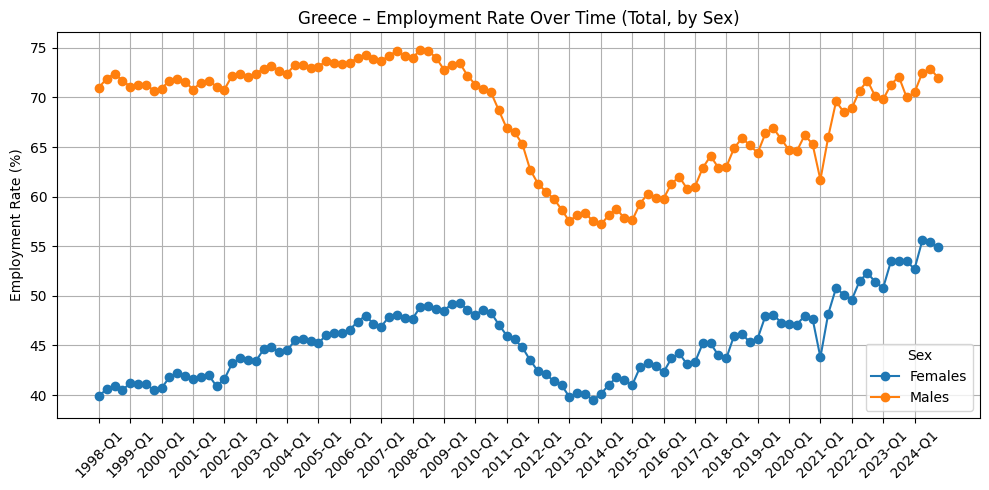

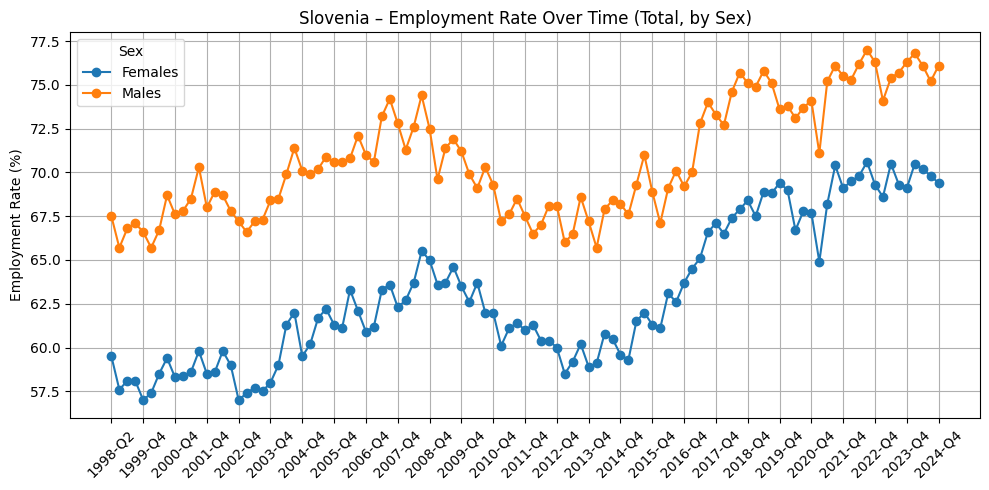

In [83]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

df = e_rate_df[
    (e_rate_df['geo'].isin(selected_countries)) &
    (e_rate_df['Sex'].isin(['Females', 'Males'])) &
    (e_rate_df['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='quarter')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Total, by Sex)")
    plt.ylabel("Employment Rate (%)")


    xticks = subset['quarter'].sort_values().unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


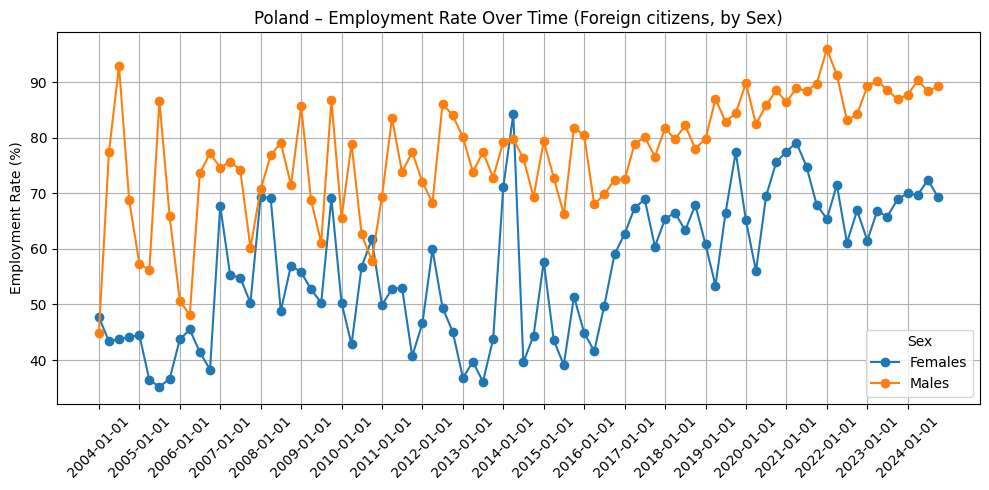

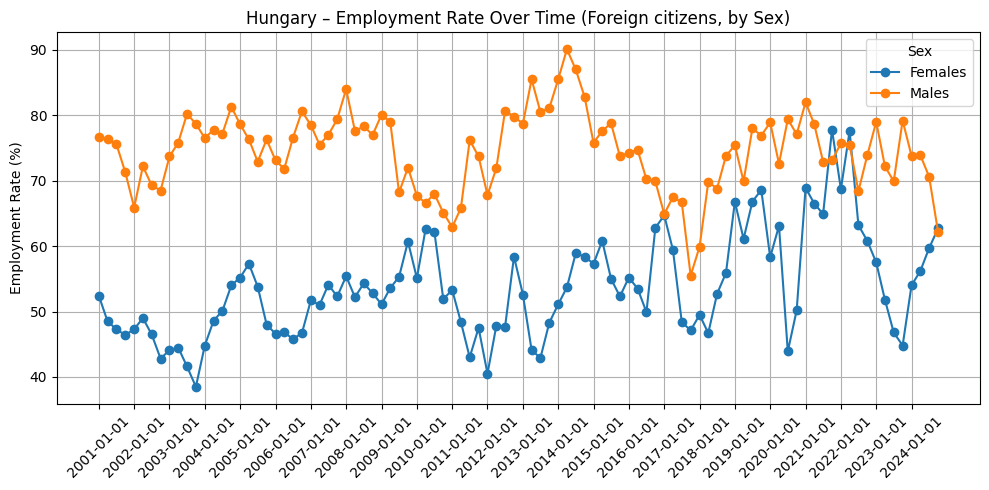

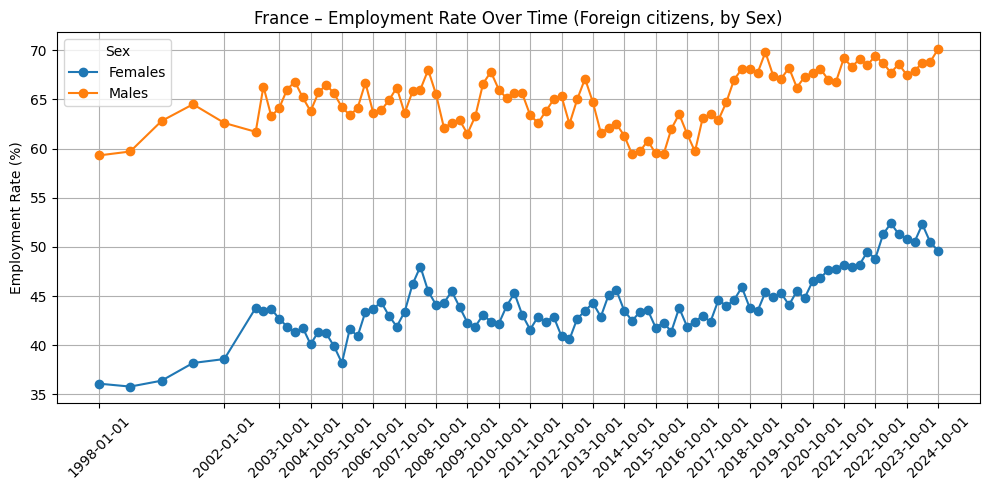

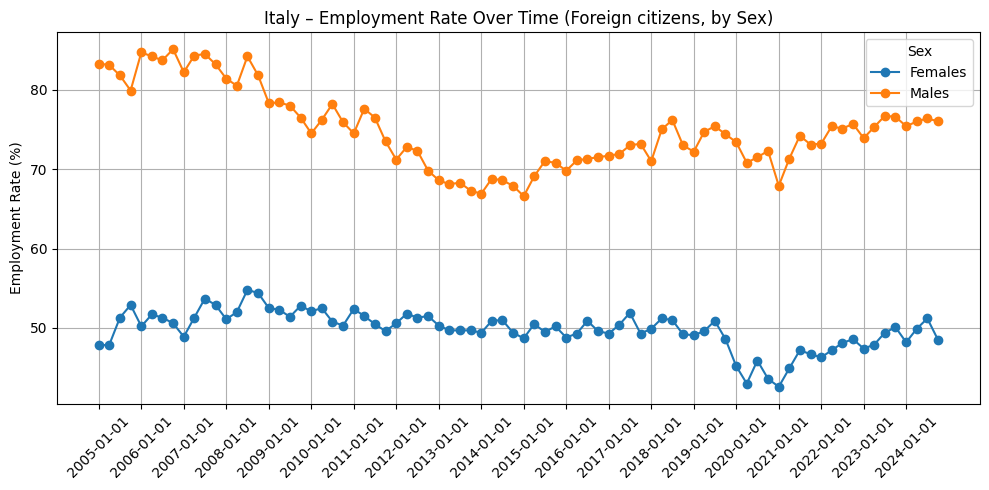

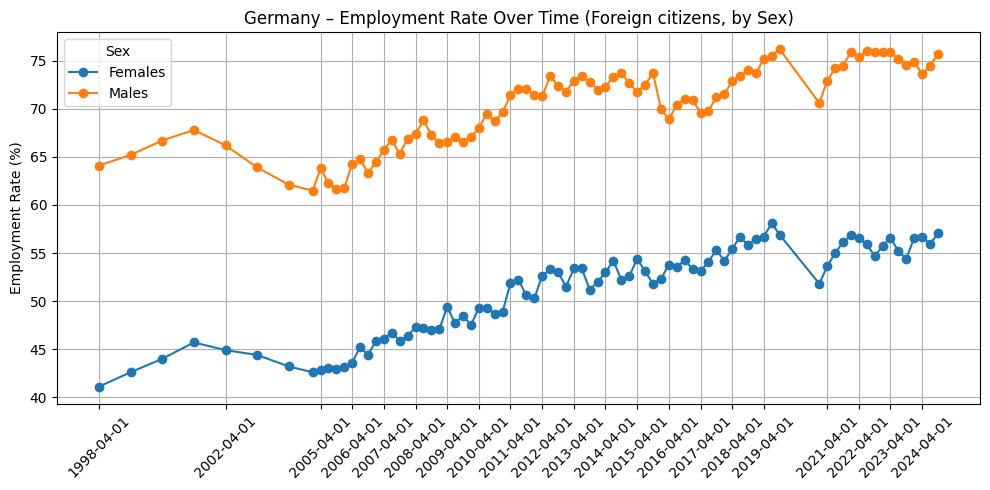

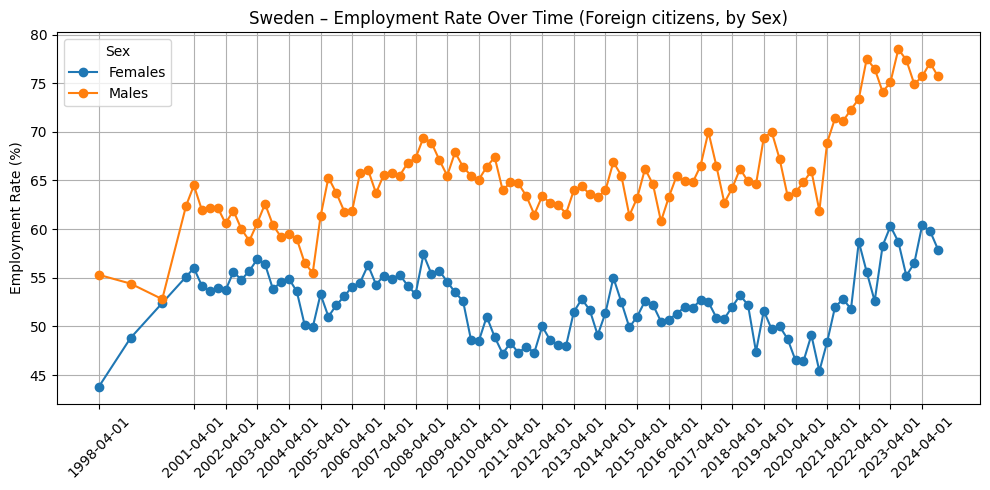

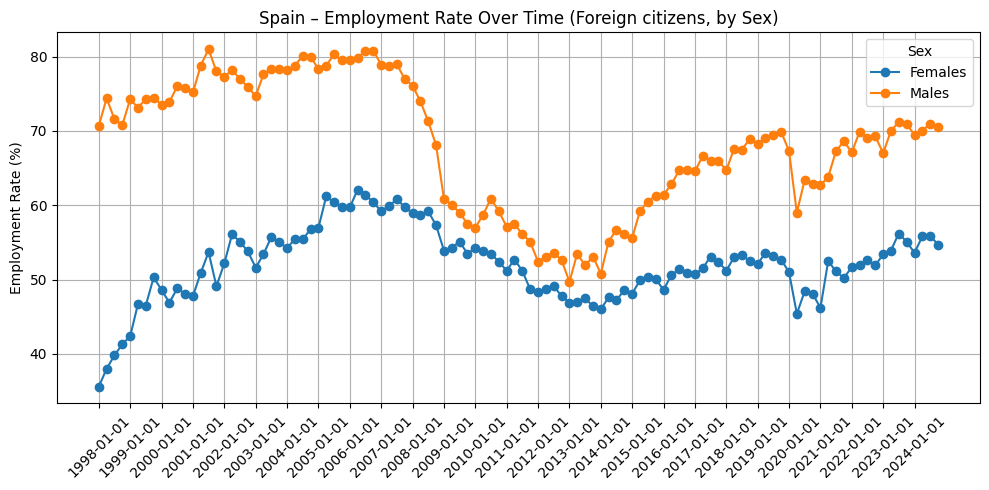

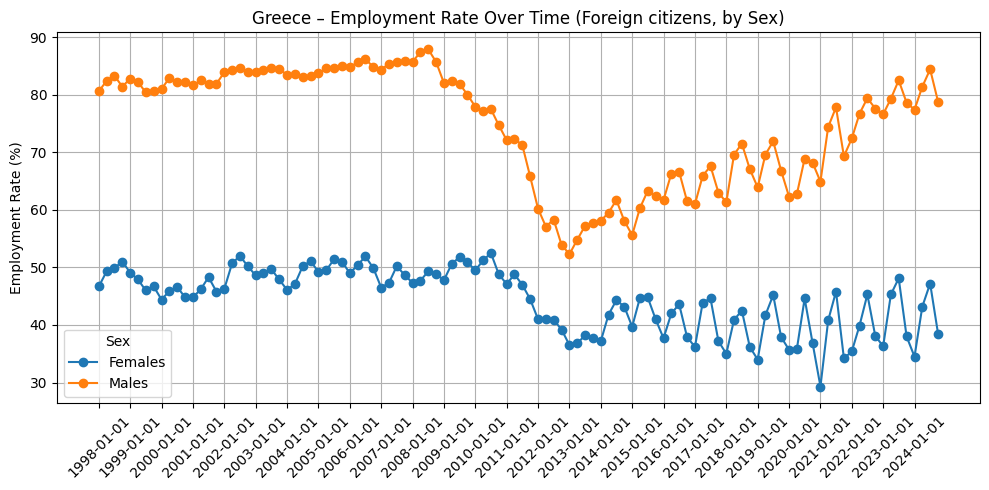

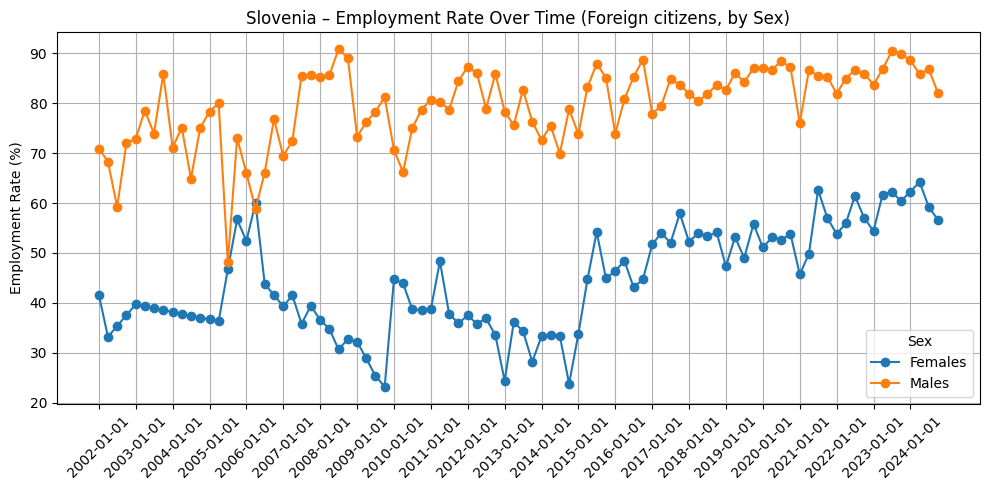

In [ ]:
selected_countries = ["Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]


df = e_rate_df[
    (e_rate_df['geo'].isin(selected_countries)) &
    (e_rate_df['Sex'].isin(['Females', 'Males'])) &
    (e_rate_df['citizenship'] == 'Foreign country')
].copy()

def quarter_to_datetime(q):
    year, qtr = q[:4], q[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(qtr, '01')
    return pd.to_datetime(f"{year}-{month}-01")

df['quarter_dt'] = df['quarter'].apply(quarter_to_datetime)

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values('quarter_dt')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter_dt'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Foreign citizens, by Sex)")
    plt.ylabel("Employment Rate (%)")

    xticks = subset['quarter_dt'].unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


In [85]:
liberal = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria"]
conservs = ["Poland", "Bulgaria", "Romania", "Hungary",  "Greece"]
selected = liberal + conservs

extra_df['Group'] = extra_df['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

grouped = extra_df[extra_df['Group'] != 'Other'].groupby(['quarter', 'Group'])['employment_rate'].mean().reset_index()

fig = px.line(
    grouped,
    x='quarter',
    y='employment_rate',
    color='Group',
    title='Average Employment Rate per Quarter by Political Group',
    labels={
        'quarter': 'Quarter',
        'employment_rate': 'Employment Rate',
        'Group': 'Political Group'
    },
    width=1000,
    height=500,
    markers=True
)
fig.show()


### Mapy

In [86]:
e_rate_df['date'] = pd.to_datetime(e_rate_df['date'], format="%y-%m-%d")

ValueError: time data "1998-01-01" doesn't match format "%y-%m-%d", at position 0. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [ ]:
def get_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except LookupError:
        return None

e_rate_df['iso_a3'] = e_rate_df['geo'].apply(get_iso3)


filtered = e_rate_df.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'employment_rate': 'mean'
})
filtered.rename(columns={'employment_rate': 'employment_rate_mean'}, inplace=True)



fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='employment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Mean employment rate in Europe (1998–2024)',
    scope='europe'
)
fig.show()



In [ ]:
filtered = e_rate_df[
    (e_rate_df['date'].dt.year >= 2015) & (e_rate_df['date'].dt.year <= 2024)
]

filtered = filtered.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'employment_rate': 'mean'
})
filtered.rename(columns={'employment_rate': 'employment_rate_mean'}, inplace=True)


fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='employment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Mean employment rate in Europe (2015–2024)',
    scope='europe'
)
fig.show()



In [ ]:
# current 
filtered = e_rate_df[
    (e_rate_df['date'].dt.year == 2024)
]

filtered = e_rate_df.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'employment_rate': 'mean'
})
filtered.rename(columns={'employment_rate': 'employment_rate_mean'}, inplace=True)



fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='employment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Employment rate in Europe in 2024',
    scope='europe'
)
fig.show()


# Unemployment rates by sex, age and citizenship quarterly

# 

In [18]:
ue_rate_df = pd.read_csv('../processed_data/unemploymnet_rates.csv')

In [19]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = ue_rate_df[ue_rate_df['geo'].isin(selected_countries)]

In [ ]:
# Average unemployment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['unemployment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Unemployment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()
import seaborn as sns
# Heatmap of foreigner unemployment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='quarter', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Unmployment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='quarter', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Unemployment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


KeyError: 'year'

### Próba analizy dla krajów z dużymi brakami - Polska, Węgry, Bułgaria, Rumunia

0.8611111111111112


<Figure size 1200x600 with 0 Axes>

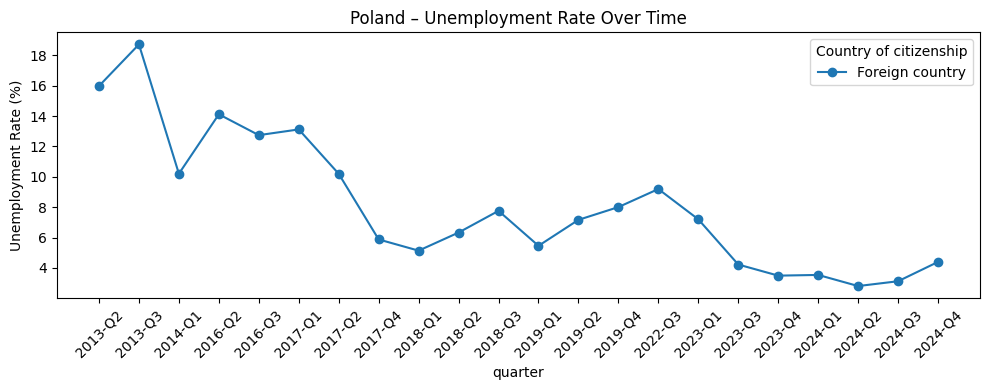

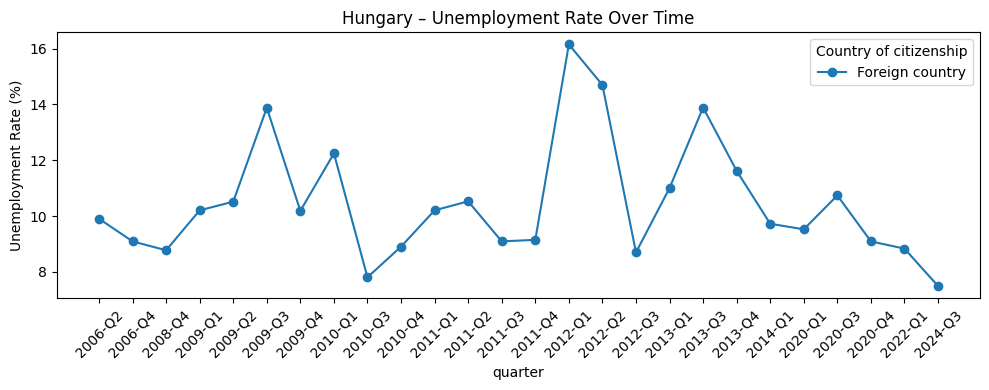

In [ ]:
extra_df = pd.read_csv('../processed_data/employment_and_unemployment_rates_quarter.csv')

countries = ['Poland', 'Hungary']
extra_df = extra_df[
    (extra_df['geo'].isin(countries)) & 
    (extra_df['Country of citizenship'] == 'Foreign country')
]

print(len(extra_df[extra_df['unemployment_rate'] == 0])/len(extra_df)) 

filtered_df = extra_df[extra_df['unemployment_rate'] > 0]
filtered_df = filtered_df.dropna(subset=['unemployment_rate'])


# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in countries:
    subset = filtered_df[(filtered_df['geo'] == country) & (filtered_df['Country of citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (filtered_df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='Country of citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks)), labels=xticks, rotation=45)
    plt.tight_layout()
    plt.show()

Dla Bułgarii i Rumunii - brak tego typu danych kwartalnych

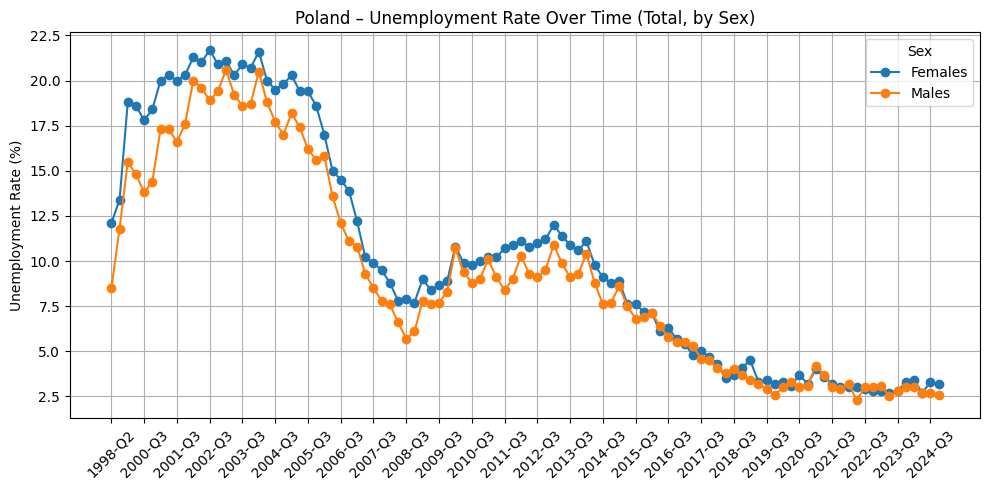

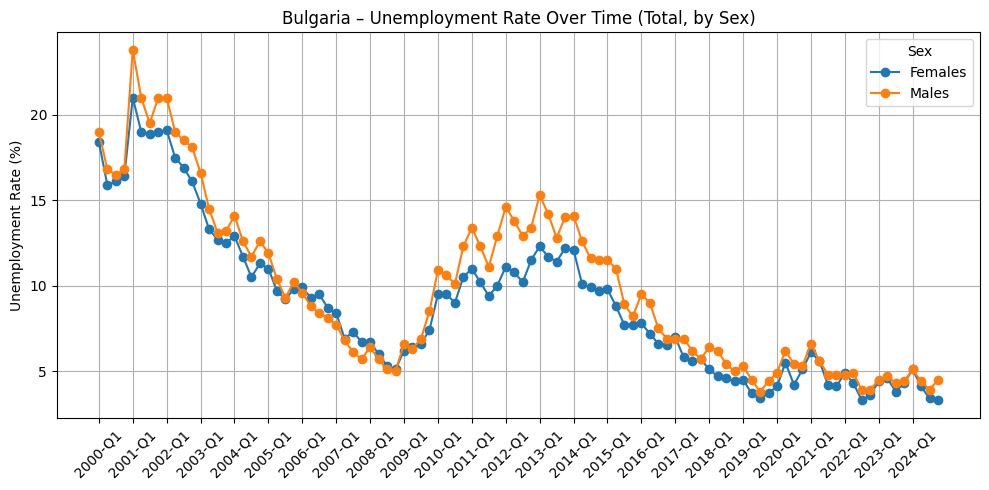

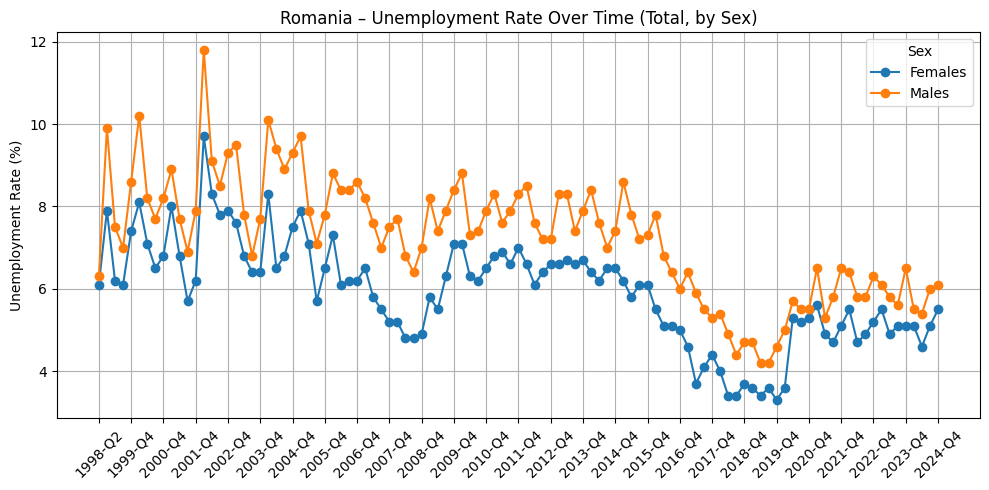

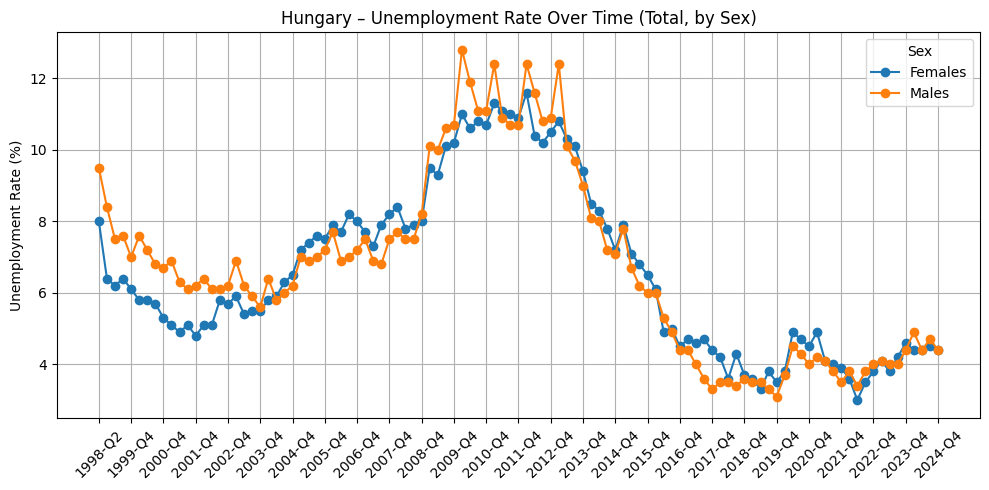

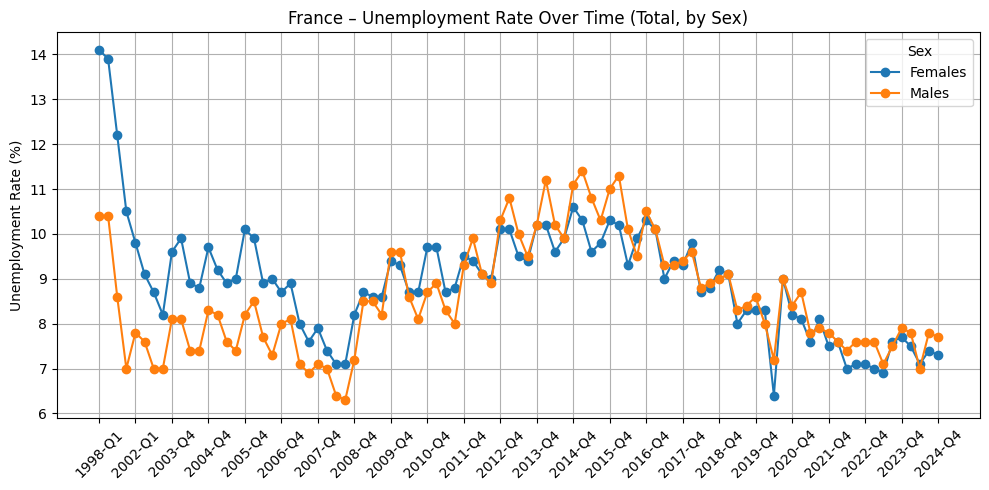

...

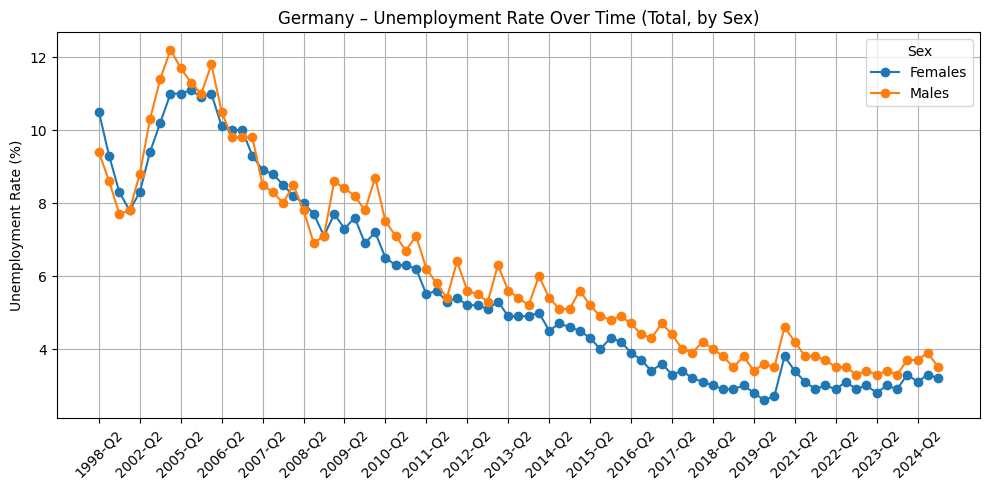

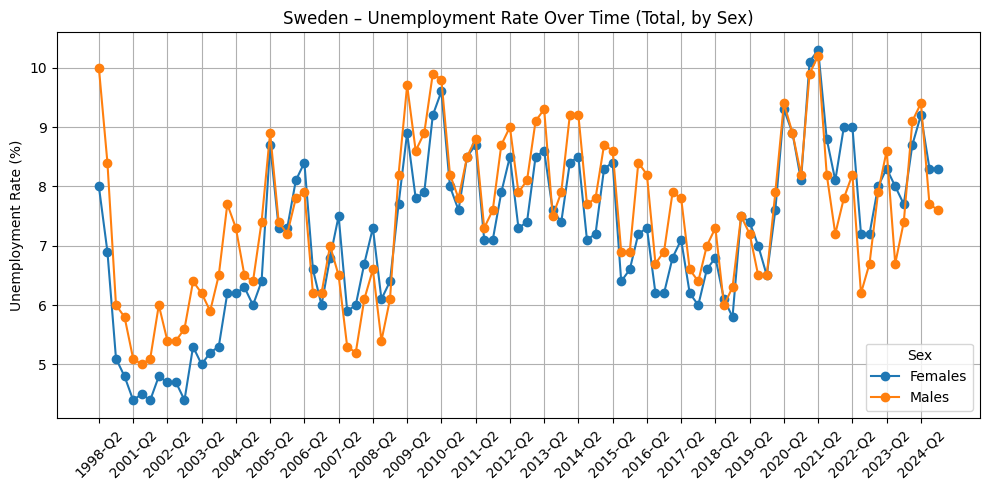

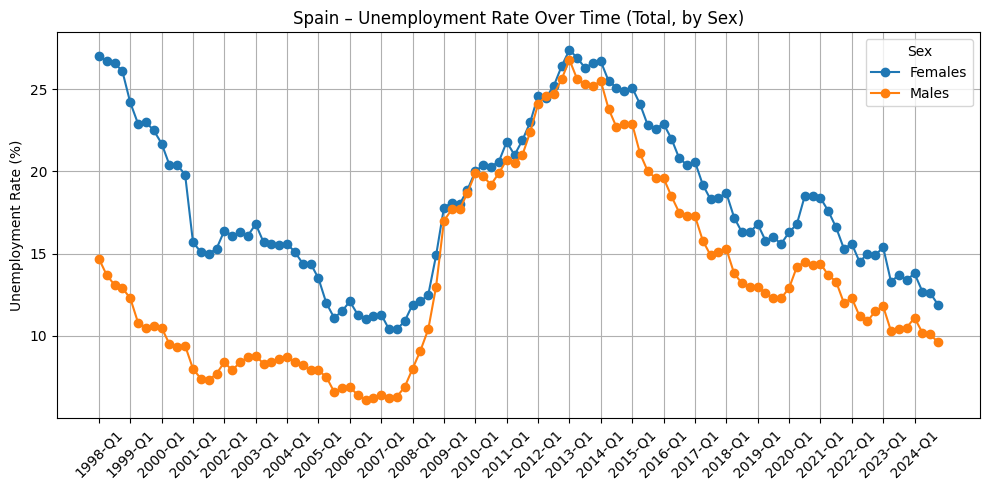

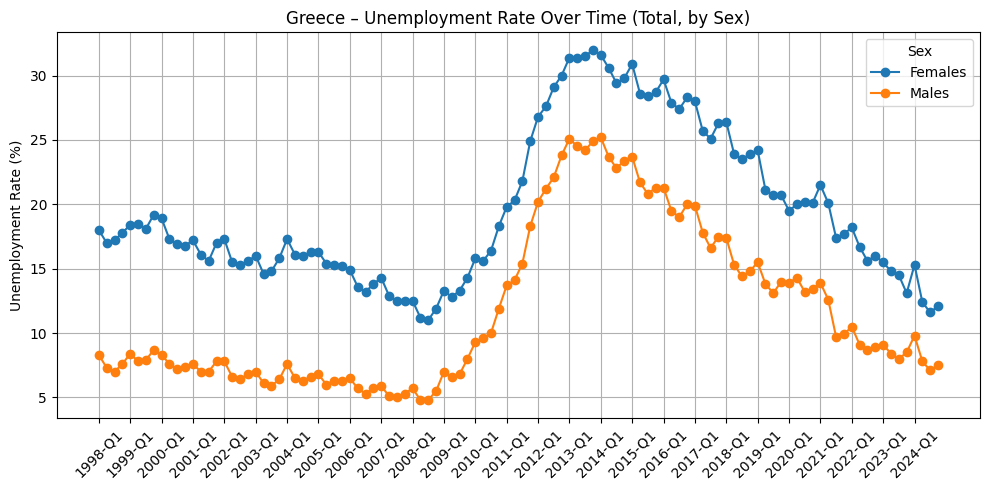

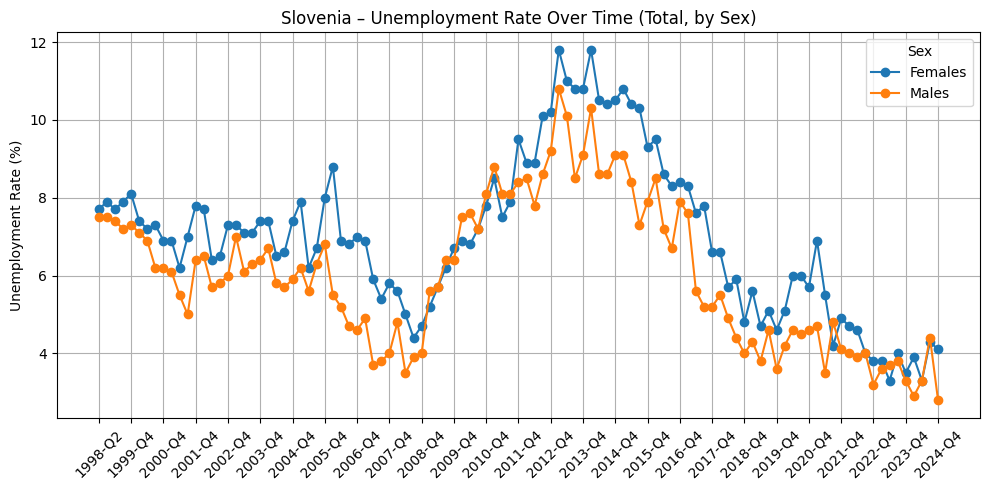

In [ ]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

df = ue_rate_df[
    (ue_rate_df['geo'].isin(selected_countries)) &
    (ue_rate_df['Sex'].isin(['Females', 'Males'])) &
    (ue_rate_df['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='quarter')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Total, by Sex)")
    plt.ylabel("Unemployment Rate (%)")


    xticks = subset['quarter'].sort_values().unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


W przypadku stopy bez robocia nie ma znaczących różnic pomiędzy kobietami, a mężczyznami

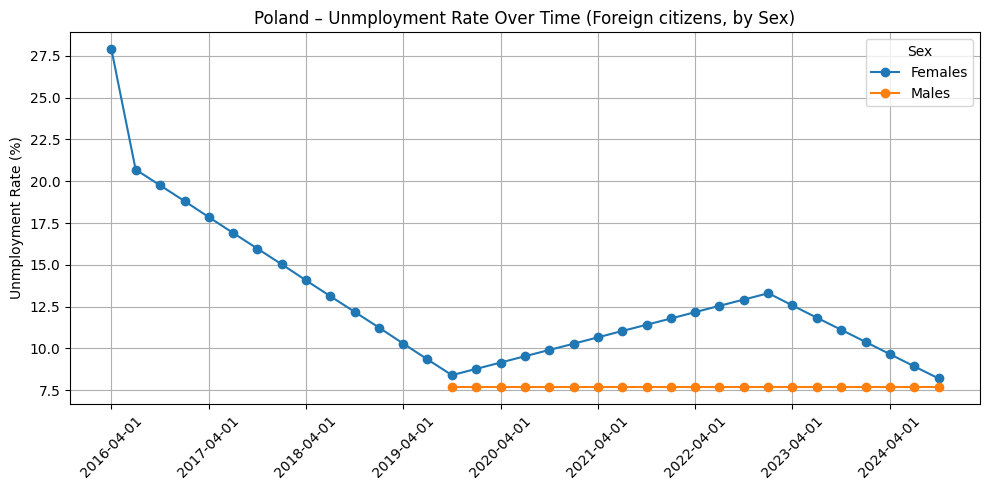

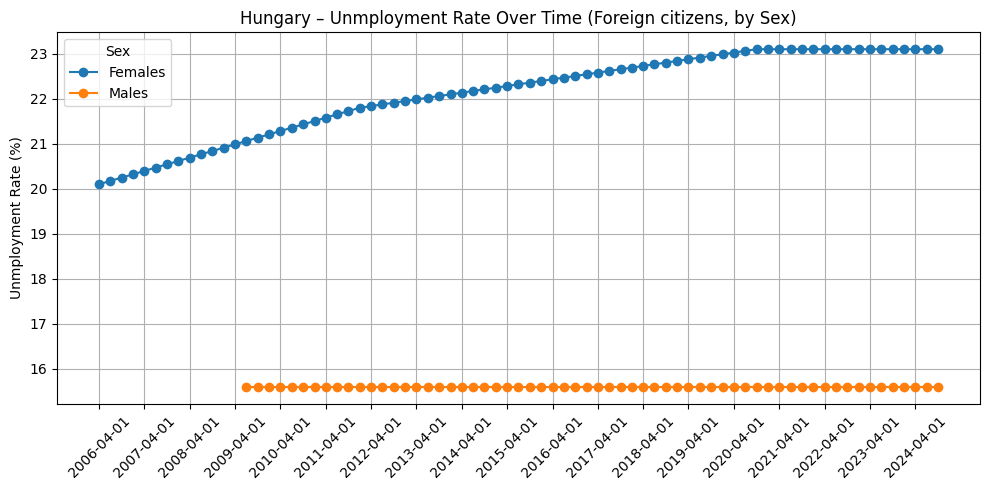

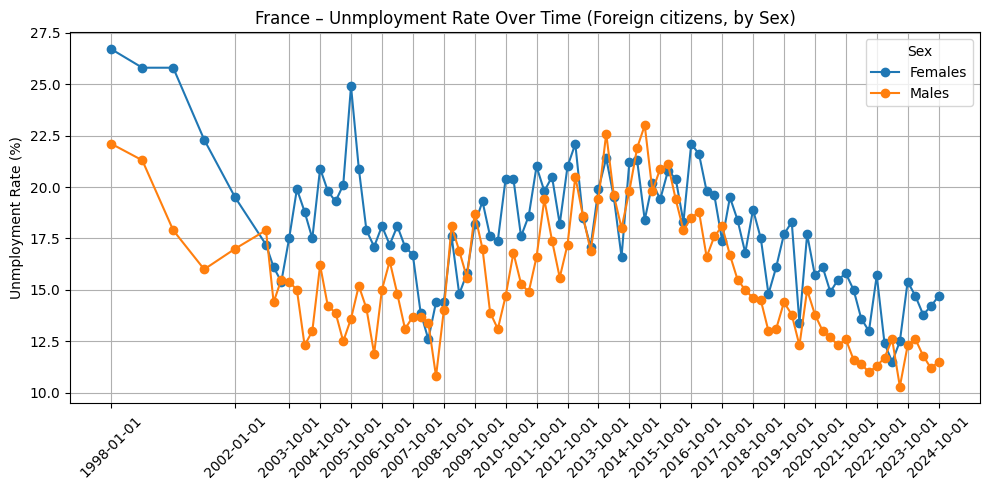

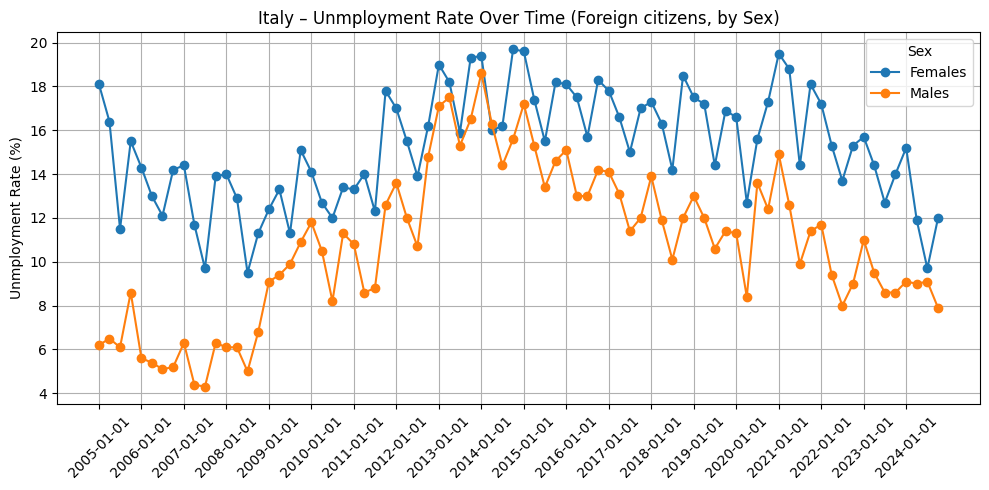

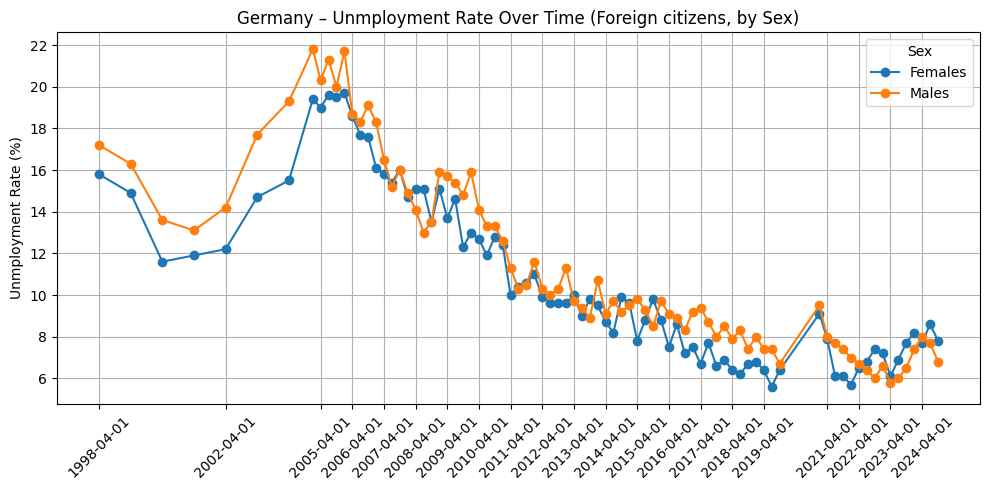

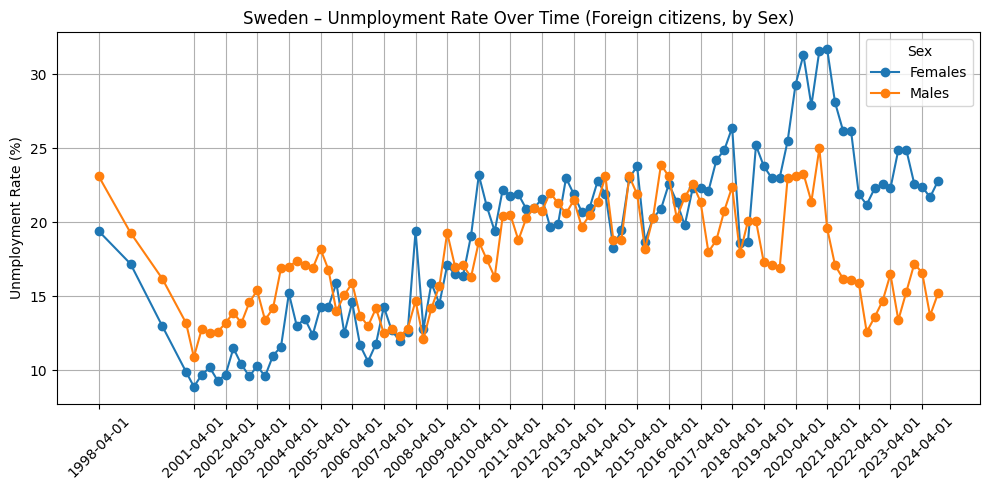

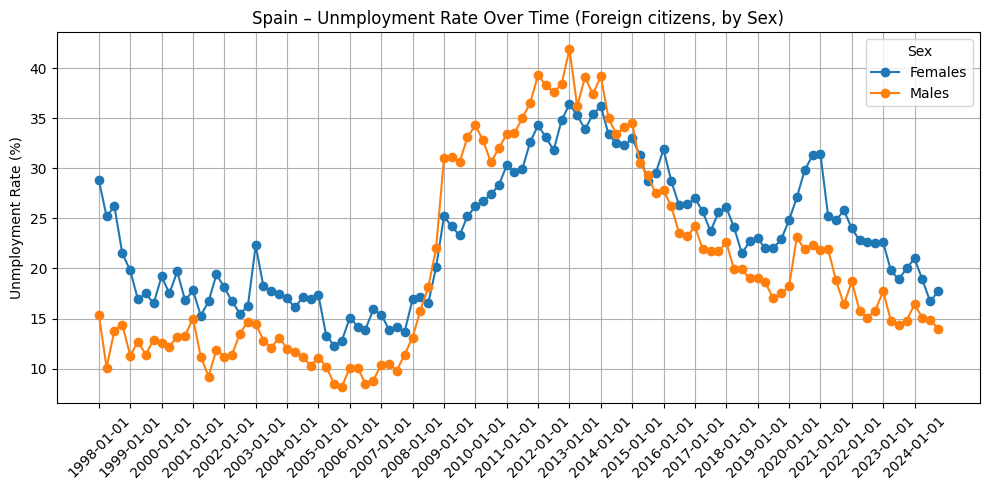

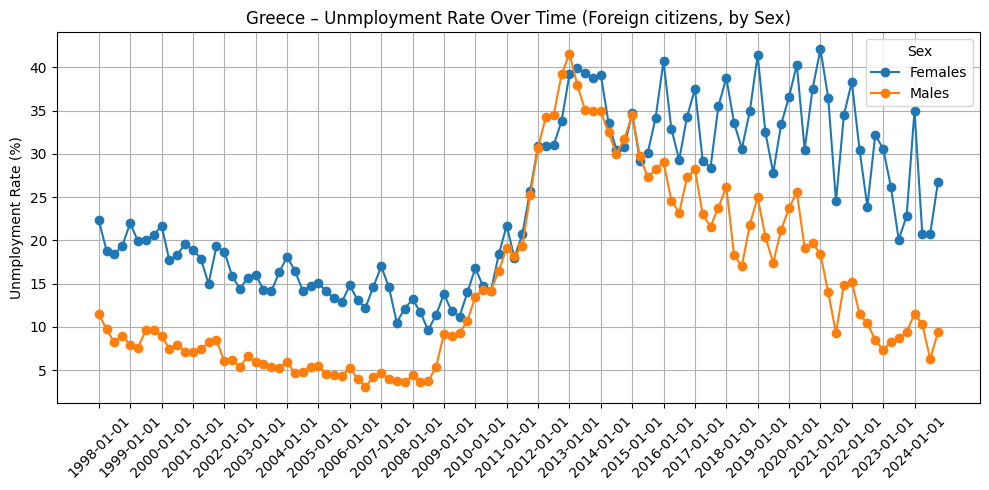

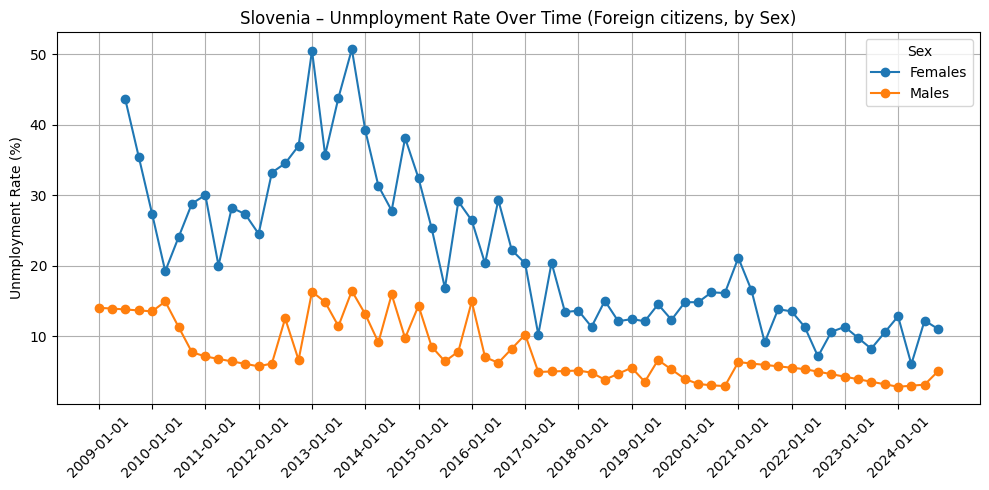

In [ ]:
selected_countries = ["Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]


df = ue_rate_df[
    (ue_rate_df['geo'].isin(selected_countries)) &
    (ue_rate_df['Sex'].isin(['Females', 'Males'])) &
    (ue_rate_df['citizenship'] == 'Foreign country')
].copy()

def quarter_to_datetime(q):
    year, qtr = q[:4], q[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(qtr, '01')
    return pd.to_datetime(f"{year}-{month}-01")

df['quarter_dt'] = df['quarter'].apply(quarter_to_datetime)

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values('quarter_dt')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter_dt'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unmployment Rate Over Time (Foreign citizens, by Sex)")
    plt.ylabel("Unmployment Rate (%)")

    xticks = subset['quarter_dt'].unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


In [ ]:
liberal = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria"]
conservs = ["Poland", "Bulgaria", "Romania", "Hungary",  "Greece"]
selected = liberal + conservs

ue_rate_df['Group'] = ue_rate_df['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

grouped = ue_rate_df[ue_rate_df['Group'] != 'Other'].groupby(['quarter', 'Group'])['unemployment_rate'].mean().reset_index()

fig = px.line(
    grouped,
    x='quarter',
    y='unemployment_rate',
    color='Group',
    title='Average Unemployment Rate per Quarter by Political Group',
    labels={
        'quarter': 'Quarter',
        'unemployment_rate': 'Unemployment Rate',
        'Group': 'Political Group'
    },
    width=1000,
    height=500,
    markers=True
)
fig.show()


### Mapy

In [ ]:
ue_rate_df['date'] = pd.to_datetime(ue_rate_df['date'], format="%Y-%m-%d")

In [ ]:
def get_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except LookupError:
        return None

ue_rate_df['iso_a3'] = ue_rate_df['geo'].apply(get_iso3)


In [ ]:
filtered = ue_rate_df.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'unemployment_rate': 'mean'
})
filtered.rename(columns={'unemployment_rate': 'unemployment_rate_mean'}, inplace=True)



fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='unemployment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Mean unemployment rate in Europe (1998–2024)',
    scope='europe'
)
fig.show()

In [ ]:

filtered = ue_rate_df[
    (ue_rate_df['date'].dt.year >= 2015) & (ue_rate_df['date'].dt.year <= 2024)
]

filtered = filtered.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'unemployment_rate': 'mean'
})
filtered.rename(columns={'unemployment_rate': 'unemployment_rate_mean'}, inplace=True)


fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='unemployment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Mean unemployment rate in Europe (2015–2024)',
    scope='europe'
)
fig.show()


In [ ]:
filtered = ue_rate_df[ue_rate_df['date'].dt.year == 2024]


filtered = filtered.groupby(['geo', 'iso_a3'], as_index=False).agg({
    'unemployment_rate': 'mean'
})
filtered.rename(columns={'unemployment_rate': 'unemployment_rate_mean'}, inplace=True)


fig = px.choropleth(
    filtered,
    locations='iso_a3',
    color='unemployment_rate_mean',
    hover_name='geo',
    color_continuous_scale='thermal',
    title='Unemployment rate in Europe in 2024',
    scope='europe'
)
fig.show()


Employment by citizenship per thousand people

In [ ]:
emp_cit_df = pd.read_csv('../processed_data/employment_by_citizenship.csv')

In [ ]:
emp_cit_df.head()

,geo,Number in 1000 persons,year,Sex
0,Austria,1570.0,1995,Females
1,Austria,1555.1,1996,Females
2,Austria,1557.1,1997,Females
3,Austria,1574.3,1998,Females
4,Austria,1600.4,1999,Females


### Analiza dla cudzoziemców w wybranych krajach

In [ ]:
selected_countries = ["Romania", "Bulgaria", "Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

foreign_employment = emp_cit_df[
    (emp_cit_df['citizen'] == 'Foreign country') & 
    (emp_cit_df['geo'].isin(selected_countries))
]

plt.figure(figsize=(12, 7))
for country in selected_countries:
    data = foreign_employment[(foreign_employment['geo'] == country) & (foreign_employment['sex'] == "Total")]
    plt.plot(data['year'], data['Number per 1000 people'], marker='o', label=country)

plt.title('Foreign Employment Trends in Selected Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Foreign Employees in Thousands')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

KeyError: 'citizen'

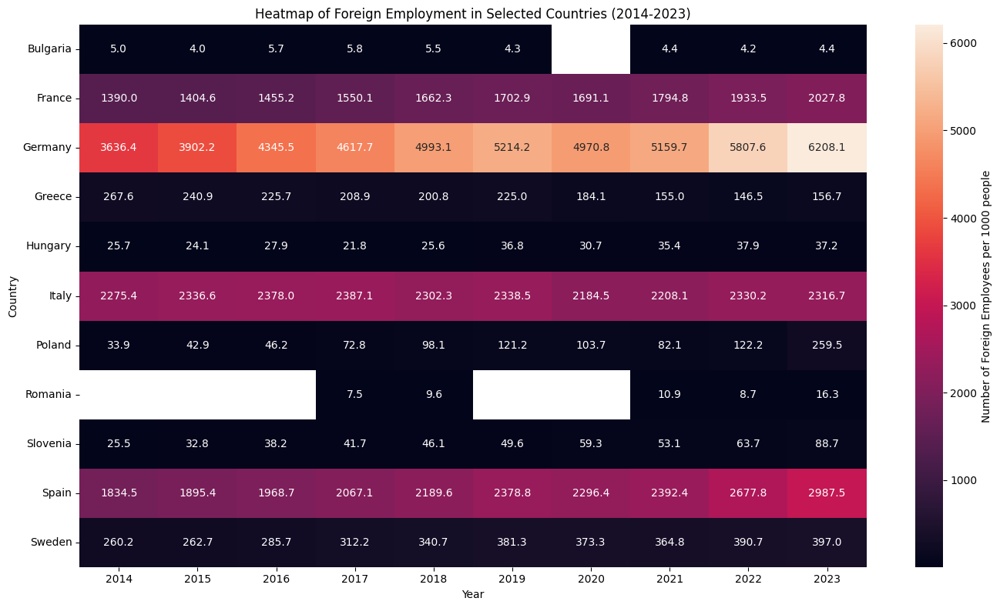

In [ ]:
foreign_employment = emp_cit_df[
    (emp_cit_df['citizen'] == 'Foreign country') & 
    (emp_cit_df['geo'].isin(selected_countries)) &
    (emp_cit_df['sex'] == "Total")
]

heatmap_data = foreign_employment.pivot(index='geo', columns='year', values='Number per 1000 people')


plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".1f",  cbar_kws={'label': 'Number of Foreign Employees per 1000 people'})

plt.title('Heatmap of Foreign Employment in Selected Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Country')

plt.tight_layout()
plt.show()


### Trendy czasowe

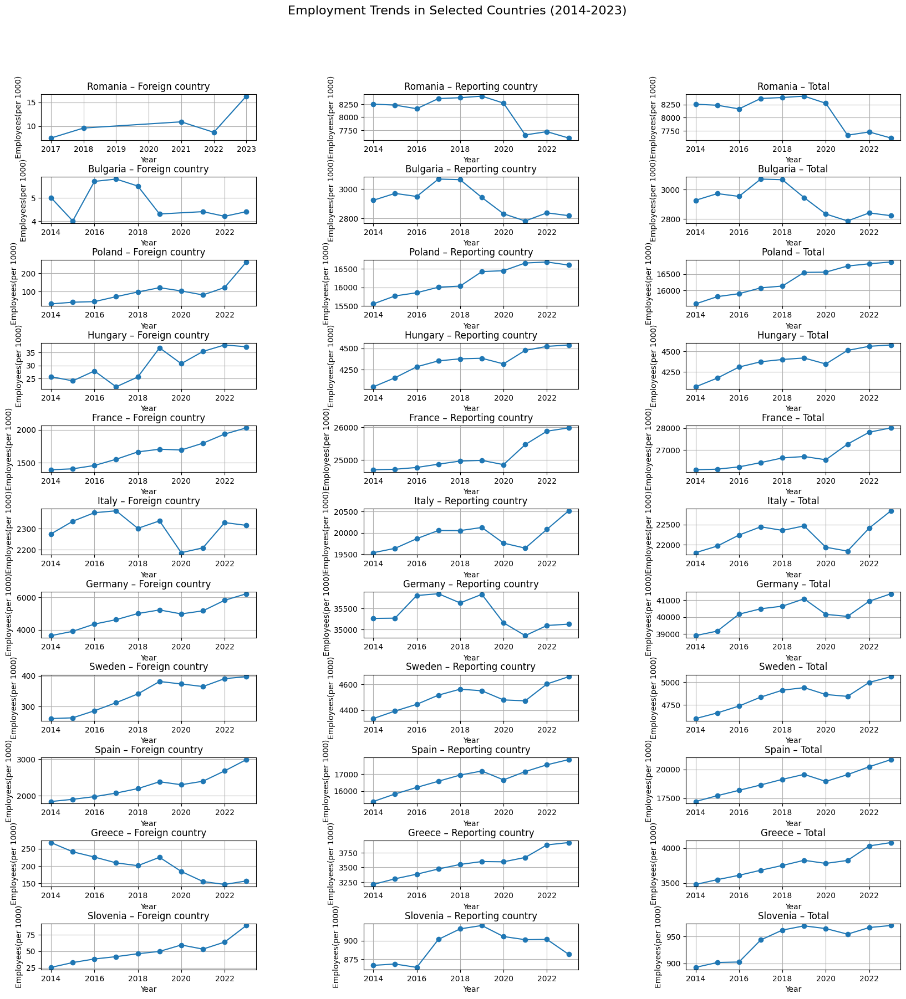

In [ ]:
# subplots for each contry - Foreign vs Nationals vs Total trends
fig, axs = plt.subplots(len(selected_countries), 3)

fig.suptitle('Employment Trends in Selected Countries (2014-2023)', fontsize=16)
fig.subplots_adjust(top=0.9)
fig.subplots_adjust(hspace=0.8)
fig.subplots_adjust(wspace=0.5)
fig.set_size_inches(20, 20)

for country in selected_countries:
    data = emp_cit_df[(emp_cit_df['geo'] == country) & (emp_cit_df['sex'] == 'Total')]
    
    for i, citizenship in enumerate(['Foreign country', 'Reporting country', 'Total']):
        subset = data[data['citizen'] == citizenship]
        axs[selected_countries.index(country), i].plot(subset['year'], subset['Number per 1000 people'], marker='o')
        axs[selected_countries.index(country), i].set_title(f'{country} – {citizenship}')
        axs[selected_countries.index(country), i].set_xlabel('Year')
        axs[selected_countries.index(country), i].set_ylabel('Employees(per 1000)')
        axs[selected_countries.index(country), i].grid(True)

# Employment rates by sex and citizenship yearly

In [5]:
emp_an = pd.read_csv('../processed_data/employmnet_rates_yearly.csv')

In [6]:
emp_an.tail()

,citizenship,geo,employment_rate,year,Sex
7978,Total,United Kingdom,72.7,2015,Total
7979,Total,United Kingdom,73.5,2016,Total
7980,Total,United Kingdom,74.1,2017,Total
7981,Total,United Kingdom,74.7,2018,Total
7982,Total,United Kingdom,75.2,2019,Total


In [7]:
liberal = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria"]
conservs = ["Poland", "Bulgaria", "Romania", "Hungary",  "Greece"]
selected = liberal + conservs

emp_an['Group'] = emp_an['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

grouped = emp_an[emp_an['Group'] != 'Other'].groupby(['year', 'Group'])['employment_rate'].mean().reset_index()

fig = px.line(
    grouped,
    x='year',
    y='employment_rate',
    color='Group',
    title='Average Employment Rate per Year by Political Group',
    labels={
        'year': 'Year',
        'employment_rate': 'Employment Rate',
        'Group': 'Political Group'
    },
    width=1000,
    height=500,
    markers=True
)
fig.show()


In [8]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = emp_an[emp_an['geo'].isin(selected_countries)]

### Taka sama analiza jak dla danych kwartalnych

<Figure size 1200x700 with 0 Axes>

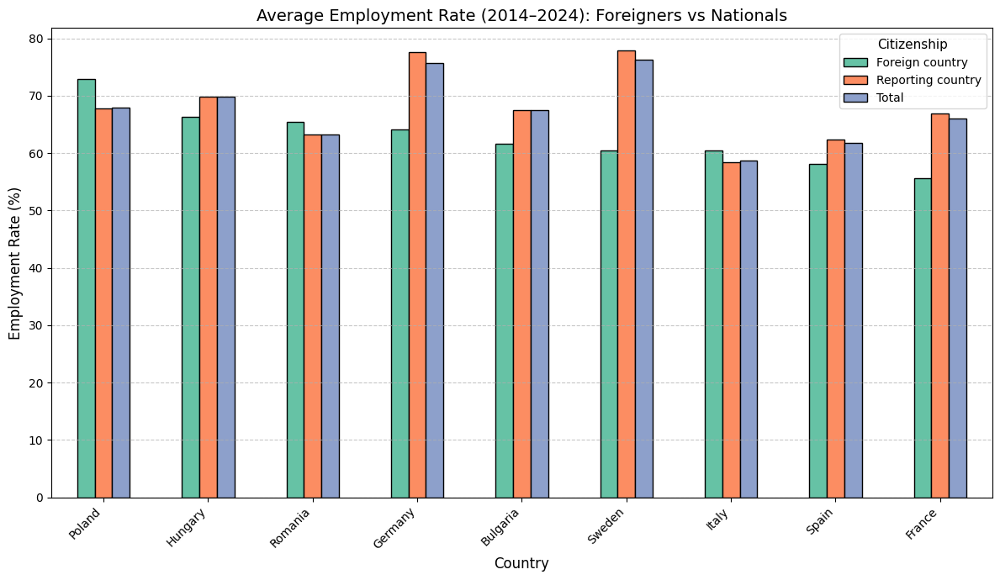

<Figure size 1200x600 with 0 Axes>

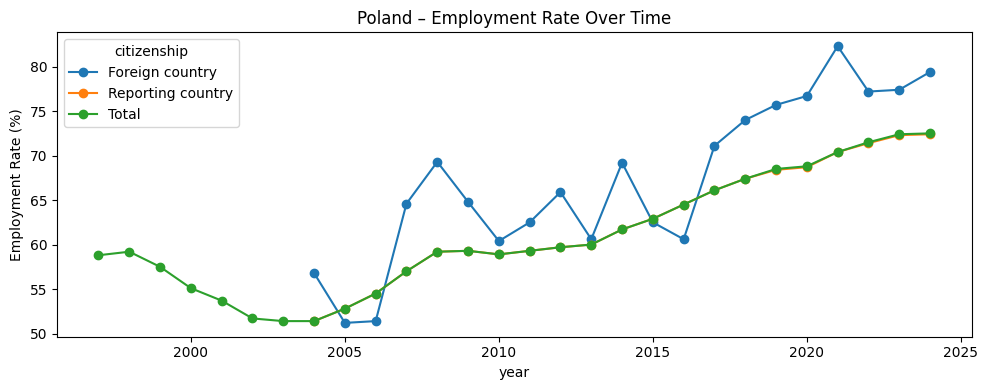

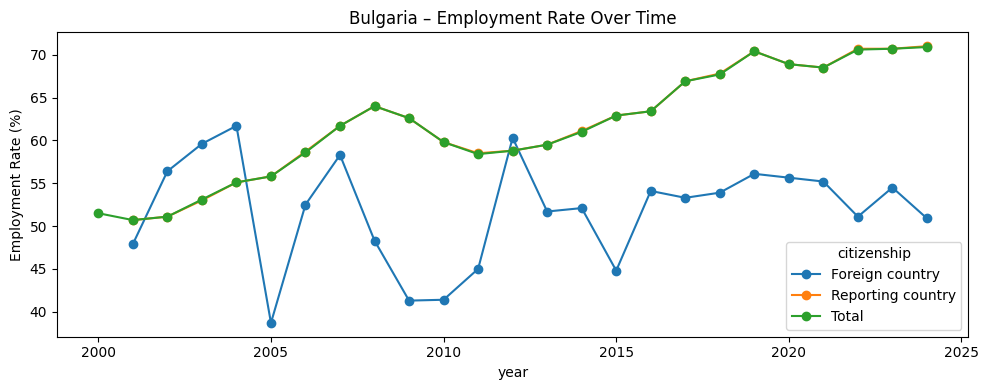

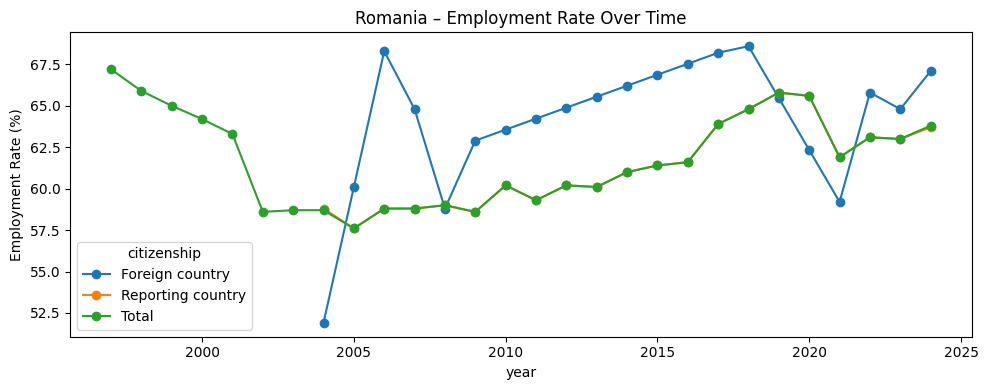

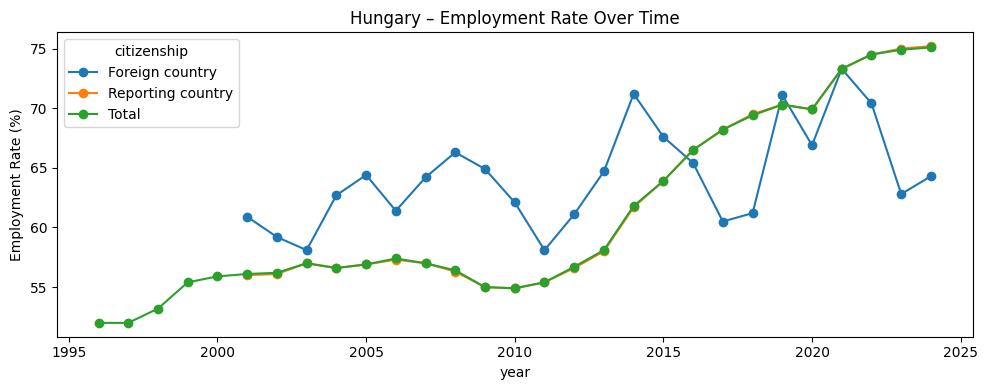

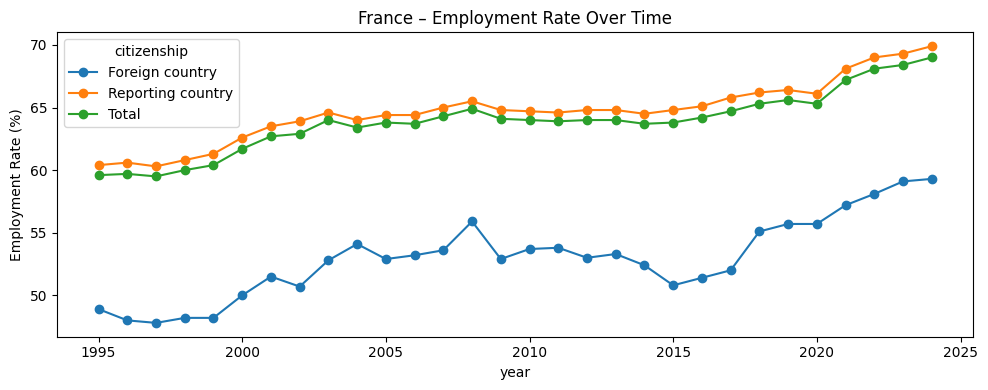

...

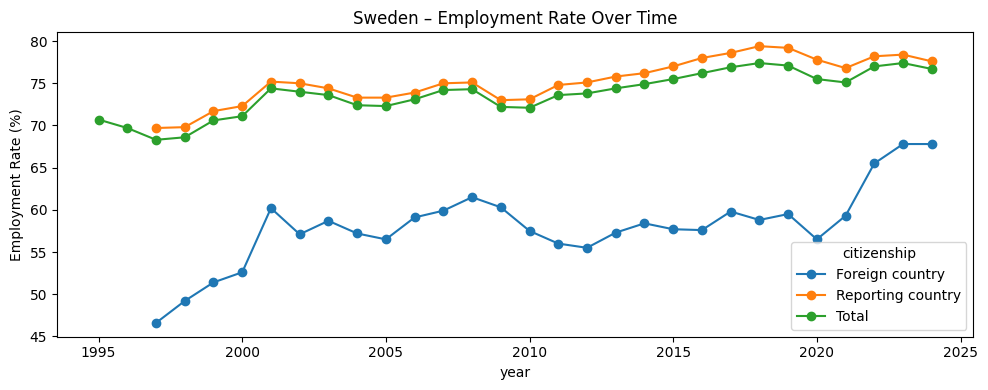

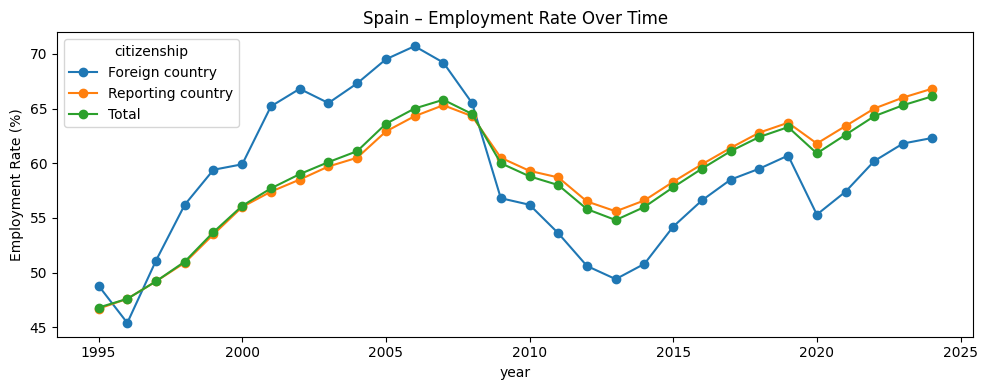

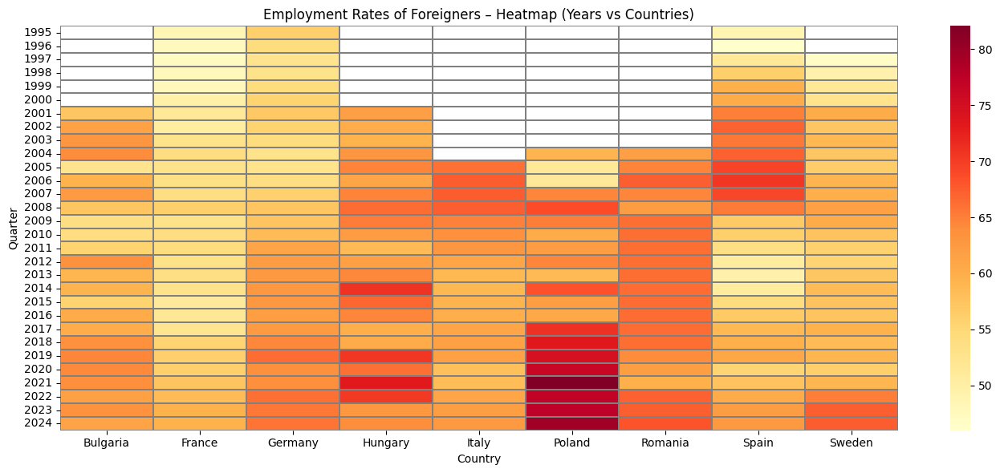

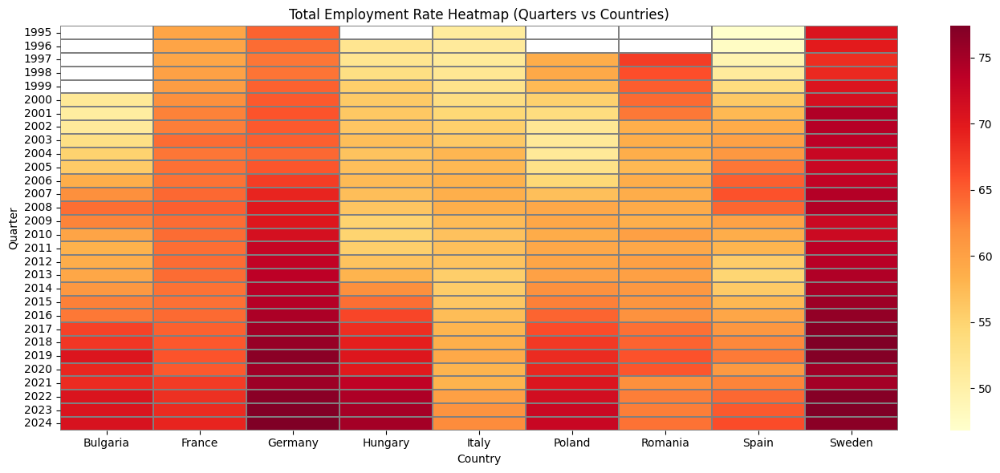

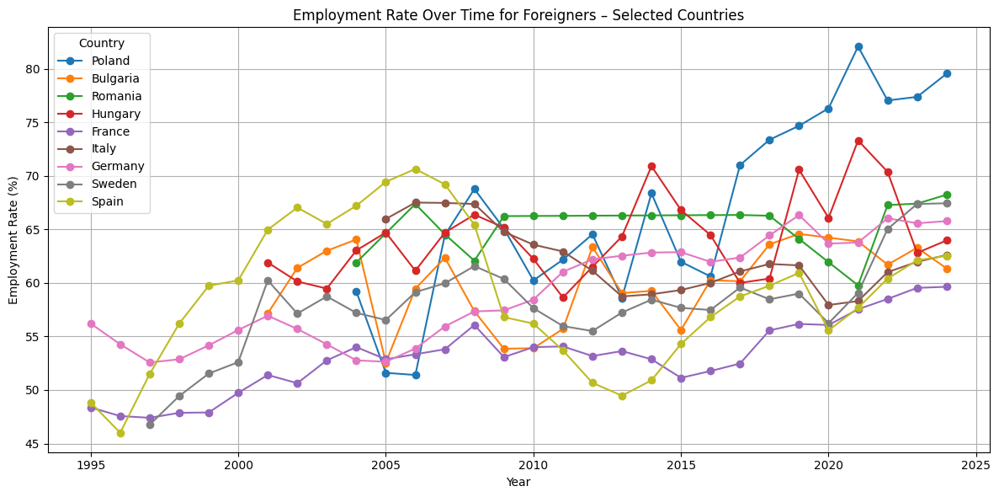

In [14]:
filtered = df[df['year'] >= 2014]
pivot_mean = filtered.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean = pivot_mean.sort_values(by='Foreign country', ascending=False)

plt.figure(figsize=(12,7))
colors = sns.color_palette("Set2")  

pivot_mean.plot(kind='bar', figsize=(12,7), color=colors, edgecolor='black')

plt.title("Average Employment Rate (2014–2024): Foreigners vs Nationals", fontsize=14)
plt.ylabel("Employment Rate (%)", fontsize=12)
plt.xlabel("Country", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Citizenship", fontsize=10, title_fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='year', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[(df['citizenship'] == 'Foreign country')].pivot_table(index='year', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Years vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='year', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Employment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Trends over time for all selected countries - foreigners
plt.figure(figsize=(12,6))

for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'] == 'Foreign country')]
    subset = subset.pivot_table(index='year', values='employment_rate')
    plt.plot(subset.index, subset['employment_rate'], marker='o', label=country)

plt.title("Employment Rate Over Time for Foreigners – Selected Countries")
plt.xlabel("Year")
plt.ylabel("Employment Rate (%)")
plt.legend(title="Country")
plt.grid(True)
plt.tight_layout()
plt.show()


### Analizy związane z płcią - Total

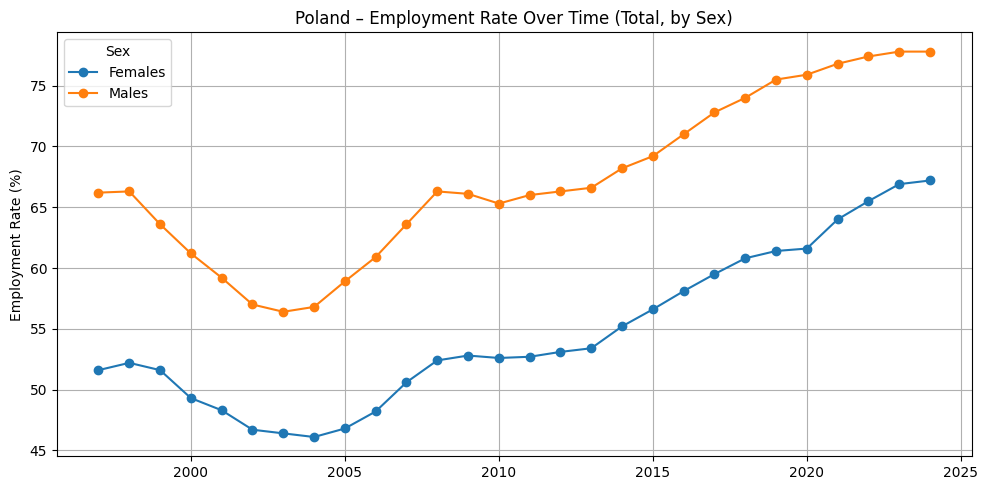

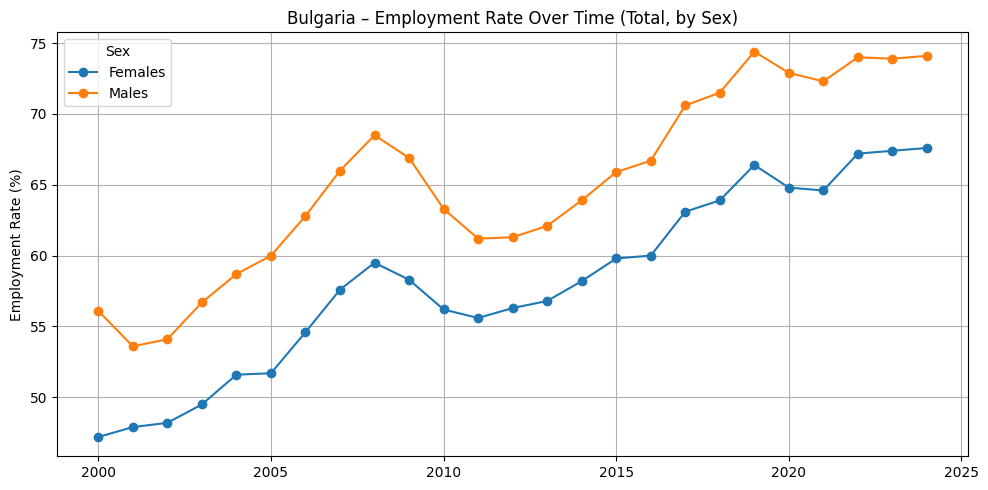

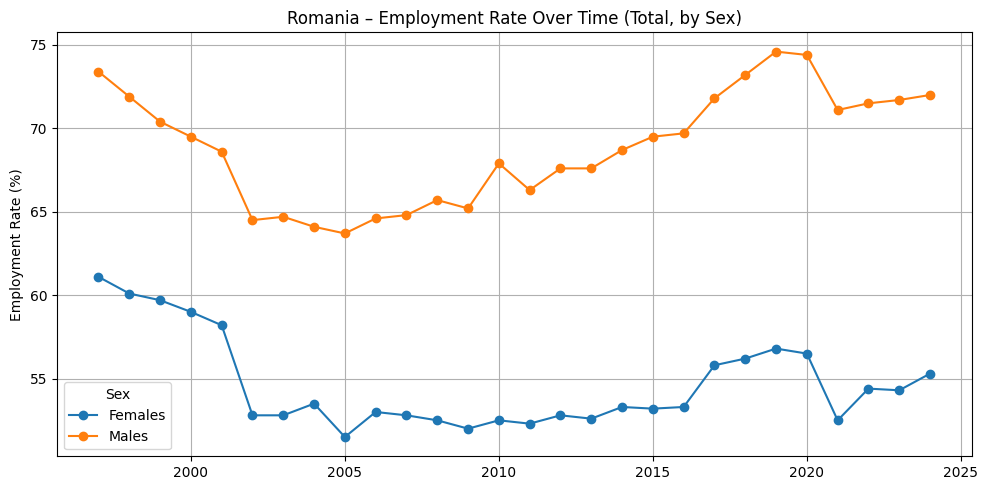

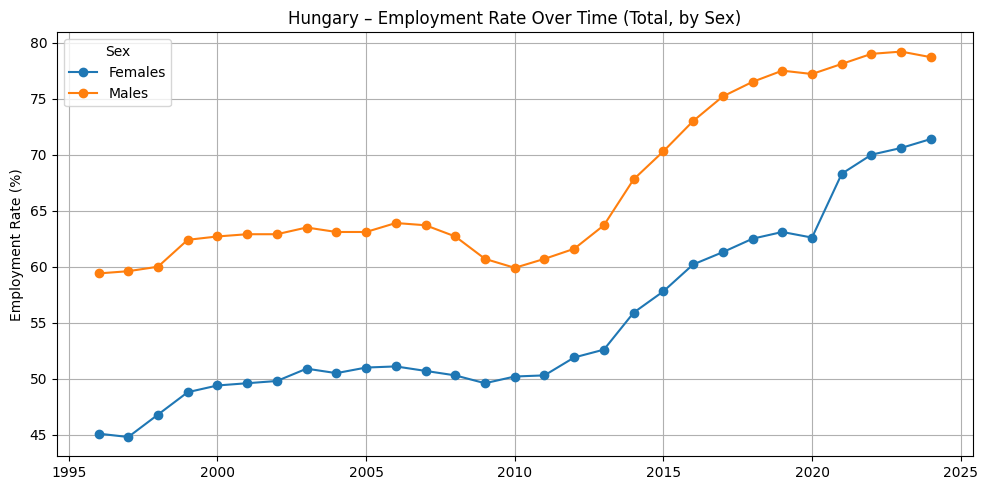

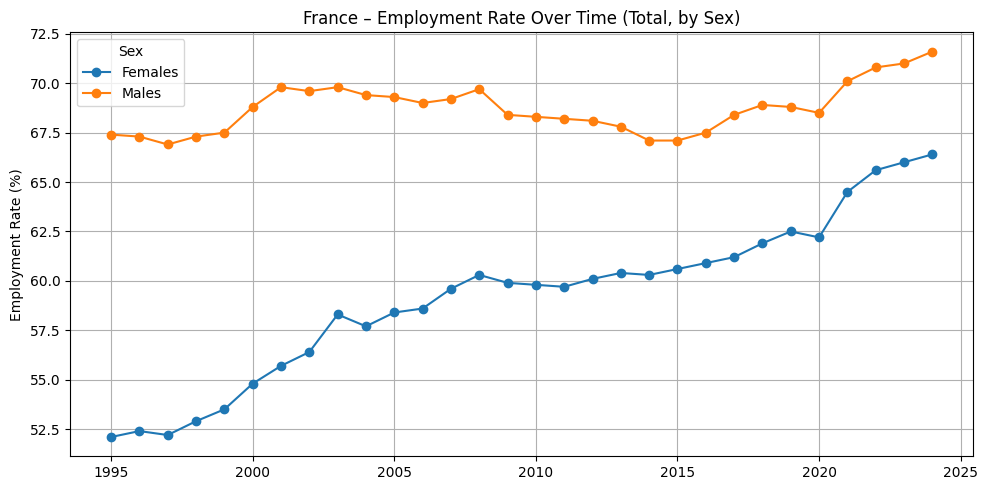

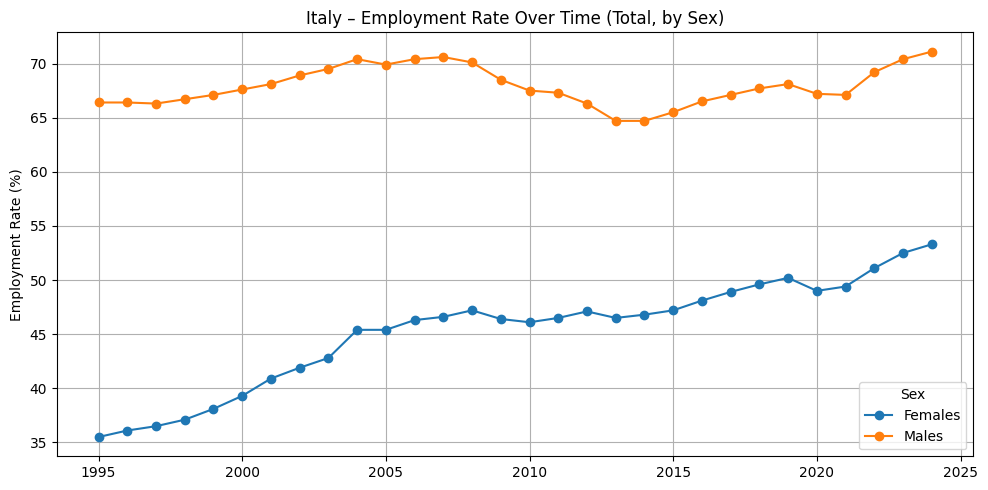

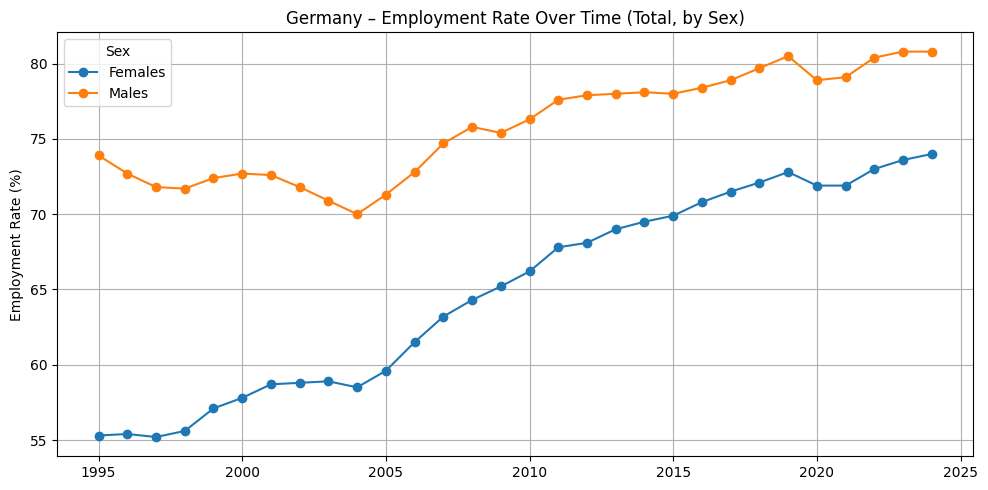

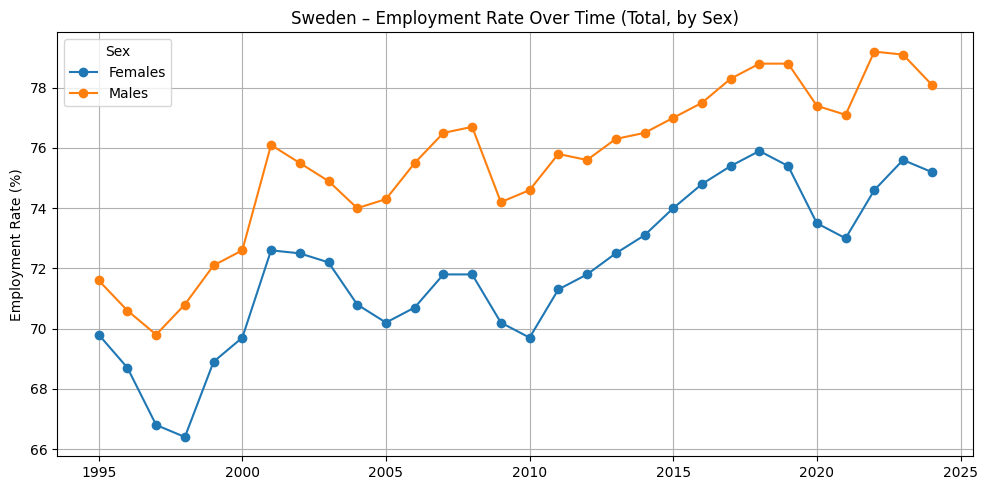

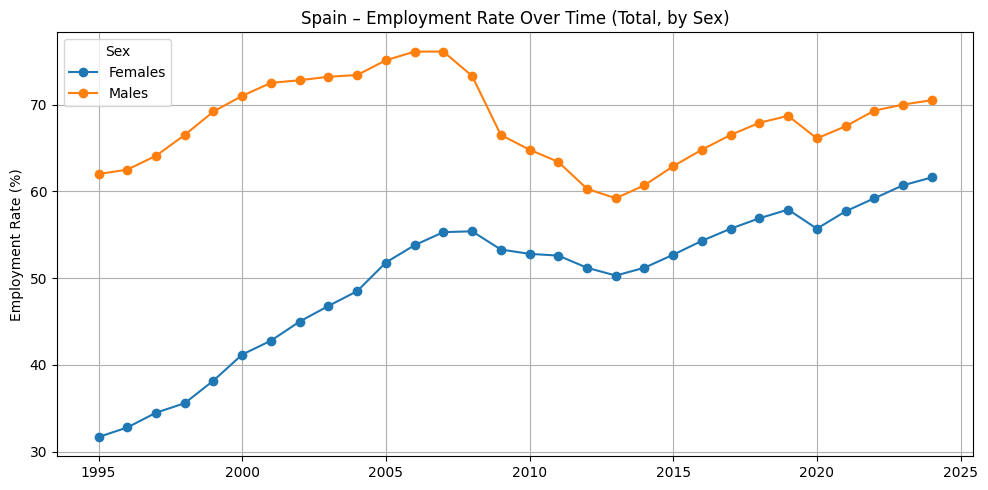

In [ ]:
df = emp_an[
    (emp_an ['geo'].isin(selected_countries)) &
    (emp_an ['Sex'].isin(['Females', 'Males'])) &
    (emp_an ['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Total, by Sex)")
    plt.ylabel("Employment Rate (%)")

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

### Analizy związane z płcią - Foreign country

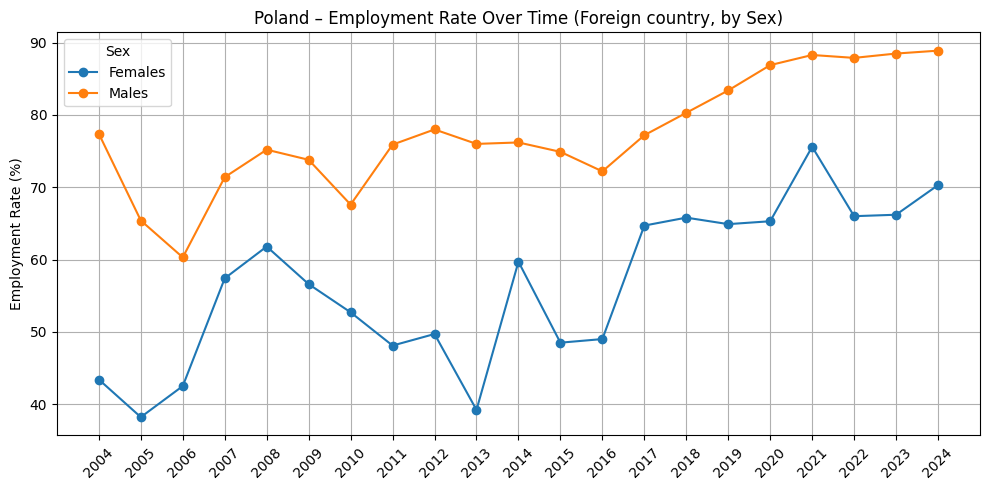

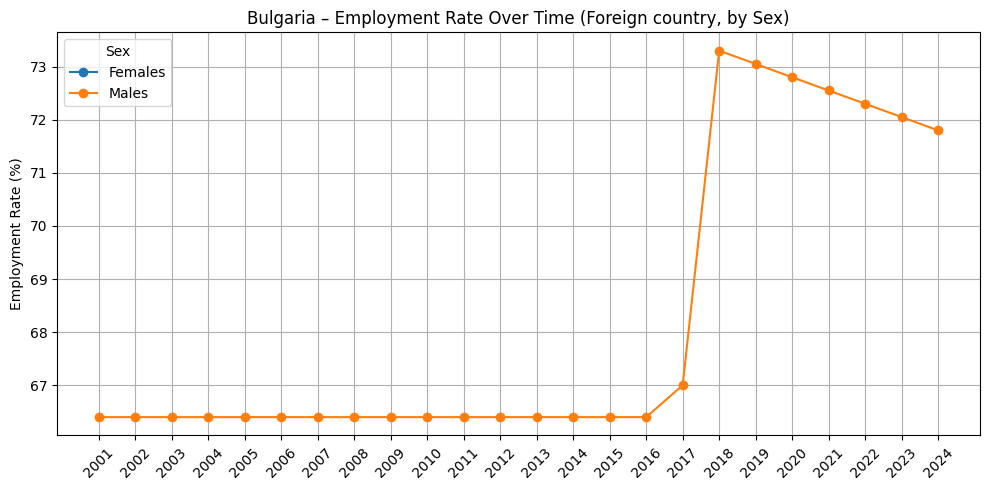

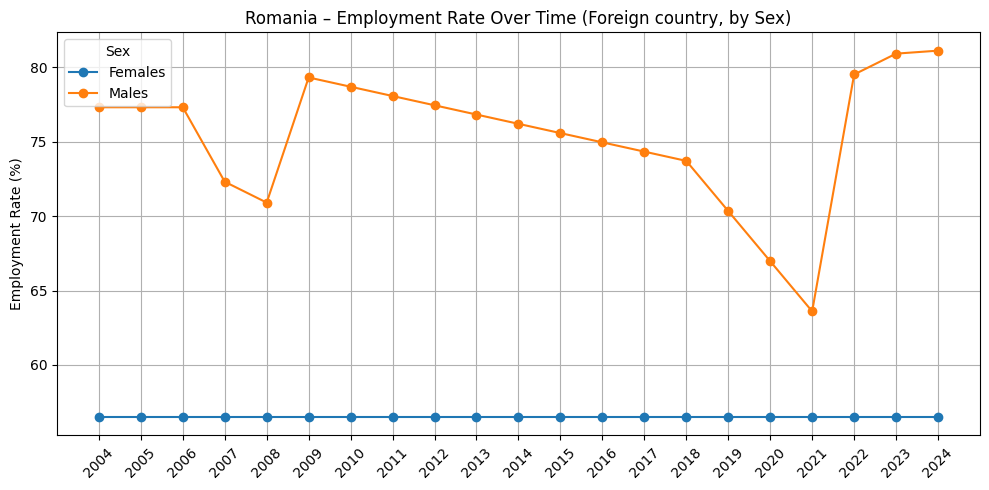

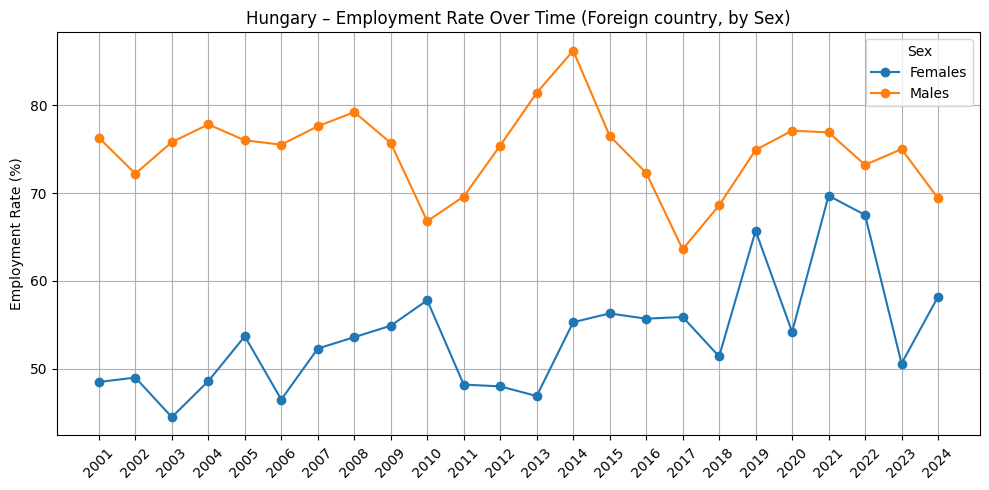

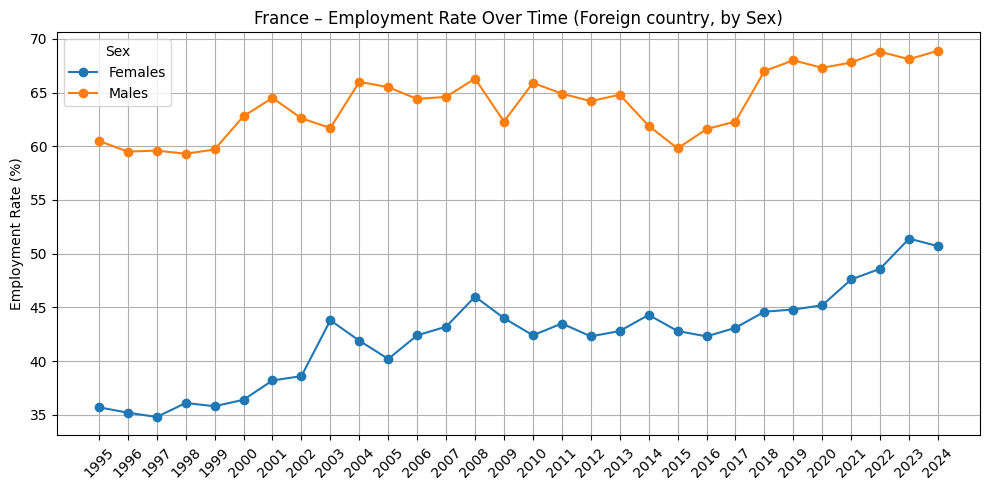

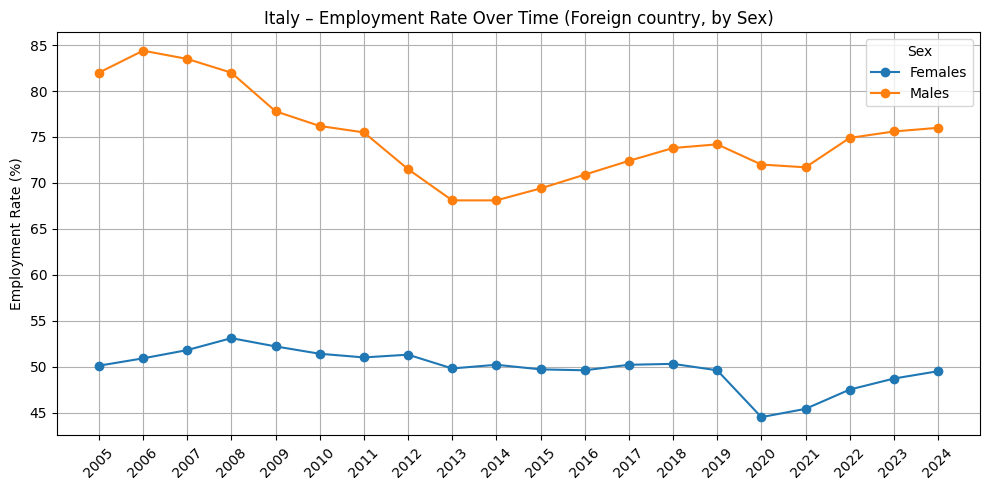

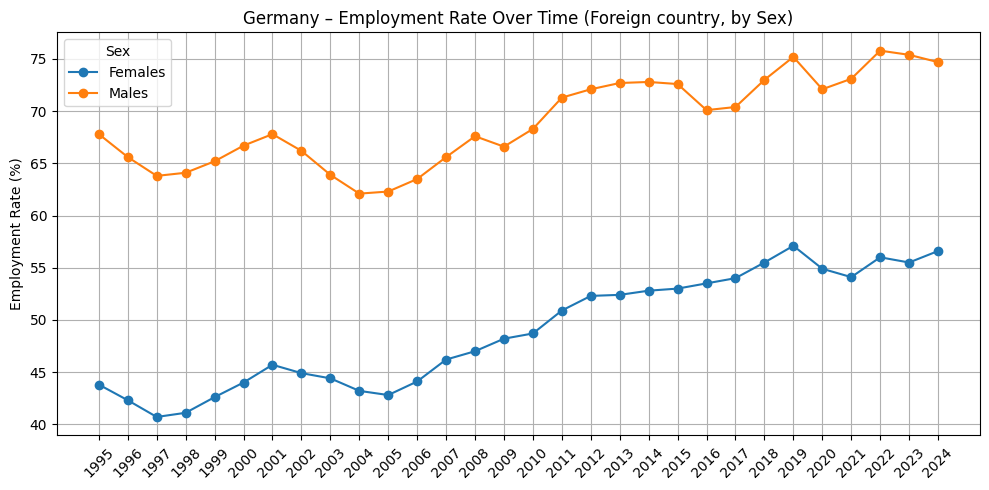

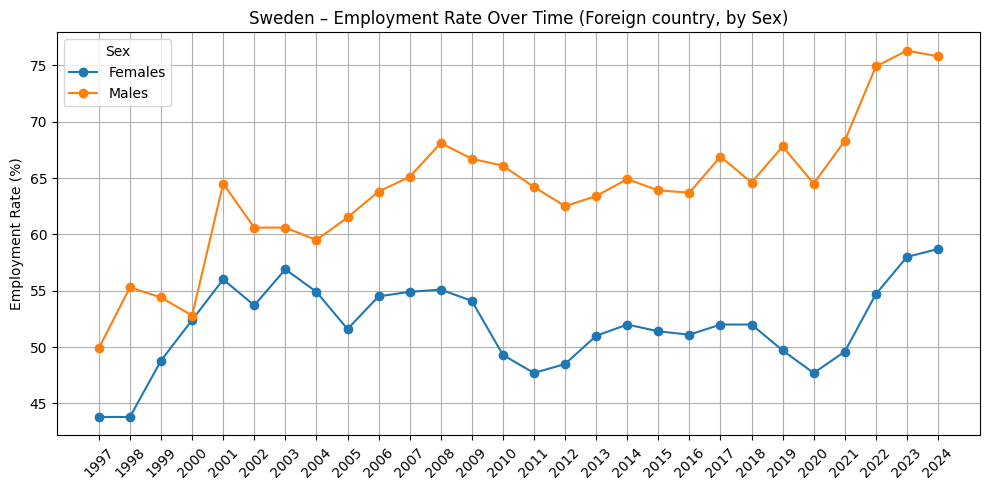

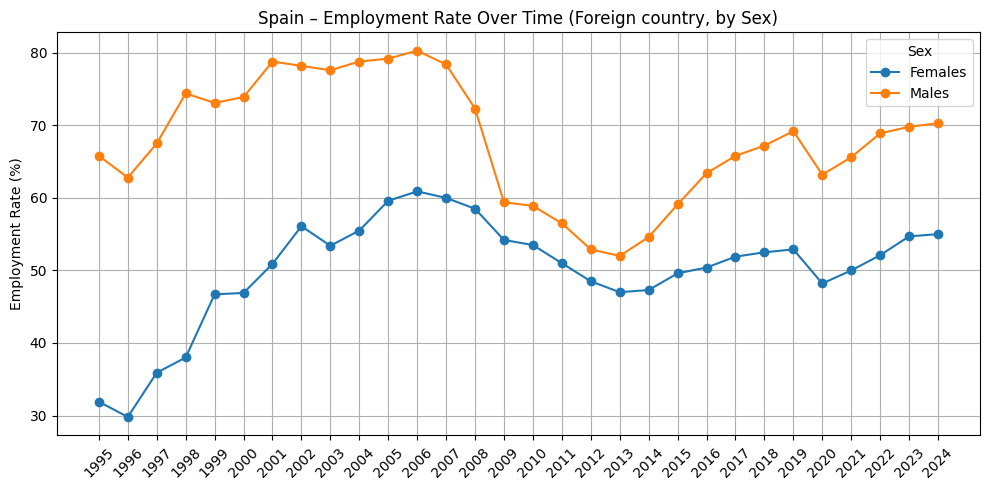

In [ ]:
df = emp_an[
    (emp_an ['geo'].isin(selected_countries)) &
    (emp_an ['Sex'].isin(['Females', 'Males'])) &
    (emp_an ['citizenship'] == 'Foreign country')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Foreign country, by Sex)")
    plt.ylabel("Employment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

# Unemployment rates by sex, citizenship yearly

In [47]:
uemp_an = pd.read_csv('../processed_data/unemploymnet_rates_yearly.csv')


In [48]:
uemp_an.head()

,citizenship,geo,unemployment_rate,year,Sex
0,Foreign country,Austria,7.8,1995,Females
1,Foreign country,Austria,9.4,1996,Females
2,Foreign country,Austria,9.4,1997,Females
3,Foreign country,Austria,8.9,1998,Females
4,Foreign country,Austria,9.2,1999,Females


In [49]:
liberal = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria"]
conservs = ["Poland", "Bulgaria", "Romania", "Hungary",  "Greece"]
selected = liberal + conservs

uemp_an['Group'] = uemp_an['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

grouped = uemp_an[uemp_an['Group'] != 'Other'].groupby(['year', 'Group'])['unemployment_rate'].mean().reset_index()

fig = px.line(
    grouped,
    x='year',
    y='unemployment_rate',
    color='Group',
    title='Average Unemployment Rate per Year by Political Group',
    labels={
        'year': 'Year',
        'unemployment_rate': 'Unemployment Rate',
        'Group': 'Political Group'
    },
    width=1000,
    height=500,
    markers=True
)
fig.show()


In [50]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Austria"]
df = uemp_an[uemp_an['geo'].isin(selected_countries)]

<Figure size 1200x700 with 0 Axes>

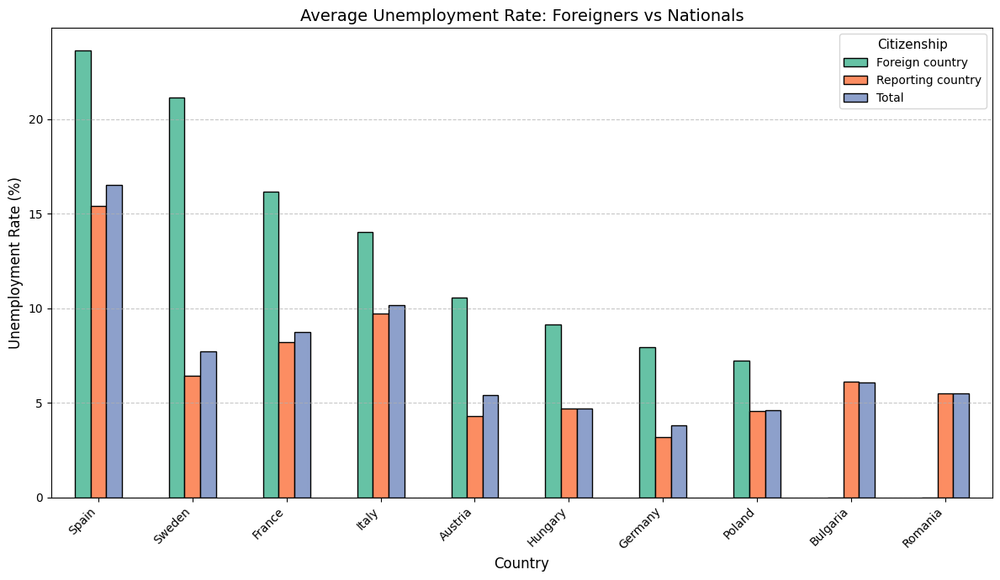

<Figure size 1200x600 with 0 Axes>

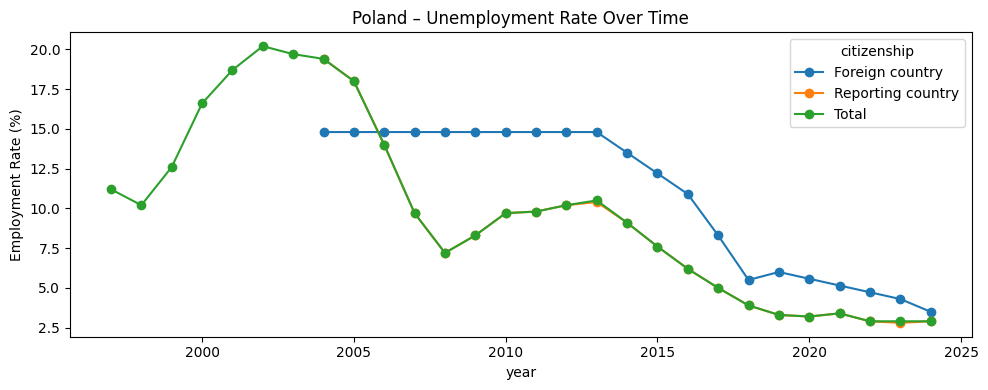

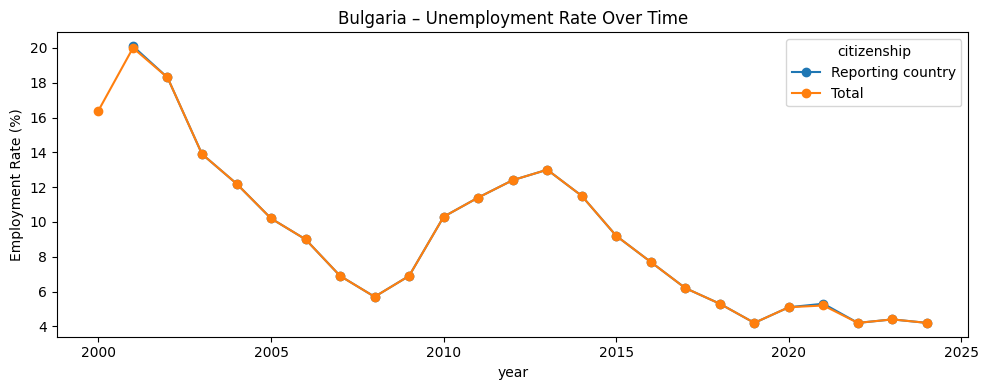

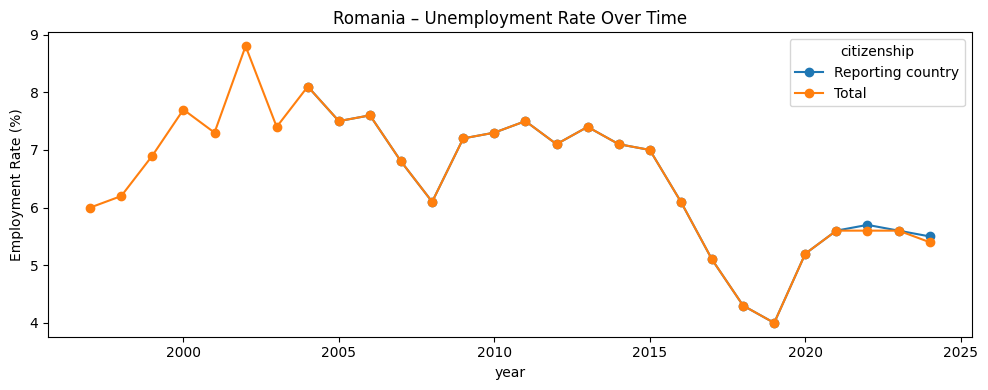

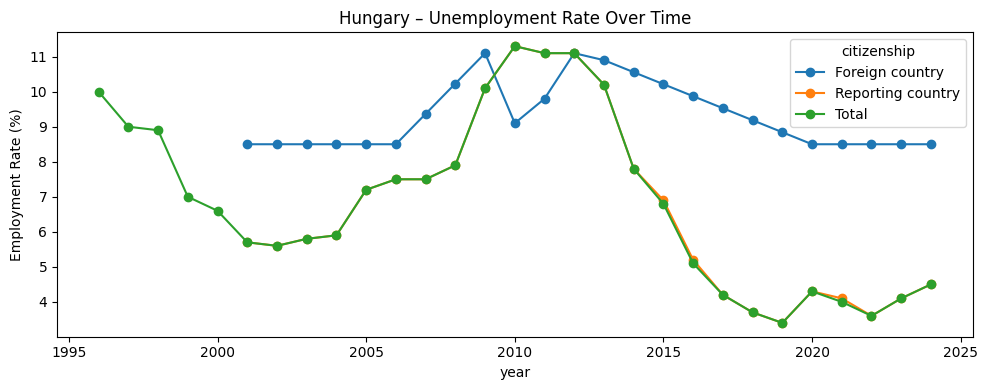

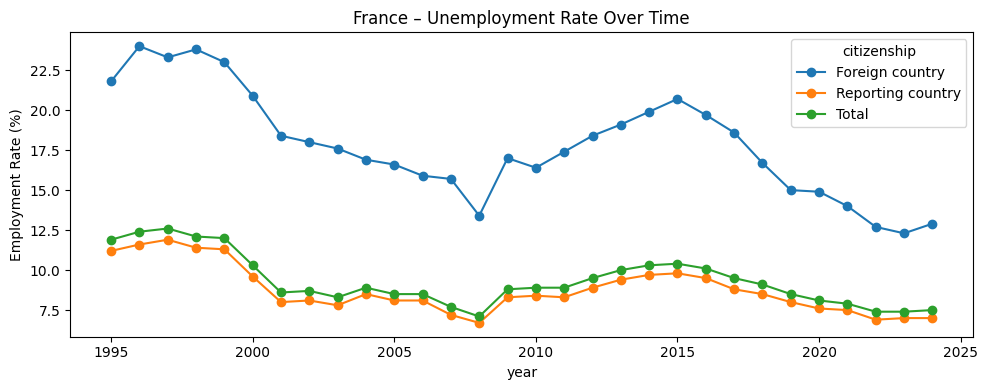

...

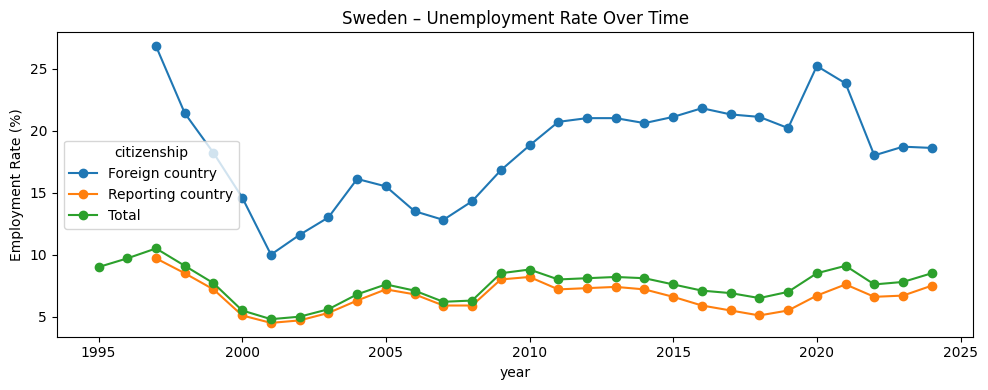

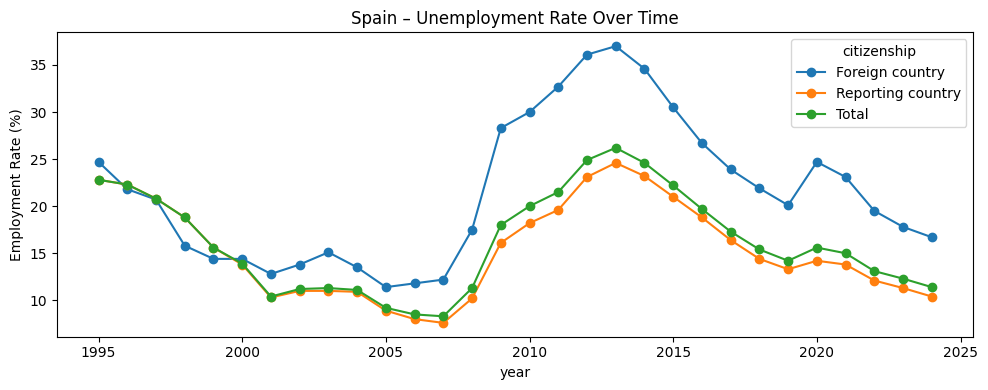

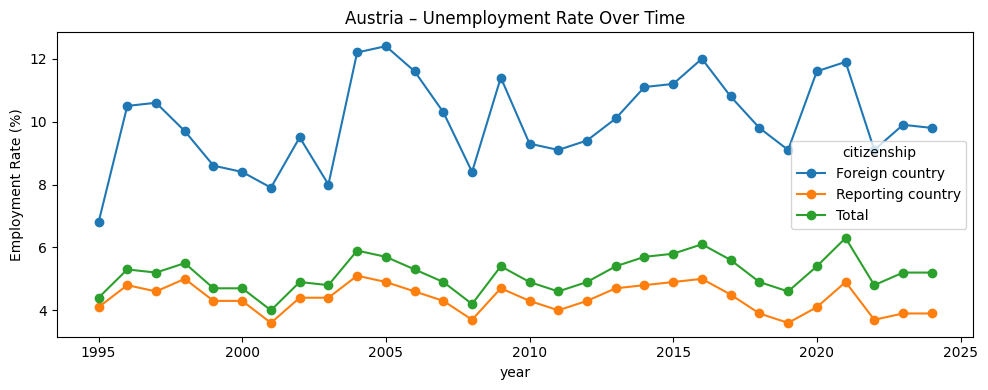

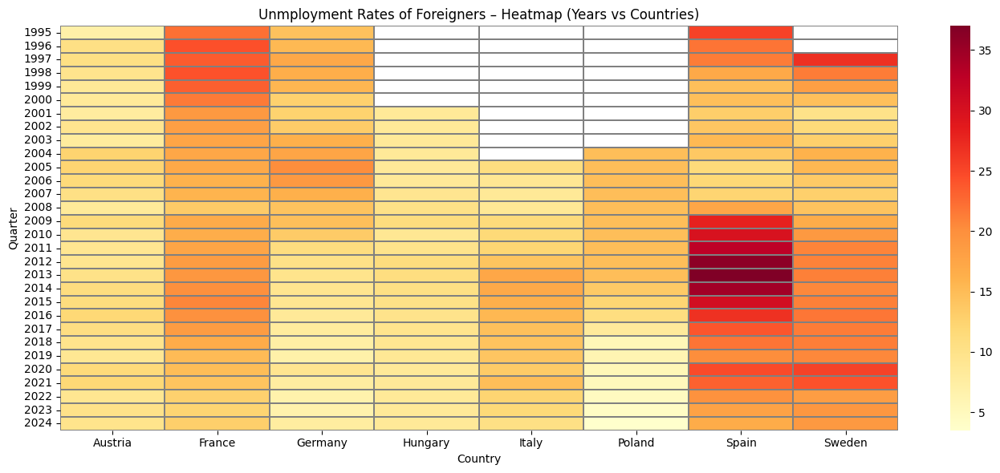

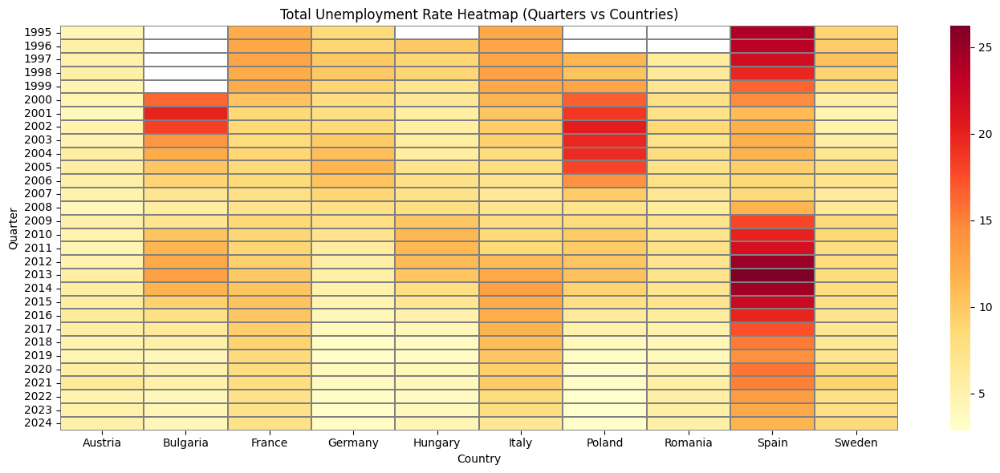

In [51]:
filtered = df[df['year'] >= 2014]
pivot_mean = filtered.groupby(['geo', 'citizenship'])['unemployment_rate'].mean().unstack()

pivot_mean = pivot_mean.sort_values(by='Foreign country', ascending=False)

plt.figure(figsize=(12,7))
colors = sns.color_palette("Set2")

pivot_mean.plot(kind='bar', figsize=(12,7), color=colors, edgecolor='black')

plt.title("Average Unemployment Rate: Foreigners vs Nationals", fontsize=14,)
plt.ylabel("Unemployment Rate (%)", fontsize=12)
plt.xlabel("Country", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Citizenship", fontsize=10, title_fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='year', columns='citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='year', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Unmployment Rates of Foreigners – Heatmap (Years vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='year', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Unemployment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()



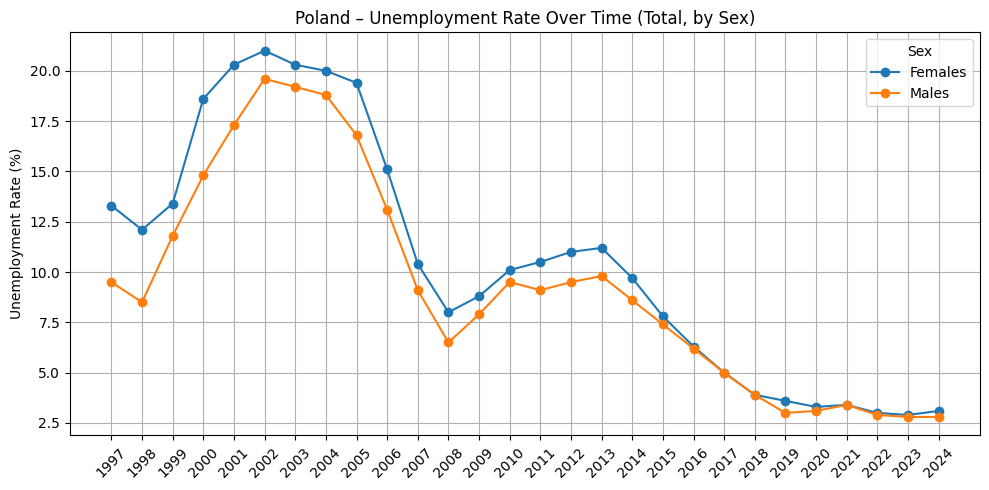

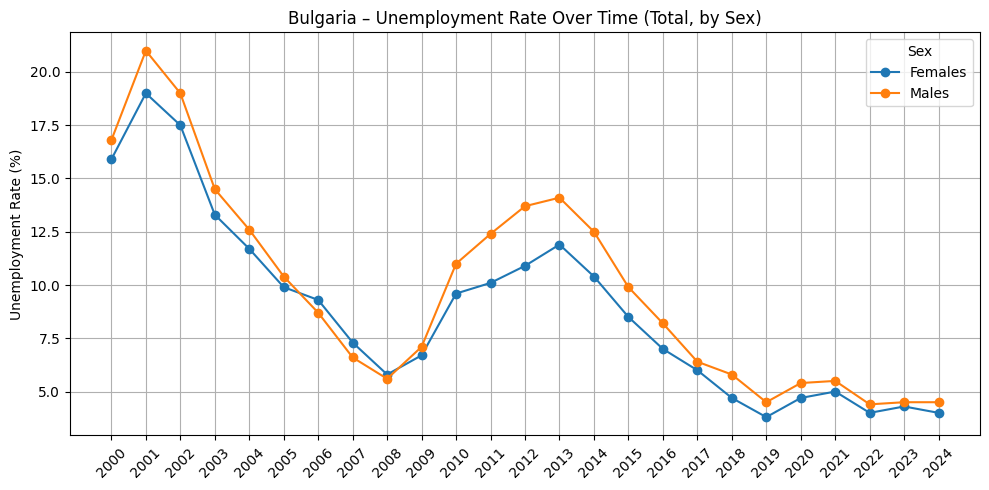

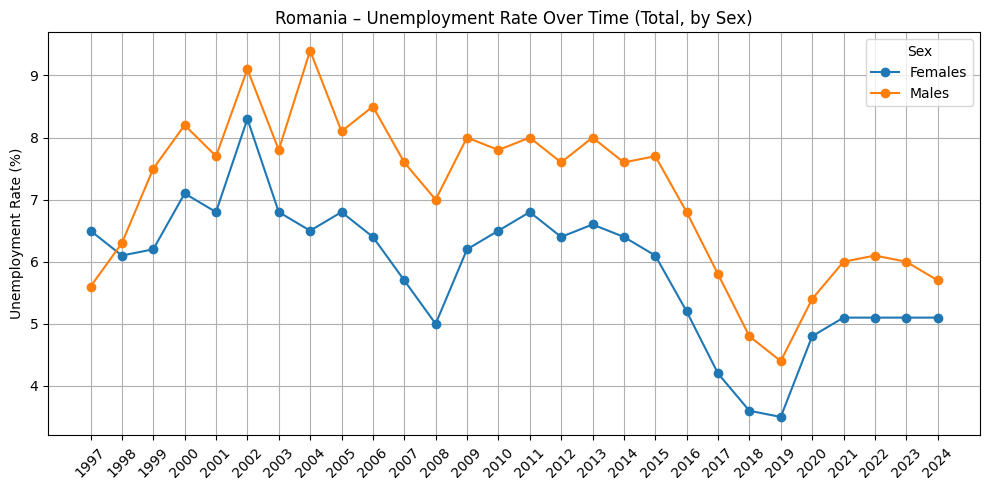

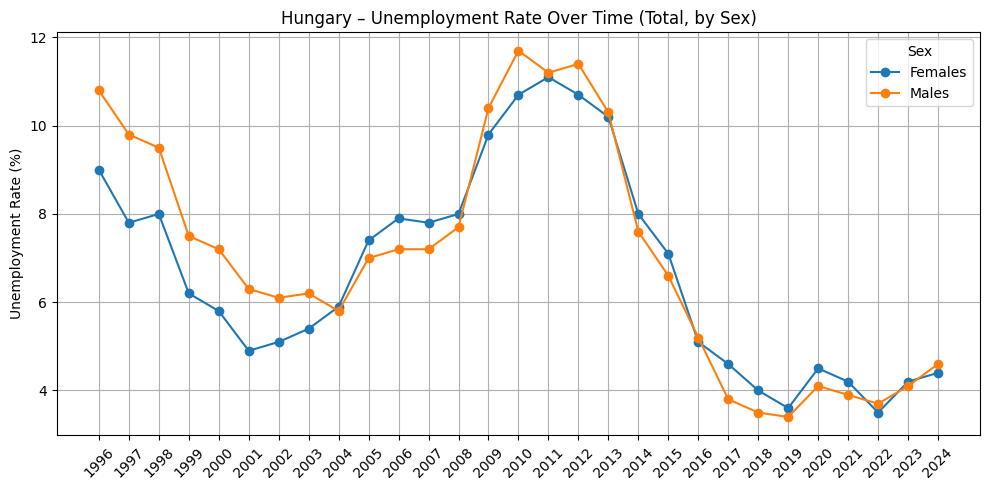

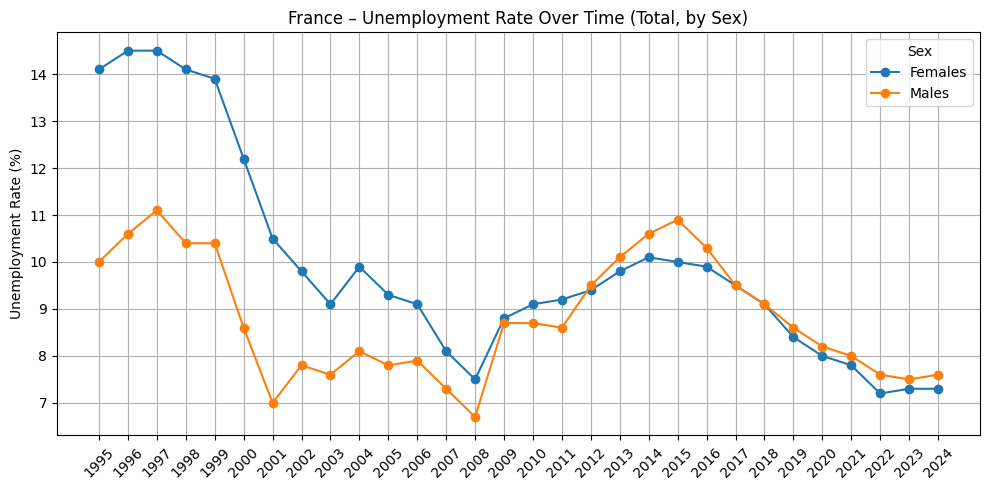

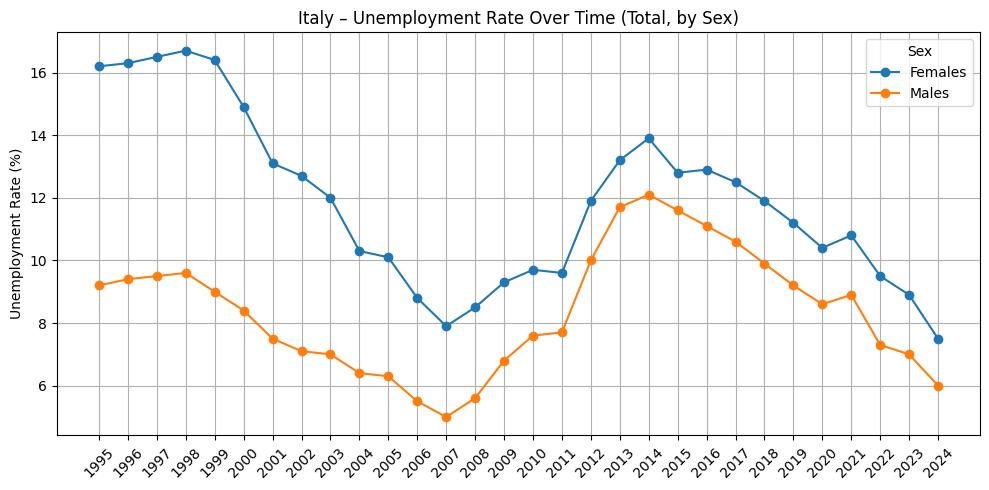

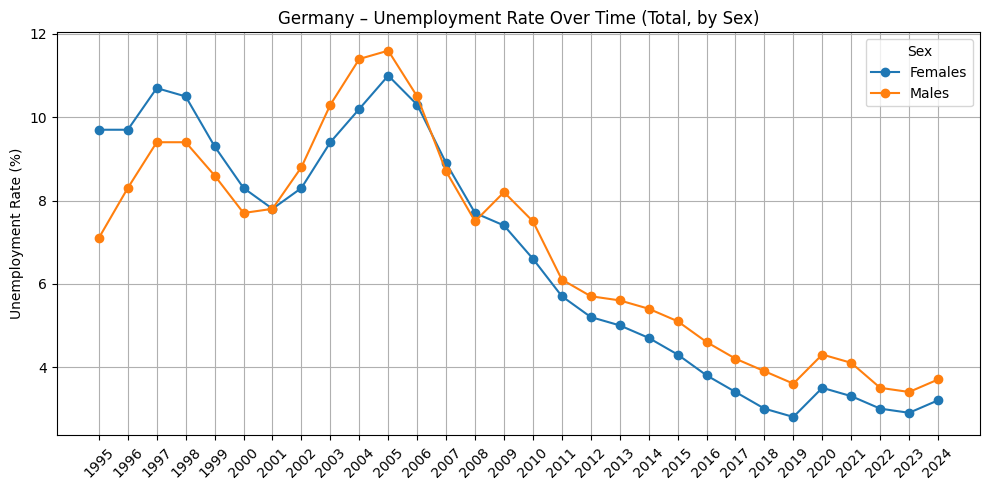

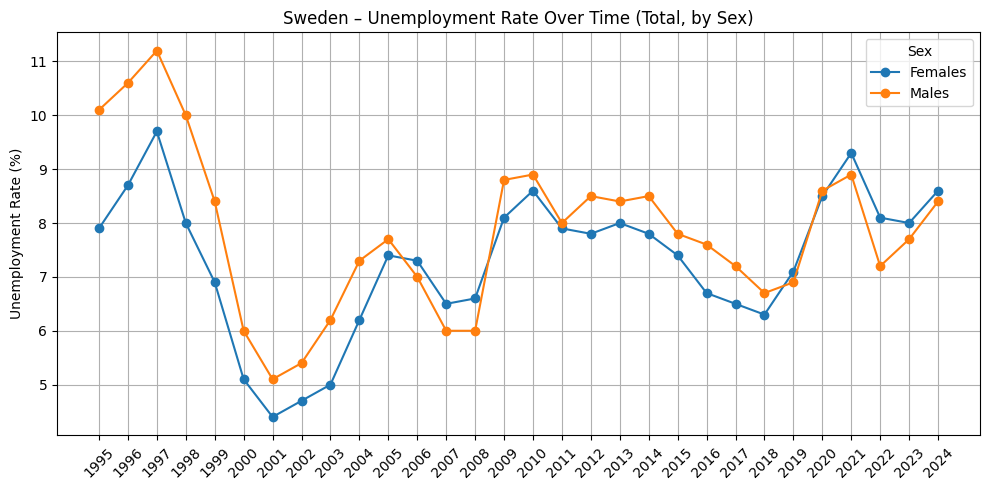

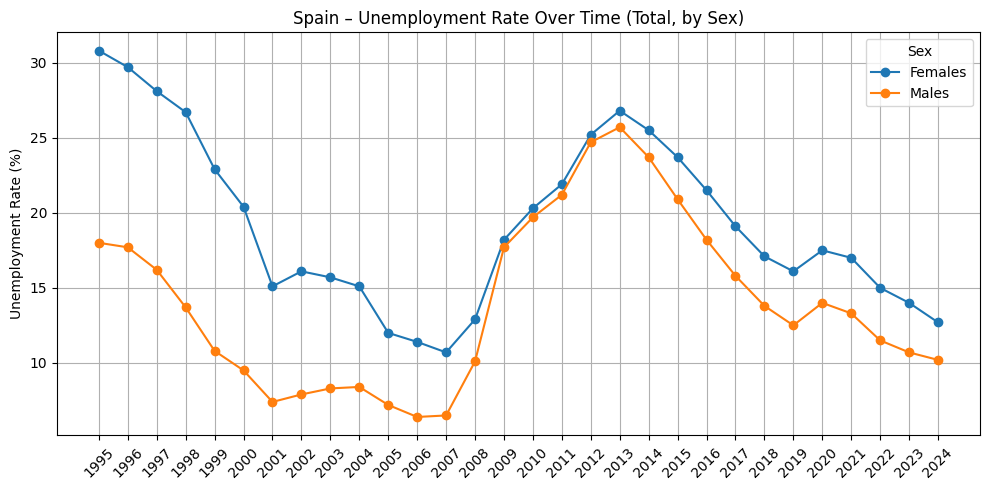

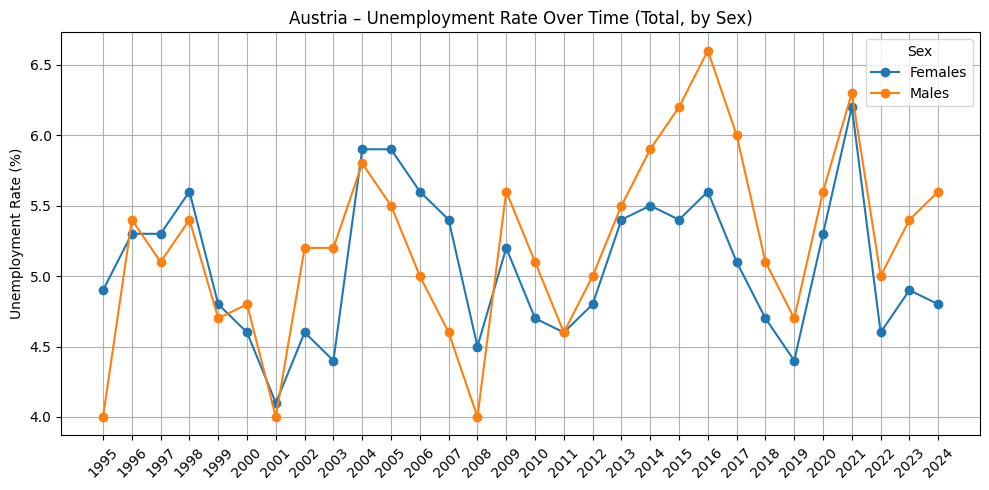

In [52]:
df = uemp_an[
    (uemp_an ['geo'].isin(selected_countries)) &
    (uemp_an ['Sex'].isin(['Females', 'Males'])) &
    (uemp_an ['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Total, by Sex)")
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()



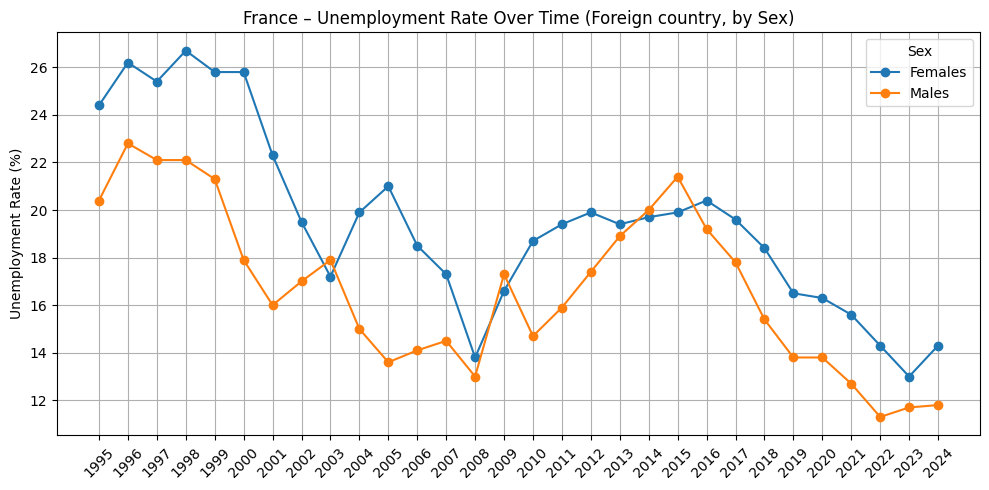

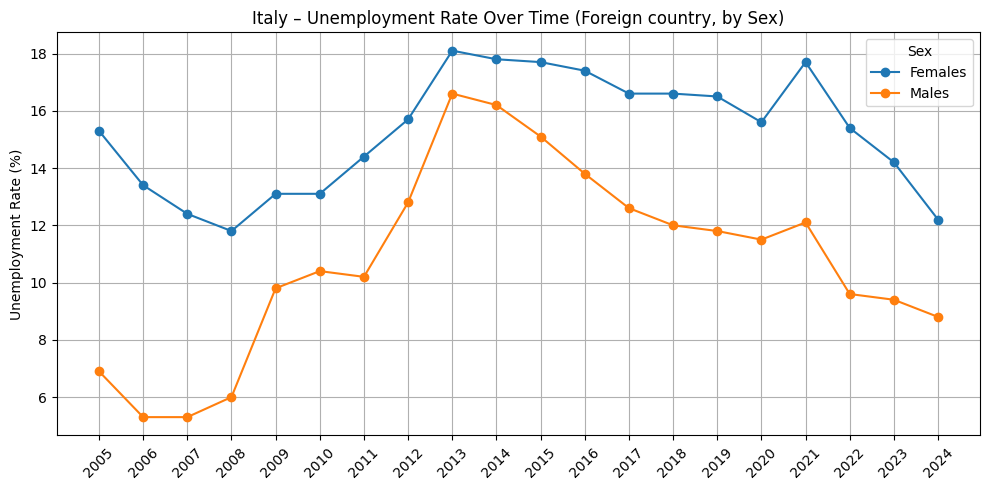

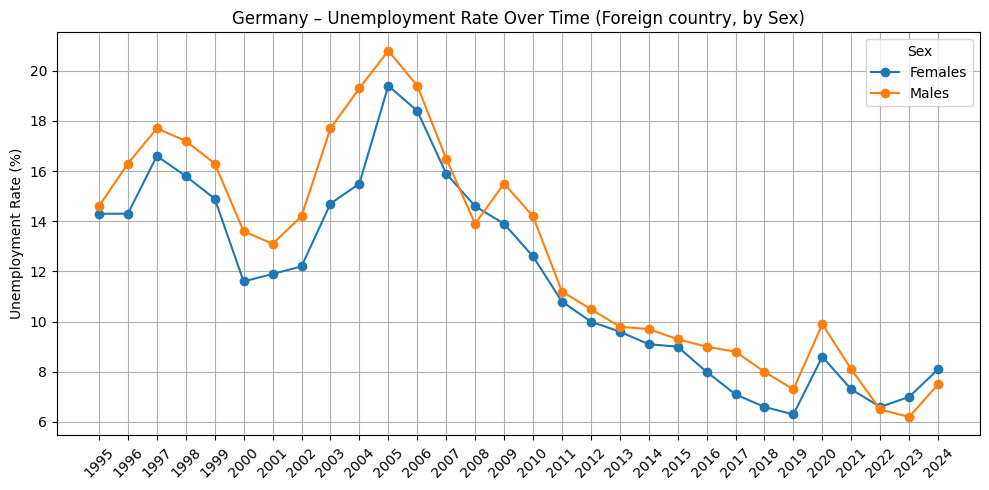

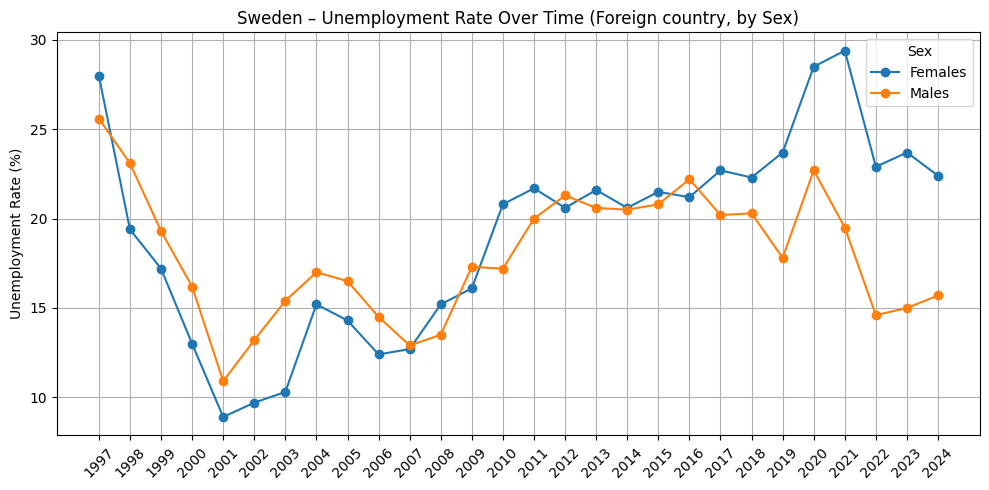

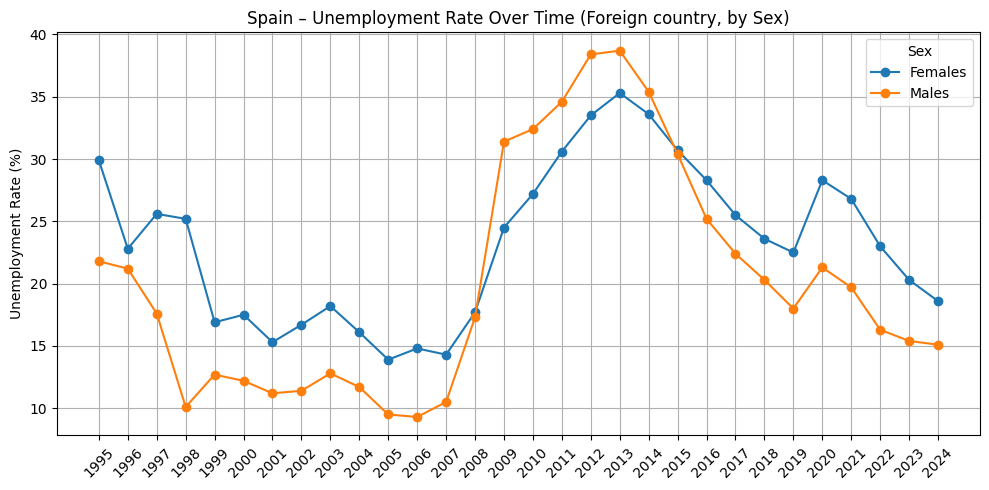

In [ ]:
df = uemp_an[
    (uemp_an ['geo'].isin(selected_countries)) &
    (uemp_an ['Sex'].isin(['Females', 'Males'])) &
    (uemp_an ['citizenship'] == 'Foreign country')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Foreign country, by Sex)")
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)
    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

# Employment by sex and economic activity 

In [ ]:
eco_act = pd.read_csv('../processed_data/employmnet_economic_activity.csv')

In [ ]:
eco_act.head()

,geo,In thousand persons,year,Sex,Sector,workers_per_15_64,workers_per_working_pop
0,Austria,85.30,2008,Females,"Agriculture, forestry and fishing",1.521380,4.721315
1,Austria,122.55,2008,Females,Mining and quarrying,2.185757,6.783085
2,Austria,159.80,2008,Females,Manufacturing,2.850134,8.844855
3,Austria,4.30,2008,Females,"Electricity, gas, steam and air conditioning s...",0.076693,0.238003
4,Austria,4.10,2008,Females,"Water supply; sewerage, waste management and r...",0.073126,0.226933


In [ ]:
def shorten_sector_name(row):
    replacements = {
        "Accommodation and food service activities": "Accommodation & Food",
        "Wholesale and retail trade; repair of motor vehicles and motorcycles": "Wholesale & Retail & Repair of Vehicles",
        "Administrative and support service activities": "Admin & Support",
        "Public administration and defence; compulsory social security": "Public Admin",
        "Professional, scientific and technical activities": "Professional & Science & Tech",
        "Electricity, gas, steam and air conditioning supply": "Utilities",
        "Information and communication": "Info & Comms",
        "Financial and insurance activities": "Finance & Insurance",
        "Arts, entertainment and recreation": "Arts & Entairtainment & Recreation",
        "Water supply; sewerage, waste management and remediation activities": "Water & Waste",
        "Transportation and storage": "Transport & Storage",
        "Mining and quarrying": "Mining",
        "Other service activities": "Other Services",
        "Human health and social work activities": "Health & Social Work",
        "Activities of households as employers; undifferentiated goods- and services-producing activities of households for own use": "Household goods & services",
        "Activities of extraterritorial organisations and bodies": "Extraterritorial organizations"
    }
    return replacements.get(row['Sector'], row['Sector'])

eco_act["Sector"] = eco_act.apply(shorten_sector_name, axis=1)

### Analiza dla Sex = Total

In [ ]:
totals = eco_act[eco_act['Sex'] == 'Total']

In [ ]:
totals.head()

,geo,In thousand persons,year,Sex,Sector,workers_per_15_64,workers_per_working_pop
704,Austria,180.9,2008,Total,"Agriculture, forestry and fishing",3.226466,4.604577
705,Austria,10.3,2008,Total,Mining,0.183707,0.262173
706,Austria,624.7,2008,Total,Manufacturing,11.141921,15.900934
707,Austria,22.6,2008,Total,Utilities,0.403085,0.575254
708,Austria,19.3,2008,Total,Water & Waste,0.344228,0.491257


### Analiza In thousand persons

In [ ]:
selected = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Austria", "Netherlands"]
# liberal countries
liberal = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]
conservs = ["Poland", "Bulgaria", "Romania", "Hungary", "Greece"]

df_2024_lib = totals[(totals['year'] == 2024) & (totals['geo'].isin(liberal))]

heatmap_data_lib = df_2024_lib.groupby(['geo', 'Sector'])['In thousand persons'].mean().unstack()

heatmap_data_lib = heatmap_data_lib.sort_index().sort_index(axis=1)

In [ ]:
heatmap_data_lib.head()

Sector,Accommodation & Food,Admin & Support,"Agriculture, forestry and fishing",Arts & Entairtainment & Recreation,Construction,Education,Extraterritorial organizations,Finance & Insurance,Health & Social Work,Household goods & services,...,Manufacturing,Mining,Other Services,Professional & Science & Tech,Public Admin,Real estate activities,Transport & Storage,Utilities,Water & Waste,Wholesale & Retail & Repair of Vehicles
geo,,,,,,,,,,,,,,,,,,,,,
Austria,236.4,164.9,112.1,79.4,341.4,319.6,7.4,143.1,489.9,5.5,...,704.2,8.0,118.0,286.8,309.1,39.6,209.9,29.0,21.3,613.6
France,1223.7,1223.9,642.3,589.1,1881.6,2197.9,19.9,964.3,3834.6,251.5,...,3093.7,28.4,704.3,1938.8,2338.4,366.7,1432.7,249.7,252.2,3593.3
Germany,1475.0,1828.7,416.6,536.6,2564.2,2915.7,NaN,1319.0,5987.2,96.7,...,7736.9,66.8,1232.6,2258.0,3123.4,357.7,1968.5,420.5,272.4,5167.8
Italy,1505.1,985.8,763.2,344.1,1557.3,1610.6,16.5,600.4,1885.3,539.2,...,4268.3,27.8,714.7,1508.6,1179.3,136.2,1159.6,148.5,245.7,3205.6
Netherlands,458.8,438.1,155.3,220.5,436.9,710.4,NaN,278.9,1621.7,10.2,...,756.7,16.7,181.8,823.5,705.6,72.9,432.4,51.3,39.0,1380.1


In [ ]:
fig = px.imshow(
    heatmap_data_lib,
    labels=dict(x="Sector", y="Country", color="Employment Rate (in 1000 persons)"),
    x=heatmap_data_lib.columns,
    y=heatmap_data_lib.index,
    title="Mean Employment Rate by Sector in 2008 - 2024 in selected liberal countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()


In [ ]:
df_2024_con = totals[(totals['year'] == 2024) & (totals['geo'].isin(conservs))]

heatmap_data_con = df_2024_con.groupby(['geo', 'Sector'])['In thousand persons'].mean().unstack()

heatmap_data_con = heatmap_data_con.sort_index().sort_index(axis=1)

fig = px.imshow(
    heatmap_data_con,
    labels=dict(x="Sector", y="Country", color="Employment Rate (in 1000 persons)"),
    x=heatmap_data_con.columns,
    y=heatmap_data_con.index,
    title="Mean Employment Rate by Sector in 2008 - 2024 in selected conservative countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True 
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()


In [ ]:
# selected sectors
selected_sectors = [
    "Accommodation & Food",
    "Agriculture, forestry and fishing",
    "Education",
    "Health & Social Work",
    "Manufacturing",
    "Professional & Science & Tech",
    "Water & Waste",
    "Wholesale & Retail & Repair of Vehicles",
    "Construction",
    "Transport & Storage"
]


for sector in selected_sectors:
    pivot = totals[totals["Sector"] == sector].pivot_table(
        index='year',
        columns='geo',
        values='In thousand persons',
        aggfunc='mean',
        fill_value=0
    )
    sorted_columns = pivot.mean().sort_values(ascending=True).index
    pivot = pivot.loc[:, sorted_columns]
    fig = px.imshow(
        pivot,
        labels=dict(x="Country", t="Year", color="Employment Rate (in 1000 persons)"),
        x=pivot.columns,
        y=pivot.index,
        title=f"Employment Rate in {sector} Sector (2008 - 2024)",
        color_continuous_scale="YlOrRd",
        aspect="auto",
        width=1200,
        height=600,
        text_auto=True
    )
    fig.show()


### Analiza - dane procentowe

In [ ]:
heatmap_data_lib = df_2024_lib.groupby(['geo', 'Sector'])['workers_per_15_64'].mean().unstack()

heatmap_data_lib = heatmap_data_lib.sort_index().sort_index(axis=1)

heatmap_data_lib = heatmap_data_lib.round(2)

fig = px.imshow(
    heatmap_data_lib,
    labels=dict(x="Sector", y="Country", color="Employment Rate"),
    x=heatmap_data_lib.columns,
    y=heatmap_data_lib.index,
    title="Mean Employment Rate (Workers per Population in Age Group 15-64) by Sector in 2008 - 2024 in selected liberal countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True,
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()


In [ ]:
df_2024_con = totals[(totals['year'] == 2024) & (totals['geo'].isin(conservs))]

heatmap_data_con = df_2024_con.groupby(['geo', 'Sector'])['workers_per_15_64'].mean().unstack()

heatmap_data_con = heatmap_data_con.round(2)

heatmap_data_con = heatmap_data_con.sort_index().sort_index(axis=1)

fig = px.imshow(
    heatmap_data_con,
    labels=dict(x="Sector", y="Country", color="Employment Rate "),
    x=heatmap_data_con.columns,
    y=heatmap_data_con.index,
    title="Mean Employment Rate ((Workers per Population in Age Group 15-64)) by Sector in 2008 - 2024 in selected conservative countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True 
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()

In [ ]:
# selected sectors
selected_sectors = [
    "Accommodation & Food",
    "Agriculture, forestry and fishing",
    "Education",
    "Health & Social Work",
    "Manufacturing",
    "Professional & Science & Tech",
    "Water & Waste",
    "Wholesale & Retail & Repair of Vehicles",
    "Construction",
    "Transport & Storage",
    "Finance & Insurance"
]


for sector in selected_sectors:
    pivot = totals[totals["Sector"] == sector].pivot_table(
        index='year',
        columns='geo',
        values='workers_per_15_64',
        aggfunc='mean',
        fill_value=0
    )
    pivot = pivot.round(2)
    sorted_columns = pivot.mean().sort_values(ascending=True).index
    pivot = pivot.loc[:, sorted_columns]
    fig = px.imshow(
        pivot,
        labels=dict(x="Country", t="Year", color="Employment Rate"),
        x=pivot.columns,
        y=pivot.index,
        title=f"Employment Rate (Workers per Population in Age Group 15-64) in {sector} Sector (2008 - 2024)",
        color_continuous_scale="YlOrRd",
        aspect="auto",
        width=1200,
        height=600,
        text_auto=True
    )
    fig.show()



### Analiza dla pracowników w danych sektorach wśród pracujących

In [ ]:
heatmap_data_lib = df_2024_lib.groupby(['geo', 'Sector'])['workers_per_working_pop'].mean().unstack()

heatmap_data_lib = heatmap_data_lib.sort_index().sort_index(axis=1)

heatmap_data_lib = heatmap_data_lib.round(2)

fig = px.imshow(
    heatmap_data_lib,
    labels=dict(x="Sector", y="Country", color="Employment Rate"),
    x=heatmap_data_lib.columns,
    y=heatmap_data_lib.index,
    title="Mean Employment Rate (Workers per Working people) by Sector in 2008 - 2024 in selected liberal countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True,
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()

In [ ]:
df_2024_con = totals[(totals['year'] == 2024) & (totals['geo'].isin(conservs))]

heatmap_data_con = df_2024_con.groupby(['geo', 'Sector'])['workers_per_working_pop'].mean().unstack()

heatmap_data_con = heatmap_data_con.round(2)

heatmap_data_con = heatmap_data_con.sort_index().sort_index(axis=1)

fig = px.imshow(
    heatmap_data_con,
    labels=dict(x="Sector", y="Country", color="Employment Rate "),
    x=heatmap_data_con.columns,
    y=heatmap_data_con.index,
    title="Mean Employment Rate (Workers per Working Population) by Sector in 2008 - 2024 in selected conservative countries",
    color_continuous_scale="YlOrRd",
    aspect="auto",
    width=1200,
    height=600,
    text_auto=True 
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()

In [ ]:
# selected sectors
selected_sectors = [
    "Accommodation & Food",
    "Agriculture, forestry and fishing",
    "Education",
    "Health & Social Work",
    "Manufacturing",
    "Professional & Science & Tech",
    "Water & Waste",
    "Wholesale & Retail & Repair of Vehicles",
    "Construction",
    "Transport & Storage",
    "Finance & Insurance"
]


for sector in selected_sectors:
    pivot = totals[totals["Sector"] == sector].pivot_table(
        index='year',
        columns='geo',
        values='workers_per_working_pop',
        aggfunc='mean',
        fill_value=0
    )
    pivot = pivot.round(2)
    sorted_columns = pivot.mean().sort_values(ascending=True).index
    pivot = pivot.loc[:, sorted_columns]
    fig = px.imshow(
        pivot,
        labels=dict(x="Country", t="Year", color="Employment Rate"),
        x=pivot.columns,
        y=pivot.index,
        title=f"Employment Rate (Workers per Working Population) in {sector} Sector (2008 - 2024)",
        color_continuous_scale="YlOrRd",
        aspect="auto",
        width=1200,
        height=600,
        text_auto=True
    )
    fig.show()


### Sprawdzenie korelacji wskaźnika zatrudnienia w poszczególnych sektorach i liczby migrantów

In [ ]:
migr_data = pd.read_csv('../processed_data/immigration_by_citizenship_combined_data.csv')

In [ ]:
merged = pd.merge(migr_data, totals, on=['geo', 'year'], how="left")

In [ ]:
merged.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3,In thousand persons,Sex,Sector,workers_per_15_64,workers_per_working_pop
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,NaN,NaN,NaN,NaN,NaN
1,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888,AUT,NaN,NaN,NaN,NaN,NaN
2,Austria,2001,36068.0,777.0,15142.0,134108.0,170176.0,NaN,NaN,NaN,0.456586,78.805472,AUT,NaN,NaN,NaN,NaN,NaN
3,Austria,2002,34008.0,1103.0,21981.0,137932.0,171940.0,NaN,NaN,NaN,0.641503,80.221007,AUT,NaN,NaN,NaN,NaN,NaN
4,Austria,2003,37727.0,1332.0,18528.0,148679.0,186406.0,2.301231,1.835481,0.016444,0.714569,79.760845,AUT,NaN,NaN,NaN,NaN,NaN


In [ ]:
merged = merged[merged['year'] >= 2008]
merged.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3,In thousand persons,Sex,Sector,workers_per_15_64,workers_per_working_pop
9,Austria,2008,39541.0,604.0,8636.0,90810.0,130351.0,1.568984,1.093044,0.00727,0.463364,69.665749,AUT,180.9,Total,"Agriculture, forestry and fishing",3.226466,4.604577
10,Austria,2008,39541.0,604.0,8636.0,90810.0,130351.0,1.568984,1.093044,0.00727,0.463364,69.665749,AUT,10.3,Total,Mining,0.183707,0.262173
11,Austria,2008,39541.0,604.0,8636.0,90810.0,130351.0,1.568984,1.093044,0.00727,0.463364,69.665749,AUT,624.7,Total,Manufacturing,11.141921,15.900934
12,Austria,2008,39541.0,604.0,8636.0,90810.0,130351.0,1.568984,1.093044,0.00727,0.463364,69.665749,AUT,22.6,Total,Utilities,0.403085,0.575254
13,Austria,2008,39541.0,604.0,8636.0,90810.0,130351.0,1.568984,1.093044,0.00727,0.463364,69.665749,AUT,19.3,Total,Water & Waste,0.344228,0.491257


In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    sector_data = merged[merged['Sector'] == sector]
    
    sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
    
    if len(sector_data) < 2:
        correlations[sector] = None 
        continue
    
    corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
    correlations[sector] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)

print(correlation_df)

                                         Correlation
Finance & Insurance                         0.752348
Professional & Science & Tech               0.546319
Info & Comms                                0.456263
Public Admin                                0.412372
Education                                   0.348615
Arts & Entairtainment & Recreation          0.305066
Mining                                      0.290258
Admin & Support                             0.277763
Health & Social Work                        0.265430
Other Services                              0.224733
Accommodation & Food                        0.178431
Household goods & services                  0.176796
Utilities                                   0.165772
Real estate activities                      0.095728
Extraterritorial organizations              0.090843
Construction                               -0.005817
Transport & Storage                        -0.074255
Water & Waste                              -0.

Największa korelacja jest dla: Finance & Insurance - wydaje się podejrzane

In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    for country in liberal:
        sector_data = merged[(merged['Sector'] == sector) & (merged['geo'] == country)]
        
        sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
        
        if len(sector_data) < 2:
            correlations[(sector, country)] = None
            continue
        
        corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
        correlations[(sector, country)] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df.index = pd.MultiIndex.from_tuples(correlation_df.index, names=['Sector', 'Country'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)
correlation_df.dropna(inplace=True)

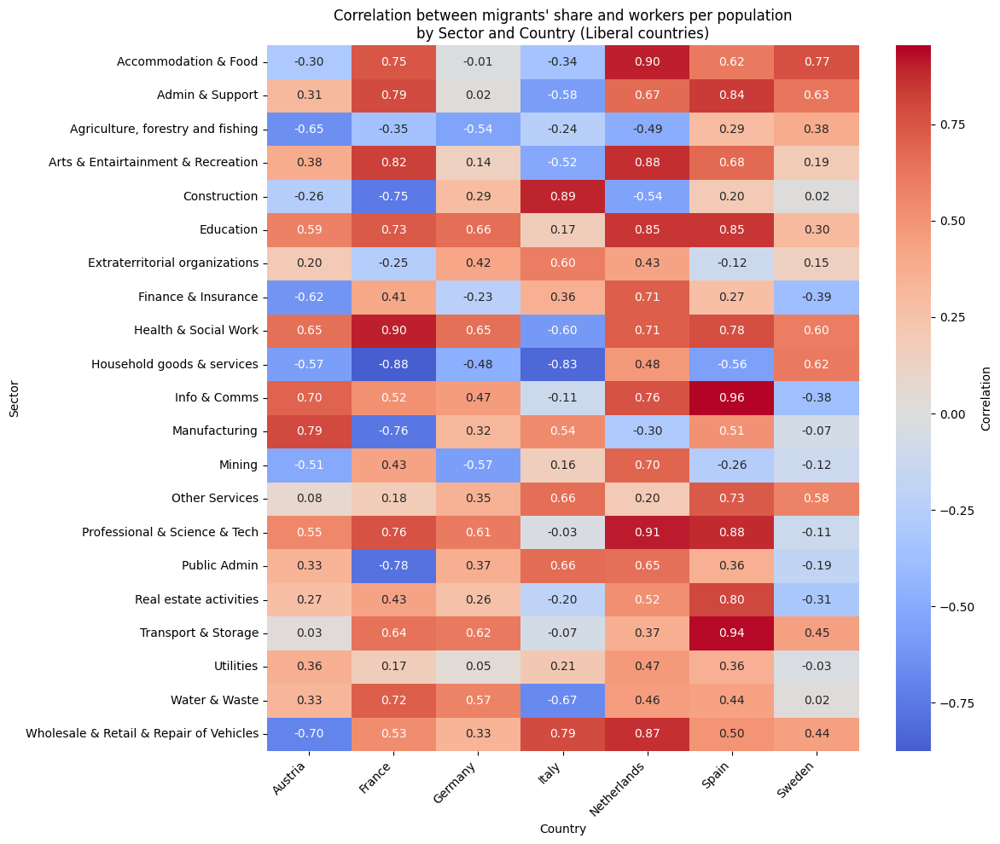

In [ ]:
pivot_df = correlation_df.reset_index().pivot(index='Sector', columns='Country', values='Correlation')

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label': 'Correlation'})
plt.title("Correlation between migrants' share and workers per population\nby Sector and Country (Liberal countries)")
plt.xlabel("Country")
plt.ylabel("Sector")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    for country in conservs:
        sector_data = merged[(merged['Sector'] == sector) & (merged['geo'] == country)]
        
        sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
        
        if len(sector_data) < 2:
            correlations[(sector, country)] = None
            continue
        
        corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
        correlations[(sector, country)] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df.index = pd.MultiIndex.from_tuples(correlation_df.index, names=['Sector', 'Country'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)
correlation_df.dropna(inplace=True)

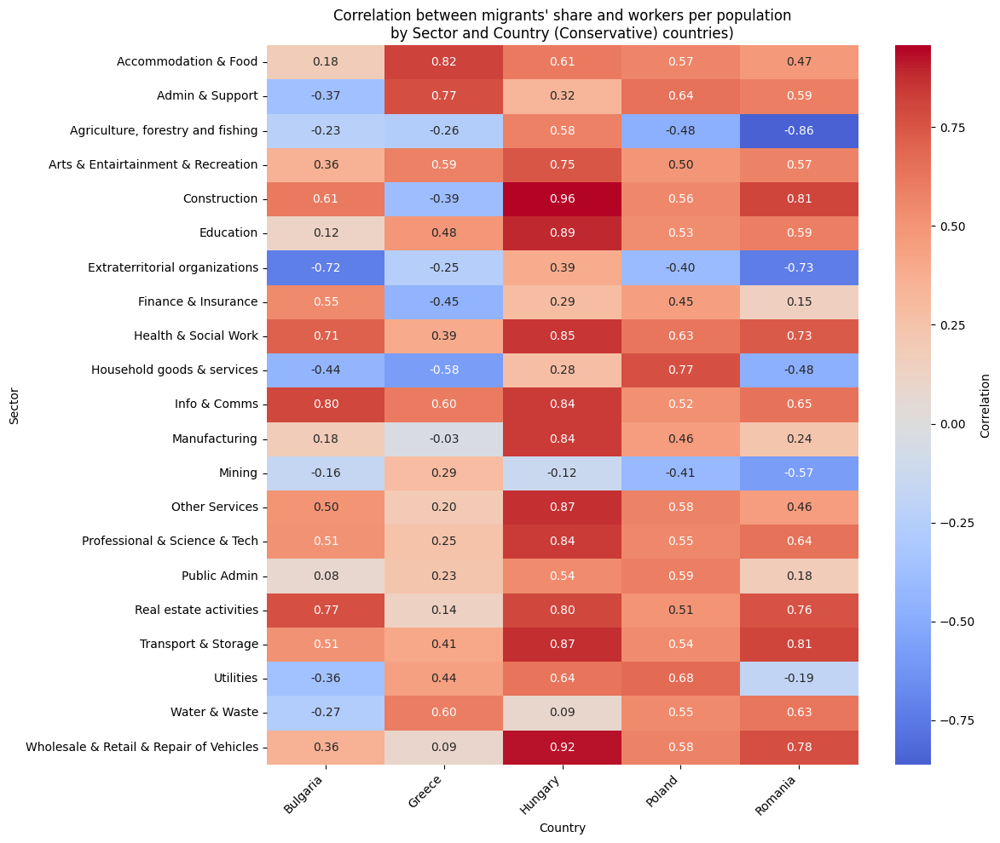

In [ ]:
pivot_df = correlation_df.reset_index().pivot(index='Sector', columns='Country', values='Correlation')

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label': 'Correlation'})
plt.title("Correlation between migrants' share and workers per population\nby Sector and Country (Conservative) countries)")
plt.xlabel("Country")
plt.ylabel("Sector")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### Sprawdzenie korelacji wskaźnika zatrudnienia w poszczególnych sektorach i odsetka cudzoziemców w populacji

In [ ]:
pop_cit = pd.read_csv('../processed_data/population_by_citizenship_combined_data.csv')

In [ ]:
merged = pd.merge(pop_cit, totals, on=['geo', 'year'], how="left")

In [ ]:
merged = merged[merged['year'] >= 2008]
merged.head()

,geo,year,EU,from_Ukraine,national,non_EU,foreigners,iso_a3,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,In thousand persons,Sex,Sector,workers_per_15_64,workers_per_working_pop
0,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,161.4,Total,"Agriculture, forestry and fishing",2.794812,3.967942
1,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,7.1,Total,Mining,0.122944,0.174550
2,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,659.4,Total,Manufacturing,11.418211,16.211034
3,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,30.4,Total,Utilities,0.526408,0.747369
4,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,20.4,Total,Water & Waste,0.353248,0.501524


In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    sector_data = merged[merged['Sector'] == sector]
    
    sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
    
    if len(sector_data) < 2:
        correlations[sector] = None 
        continue
    
    corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
    correlations[sector] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)

print(correlation_df)

                                         Correlation
Finance & Insurance                         0.796324
Professional & Science & Tech               0.567833
Info & Comms                                0.364434
Public Admin                                0.326411
Health & Social Work                        0.310173
Other Services                              0.281308
Real estate activities                      0.264530
Education                                   0.249226
Admin & Support                             0.237587
Household goods & services                  0.237512
Mining                                      0.200462
Arts & Entairtainment & Recreation          0.163731
Extraterritorial organizations              0.137712
Accommodation & Food                        0.080788
Utilities                                  -0.029966
Construction                               -0.046997
Transport & Storage                        -0.188196
Wholesale & Retail & Repair of Vehicles    -0.

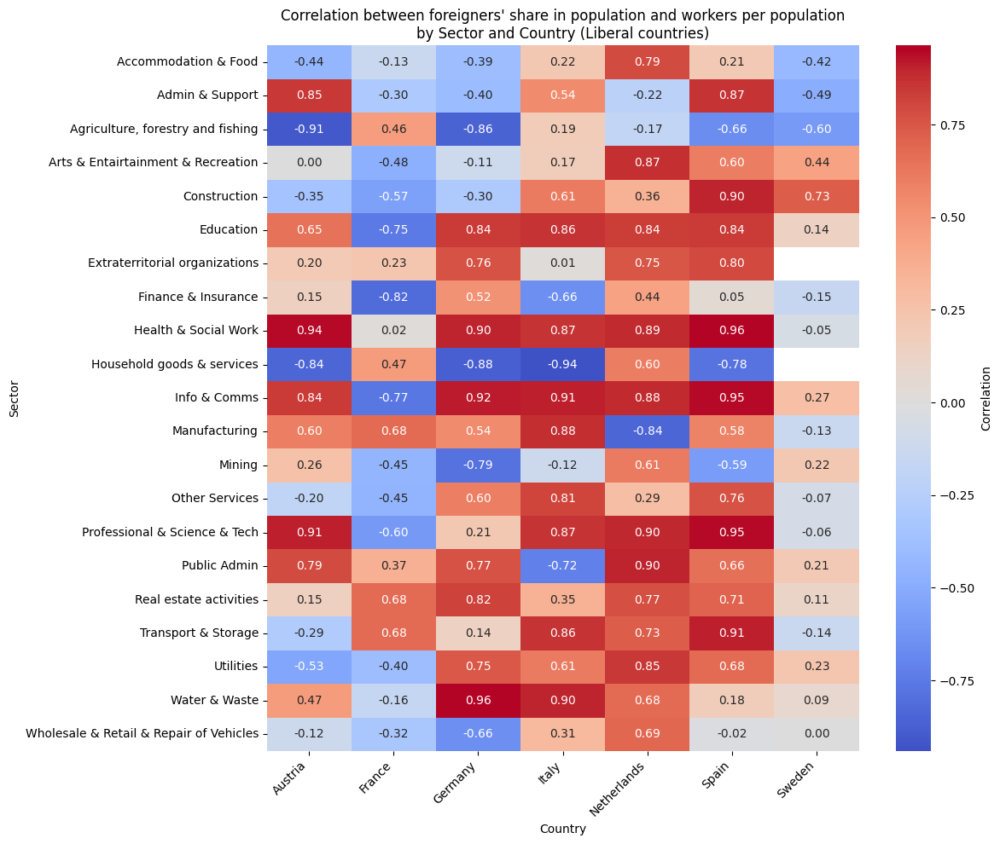

In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    for country in liberal:
        sector_data = merged[(merged['Sector'] == sector) & (merged['geo'] == country)]
        
        sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
        
        if len(sector_data) < 2:
            correlations[(sector, country)] = None
            continue
        
        corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
        correlations[(sector, country)] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df.index = pd.MultiIndex.from_tuples(correlation_df.index, names=['Sector', 'Country'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)
correlation_df.dropna(inplace=True)

pivot_df = correlation_df.reset_index().pivot(index='Sector', columns='Country', values='Correlation')

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label': 'Correlation'})
plt.title("Correlation between foreigners' share in population and workers per population\nby Sector and Country (Liberal countries)")
plt.xlabel("Country")
plt.ylabel("Sector")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


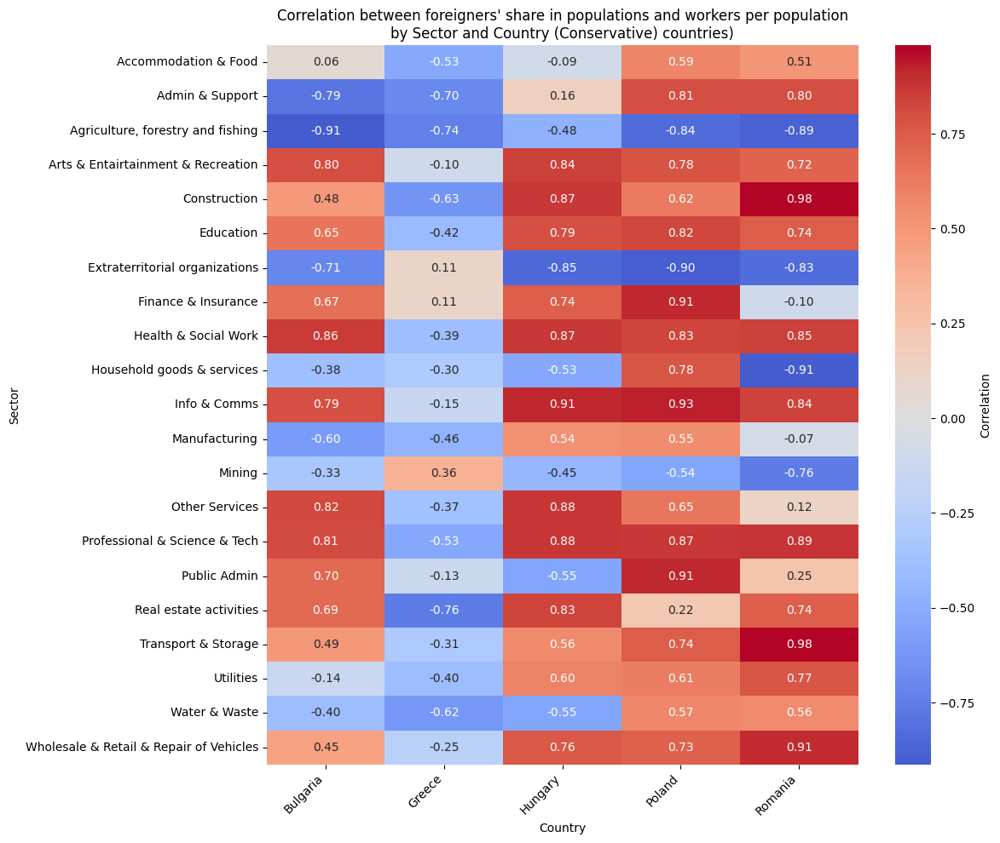

In [ ]:
sectors = merged['Sector'].unique()

correlations = {}

for sector in sectors:
    for country in conservs:
        sector_data = merged[(merged['Sector'] == sector) & (merged['geo'] == country)]
        
        sector_data = sector_data.dropna(subset=['foreigners_pop_share', 'workers_per_15_64'])
        
        if len(sector_data) < 2:
            correlations[(sector, country)] = None
            continue
        
        corr = sector_data['foreigners_pop_share'].corr(sector_data['workers_per_15_64'])
        correlations[(sector, country)] = corr

correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])
correlation_df.index = pd.MultiIndex.from_tuples(correlation_df.index, names=['Sector', 'Country'])
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)
correlation_df.dropna(inplace=True)

pivot_df = correlation_df.reset_index().pivot(index='Sector', columns='Country', values='Correlation')

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label': 'Correlation'})
plt.title("Correlation between foreigners' share in populations and workers per population\nby Sector and Country (Conservative) countries)")
plt.xlabel("Country")
plt.ylabel("Sector")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Właściwa analiza - cz. I - badanie wpływu migracji na rynek pracy

In [ ]:
migr_data = pd.read_csv('../processed_data/immigration_by_citizenship_combined_data.csv')

In [ ]:
migr_data.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT
1,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888,AUT
2,Austria,2001,36068.0,777.0,15142.0,134108.0,170176.0,NaN,NaN,NaN,0.456586,78.805472,AUT
3,Austria,2002,34008.0,1103.0,21981.0,137932.0,171940.0,NaN,NaN,NaN,0.641503,80.221007,AUT
4,Austria,2003,37727.0,1332.0,18528.0,148679.0,186406.0,2.301231,1.835481,0.016444,0.714569,79.760845,AUT


### Połączenie danych migracyjnych i danych o zatrudnieniu (employment rate & unemployment rate)

In [ ]:
emplo_data = pd.read_csv('../processed_data/employmnet_rates_yearly.csv')
unemplo_data = pd.read_csv('../processed_data/unemploymnet_rates_yearly.csv')

In [ ]:
merged = pd.merge(migr_data, emplo_data, on=['geo', 'year'], how='left')

In [ ]:
merged.head(10)

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3,citizenship,employment_rate,Sex
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,57.6,Females
1,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,75.9,Males
2,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,66.9,Total
3,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,59.1,Females
4,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,75.9,Males
5,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,67.5,Total
6,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,59.0,Females
7,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,75.9,Males
8,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,67.4,Total
9,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888,AUT,Foreign country,55.7,Females


In [ ]:
merged2 = pd.merge(merged, unemplo_data, on=['geo', 'year', 'Sex', 'citizenship'], how='left')

In [ ]:
merged2.head(10)

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3,citizenship,employment_rate,Sex,unemployment_rate
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,57.6,Females,8.9
1,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,75.9,Males,10.3
2,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Foreign country,66.9,Total,9.7
3,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,59.1,Females,5.3
4,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,75.9,Males,4.8
5,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Reporting country,67.5,Total,5.0
6,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,59.0,Females,5.6
7,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,75.9,Males,5.4
8,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,Total,67.4,Total,5.5
9,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888,AUT,Foreign country,55.7,Females,9.2


In [ ]:
# analiza dla obydwu płci 
merged2 = merged2[merged['citizenship'] == 'Total']
merged2 = merged2.drop(columns=['citizenship'])
merged2 = merged2[merged2['Sex'] == 'Total']
merged2 = merged2.drop_duplicates(subset=['geo', 'year'])

In [ ]:
merged2.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,iso_a3,employment_rate,Sex,unemployment_rate
8,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,AUT,67.4,Total,5.5
17,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888,AUT,68.2,Total,4.7
26,Austria,2001,36068.0,777.0,15142.0,134108.0,170176.0,NaN,NaN,NaN,0.456586,78.805472,AUT,67.8,Total,4.0
35,Austria,2002,34008.0,1103.0,21981.0,137932.0,171940.0,NaN,NaN,NaN,0.641503,80.221007,AUT,68.1,Total,4.9
44,Austria,2003,37727.0,1332.0,18528.0,148679.0,186406.0,2.301231,1.835481,0.016444,0.714569,79.760845,AUT,68.2,Total,4.8


Dla Bułgarii i Rumuni - kiepskie dane dotyczące wskaźników zatrudnienia. 
Należy pamiętać o tym podczas analizy wyników

In [ ]:
merged2['foreigners_pop_share'].isnull().sum()

np.int64(89)

### Korelacje

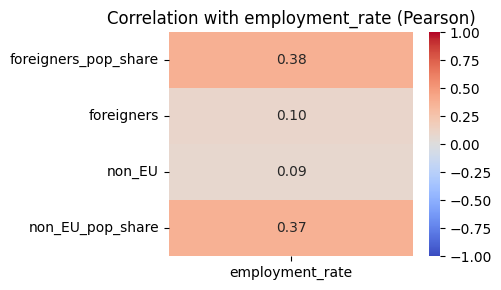

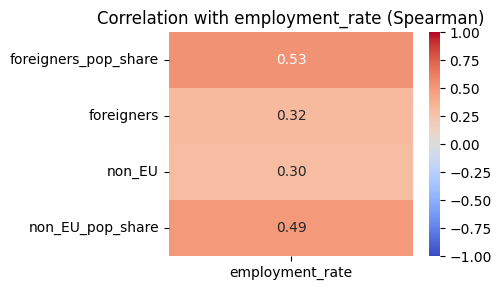

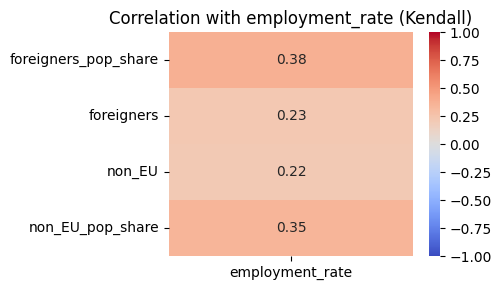

In [ ]:
methods = ['pearson', 'spearman', 'kendall']
cols = ['foreigners_pop_share', 'foreigners', 'non_EU', 'non_EU_pop_share', 'employment_rate']

for method in methods:
    corr = merged2[cols].corr(method=method)
    
    corr_subset = corr[['employment_rate']].drop('employment_rate')

    plt.figure(figsize=(5, 3))
    sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, cbar=True)
    plt.title(f"Correlation with employment_rate ({method.capitalize()})")
    plt.tight_layout()
    plt.show()


Wybrano korelację Spearmana - 0.53 na zbiorze dla wszystkich danych wskazuje już jakiś trend.

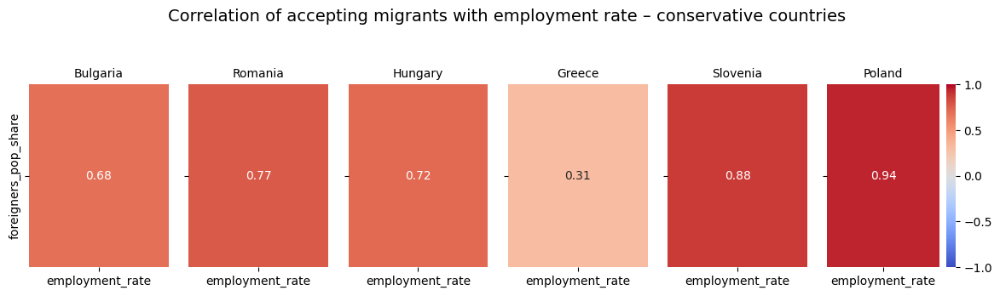

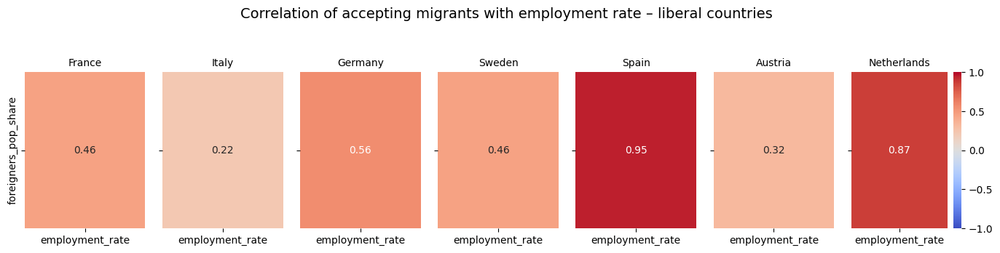

In [ ]:
cols = ['foreigners_pop_share', 'employment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['employment_rate']].drop('employment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation of accepting migrants with employment rate – conservative countries")

plot_country_group(more_migrants, "Correlation of accepting migrants with employment rate – liberal countries")



Silne korelacja widoczne

### Sprawdzenie korelacji z przesunięciami

In [69]:
# shift = 1

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners'].shift(1)
    country_data = country_data.dropna(subset=['foreigners_lag', 'employment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'employment_rate']].corr(method='spearman').iloc[0,1]
        if corr > 0.5:
            print(f"{country}: {corr:.2f}")
  

Belgium: 0.61
Bulgaria: 0.59
Croatia: 0.63
Cyprus: 0.83
Estonia: 0.71
Finland: 0.63
Hungary: 0.64
Ireland: 0.53
Latvia: 0.84
Lithuania: 0.80
Luxembourg: 0.93
Malta: 0.82
Netherlands: 0.86
North Macedonia: 0.95
Poland: 0.94
Portugal: 0.93
Romania: 0.82
Slovenia: 0.84
Spain: 0.91
Sweden: 0.69


In [70]:
# shift = 2

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners'].shift(2)
    country_data = country_data.dropna(subset=['foreigners_lag', 'employment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'employment_rate']].corr(method='spearman').iloc[0,1]
        if corr > 0.5:
            print(f"{country}: {corr:.2f}")
  

Belgium: 0.58
Croatia: 0.56
Cyprus: 0.57
Estonia: 0.57
Finland: 0.54
Hungary: 0.58
Latvia: 0.57
Lithuania: 0.71
Luxembourg: 0.94
Malta: 0.78
Netherlands: 0.73
North Macedonia: 0.97
Poland: 0.96
Portugal: 0.82
Romania: 0.85
Slovenia: 0.65
Spain: 0.72
Sweden: 0.61


Shift w tym wypadku wydaje się nie mieć znaczenia

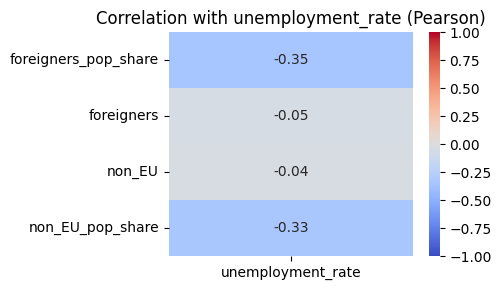

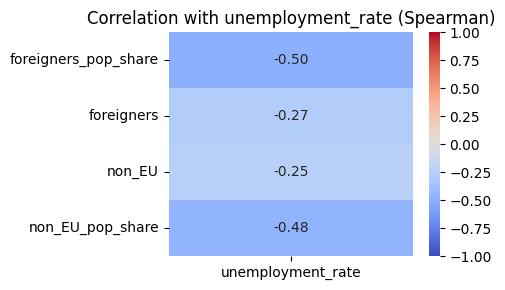

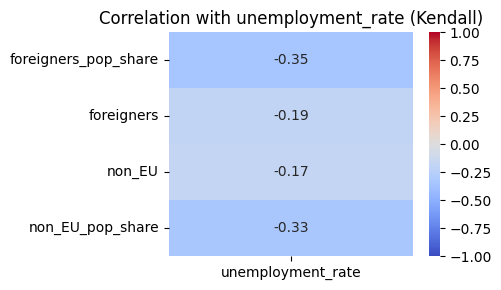

In [71]:
methods = ['pearson', 'spearman', 'kendall']
cols = ['foreigners_pop_share', 'foreigners', 'non_EU', 'non_EU_pop_share', 'unemployment_rate']

for method in methods:
    corr = merged2[cols].corr(method=method)
    
    corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')

    plt.figure(figsize=(5, 3))
    sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, cbar=True)
    plt.title(f"Correlation with unemployment_rate ({method.capitalize()})")
    plt.tight_layout()
    plt.show()

Również wybrano korelację Spearmana -> podobne znaczenie jak w przypadku employment rate, tylko odwrotnie -> tym razem przeważają ujemne korelacje

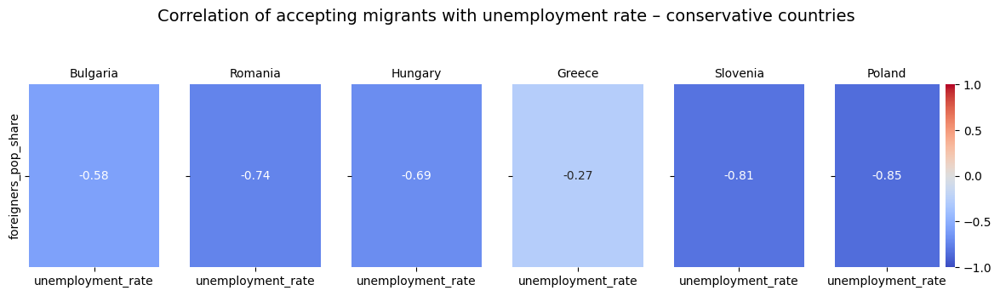

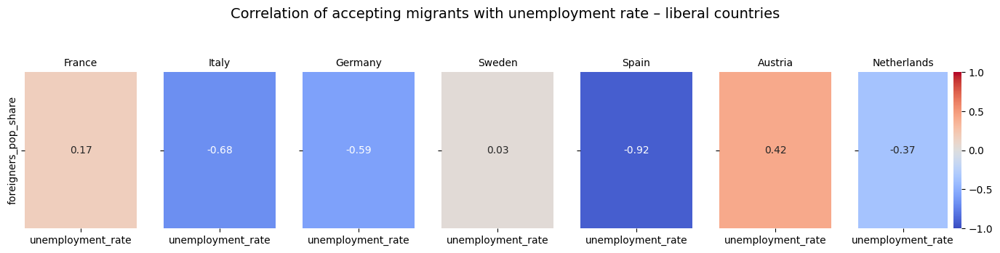

In [72]:
cols = ['foreigners_pop_share', 'unemployment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation of accepting migrants with unemployment rate – conservative countries")

plot_country_group(more_migrants, "Correlation of accepting migrants with unemployment rate – liberal countries")

Silne ujemne korelacje, zwłaszcza widoczne dla krajów konserwatywnych

Sprawdzenie z przesunięciem:

In [73]:
# shift = 1

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners_pop_share'].shift(1)
    country_data = country_data.dropna(subset=['foreigners_lag', 'unemployment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'unemployment_rate']].corr(method='spearman').iloc[0,1]
        if corr < -0.5:
            print(f"{country}: {corr:.2f}")

Bulgaria: -0.63
Croatia: -0.55
Cyprus: -0.85
Germany: -0.50
Hungary: -0.62
Iceland: -0.66
Latvia: -0.83
Malta: -0.74
North Macedonia: -0.96
Poland: -0.84
Portugal: -0.94
Romania: -0.79
Slovenia: -0.70
Spain: -0.89


In [74]:
# shift = 2

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners_pop_share'].shift(2)
    country_data = country_data.dropna(subset=['foreigners_lag', 'unemployment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'unemployment_rate']].corr(method='spearman').iloc[0,1]
        if corr < -0.5:
            print(f"{country}: {corr:.2f}")

Croatia: -0.53
Cyprus: -0.57
Latvia: -0.59
Malta: -0.69
North Macedonia: -0.96
Poland: -0.82
Portugal: -0.86
Romania: -0.85
Spain: -0.69


Shift również wydaje się nie mieć znaczenia w przypadku stopy bezrobocia. Co więcej, działa negatywnie.

### Wizualizacje

In [75]:
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Netherlands", "Austria"]

selected_countries = less_migrants + more_migrants

In [76]:
def plot_time_series_plotly(merged, country, y_label, title ):
    data = merged2[merged2['geo'] == country]
    
    grouped = data.groupby('year').agg({
        'employment_rate': 'mean',
        'foreigners_pop_share': 'mean'
    }).reset_index()
    
    fig = go.Figure()
    

    fig.add_trace(go.Scatter(
        x=grouped['year'], y=grouped['employment_rate'],
        mode='lines+markers',
        name='Employment Rate',
        line=dict(color='red'),
        yaxis='y1'
    ))
    

    fig.add_trace(go.Scatter(
        x=grouped['year'], y=grouped['foreigners_pop_share'],
        mode='lines+markers',
        name=y_label,
        line=dict(color='blue'),
        yaxis='y2'
    ))
    
    fig.update_layout(
        title=f'{title}<br>Country: {country}',
        xaxis_title='Year',
        yaxis=dict(
            title='Employment',
            tickfont=dict(color='red'),
            side='left'
        ),
        yaxis2=dict(
            title=y_label,
            tickfont=dict(color='blue'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=0.1, y=1.1, orientation='h')
    )
    
    fig.show()

In [77]:
for country in selected_countries:
    plot_time_series_plotly(merged2, country, 'Migrants pop share(%)', 'Trend Employment rate & Migrants pop share')

In [78]:
def plot_group_trend_plotly(merged, liberal, conservs, y_label, title):
    merged = merged.copy()
    merged['Group'] = merged['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

    data = merged[merged['Group'] != 'Other']
    
    grouped = data.groupby(['year', 'Group']).agg({
        'employment_rate': 'mean',
        'foreigners_pop_share': 'mean'
    }).reset_index()
    
    fig = go.Figure()
    
    colors = {'Liberal': 'red', 'Conservative': 'green'}
    
    for group in ['Liberal', 'Conservative']:
        group_data = grouped[grouped['Group'] == group]

        fig.add_trace(go.Scatter(
            x=group_data['year'], y=group_data['employment_rate'],
            mode='lines+markers',
            name=f'{group} - Employment Rate',
            line=dict(color=colors[group]),
            yaxis='y1'
        ))

        fig.add_trace(go.Scatter(
            x=group_data['year'], y=group_data['foreigners_pop_share'],
            mode='lines+markers',
            name=f'{group} - {y_label}',
            line=dict(color=colors[group], dash='dot'),
            yaxis='y2'
        ))

    fig.update_layout(
        title=f'{title}',
        xaxis_title='Year',
        yaxis=dict(
            title='Employmnet Rate',
            tickfont=dict(color='red'),
            side='left'
        ),
        yaxis2=dict(
            title=y_label,
            tickfont=dict(color='blue'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=0.05, y=1.12, orientation='h'),
        width=1000,
        height=600
    )
    
    fig.show()


In [79]:
plot_group_trend_plotly(merged2, more_migrants, less_migrants, 'Migrant pop share(%)', 'Trend Employment Rate & Migrants pop share by Political Group')

### Employment rates - analiza

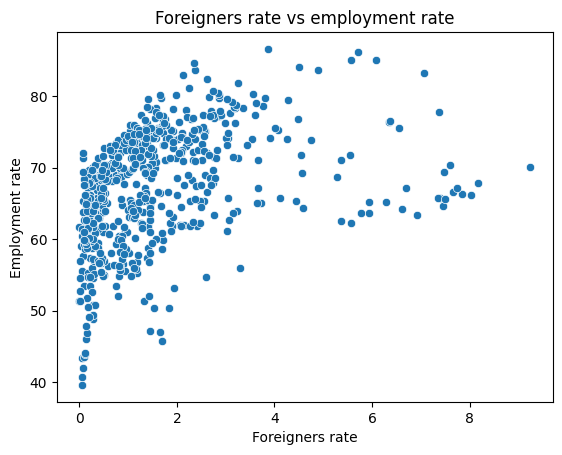

In [80]:
sns.scatterplot(data=merged2, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()

W całościowych danych nie widać jednoznacznego trendu.

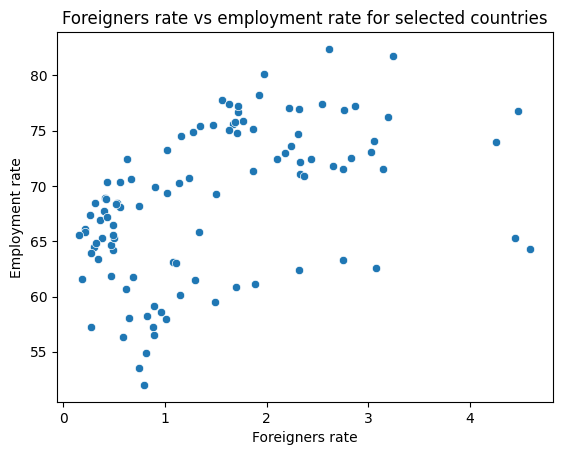

In [81]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(selected_countries)) & (merged2['year'] > 2015)], x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate for selected countries')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()


Sprawdzenie trendu dla liczby migrantów powyżej 0.5

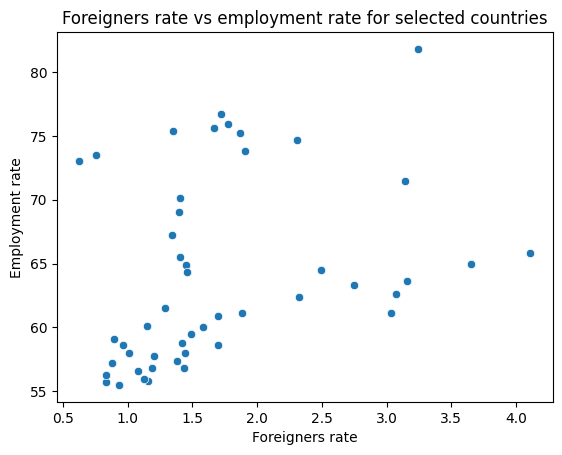

In [82]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(selected_countries))
                                & (merged2['foreigners'] > 0.5 * 1e6)
                                & (merged2['foreigners'] < 2 * 1e6)
                              ], x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate for selected countries')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()

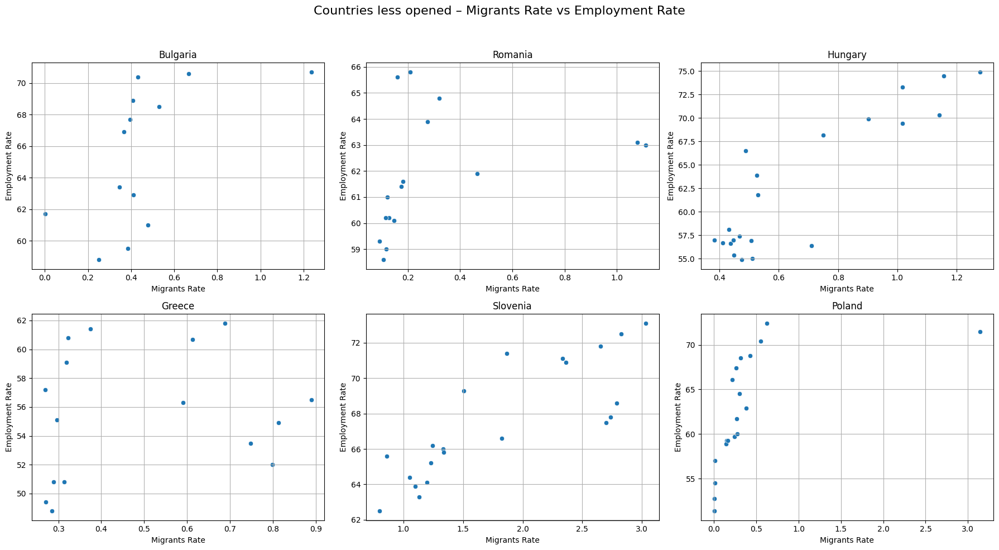

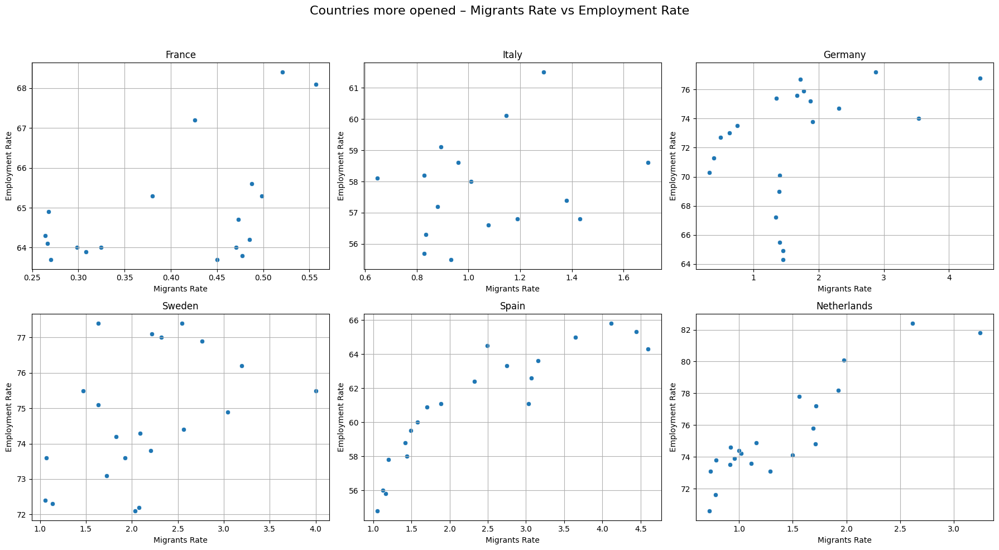

In [83]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Migrants Rate vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Migrants Rate')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Migrants Rate vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Migrants Rate')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Kraje literalne vs konserwatywne w kwestiach migracji

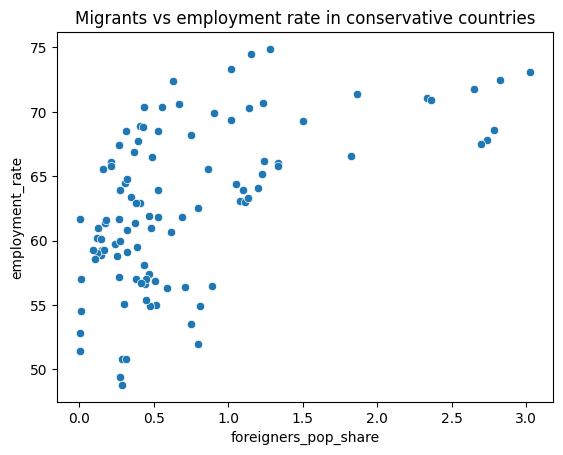

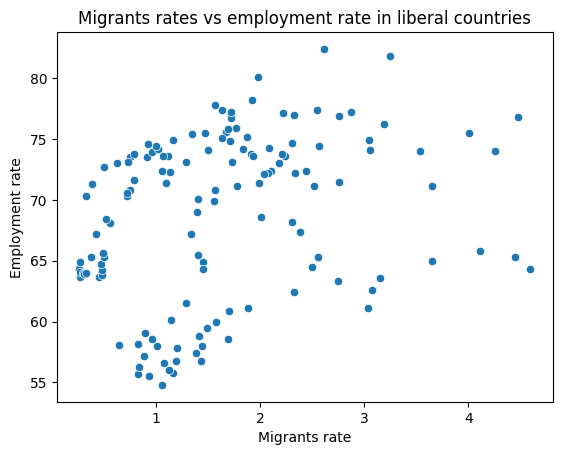

In [84]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(less_migrants))
                              & (merged2['foreigners'] < 1e6)], # delete outliers
                                x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants vs employment rate in conservative countries')
plt.show()

sns.scatterplot(data=merged2[(merged2['geo'].isin(more_migrants)) ], x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants rates vs employment rate in liberal countries')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

Dla całych grup nie widać zbyt wyraźnych trendów

#### Polska - analiza

In [85]:
poland_data = merged2[(merged2['geo'] == "Poland") 
                      & (merged2['foreigners_pop_share'] < 3) # deleted outliers (> 3% - 2022 for example - because of war in Ukraine)
                  ]


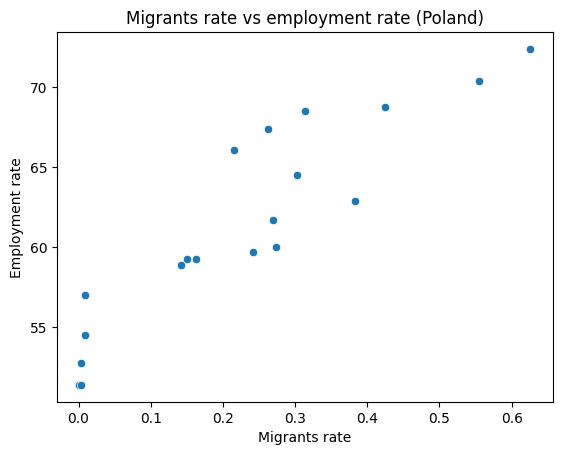

In [86]:
sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants rate vs employment rate (Poland)')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

Dla Polski widać ewidentny trend rosnący

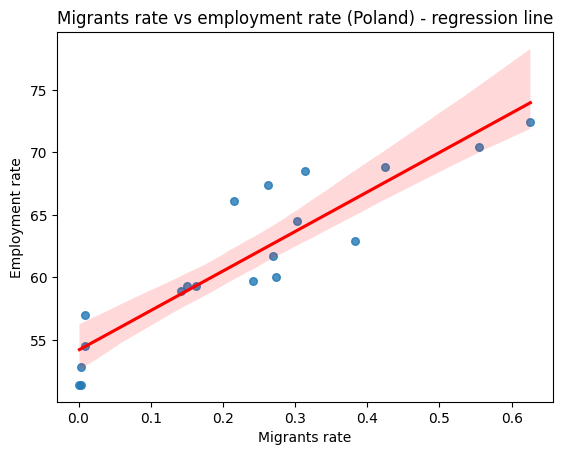

In [87]:
sns.regplot(data=poland_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Migrants rate vs employment rate (Poland) - regression line')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

Widoczny mocny trend rosnący dla Polski

#### Hiszpania

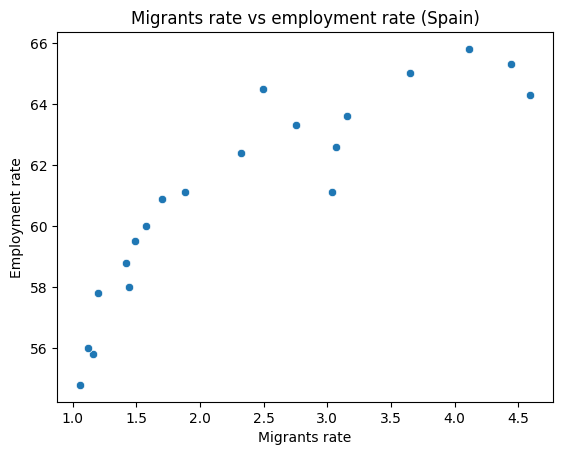

In [88]:
spain_data = merged2[(merged2['geo'] == "Spain")  
                  ] 

sns.scatterplot(data=spain_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants rate vs employment rate (Spain)')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

W przypadku Hiszpani również widać trend rosnący - opórcz outlinerów po prawej stronie

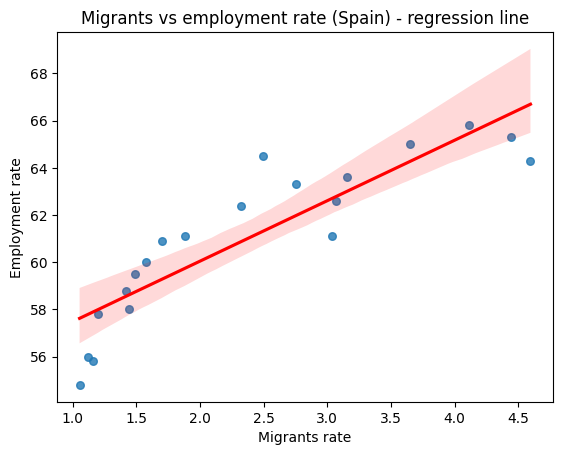

In [89]:
sns.regplot(data=spain_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Migrants vs employment rate (Spain) - regression line')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

#### Węgry

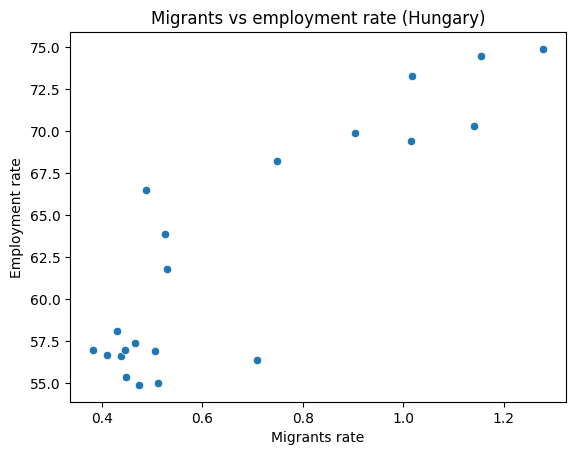

In [90]:
hungary_data = merged2[(merged2['geo'] == "Hungary")  
                  ] 

sns.scatterplot(data=hungary_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants vs employment rate (Hungary)')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

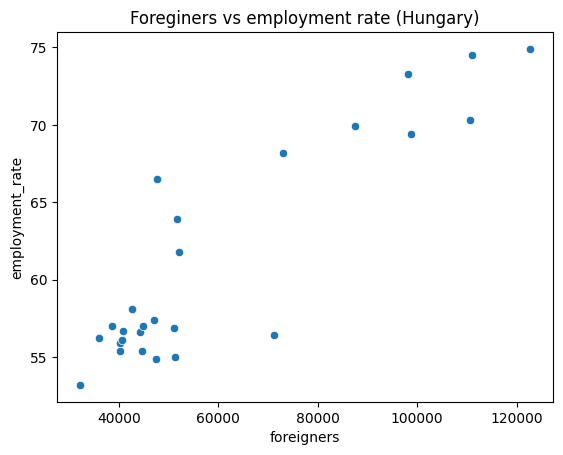

In [91]:
hungary_data = merged2[(merged2['geo'] == "Hungary")
                       & (merged2['foreigners'] < 150_000)] # deleted outliers

sns.scatterplot(data=hungary_data, x='foreigners', y='employment_rate')
plt.title('Foreginers vs employment rate (Hungary)')
plt.show()

#### Słowenia

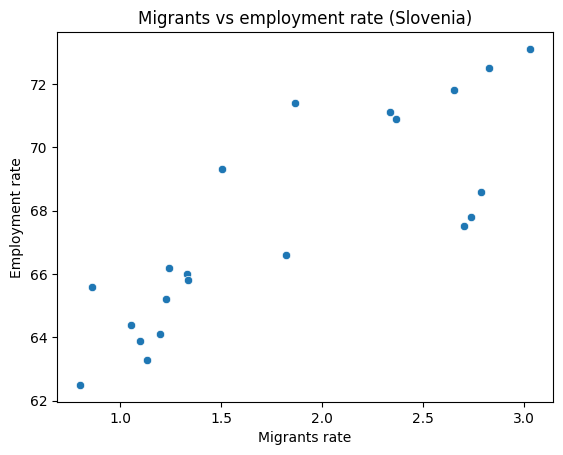

In [92]:
slovenia_data = merged2[(merged2['geo'] == "Slovenia")]

sns.scatterplot(data=slovenia_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Migrants vs employment rate (Slovenia)')
plt.xlabel('Migrants rate')
plt.ylabel('Employment rate')
plt.show()

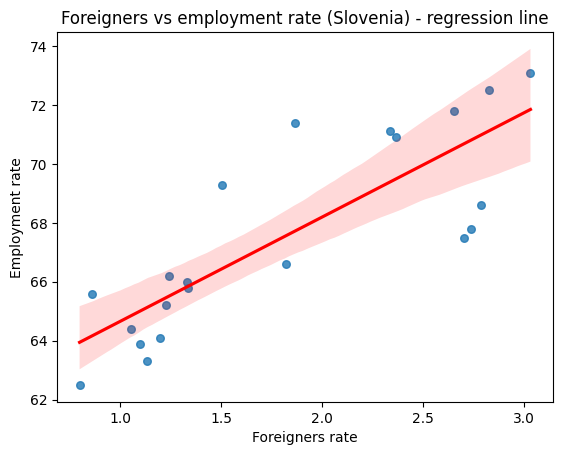

In [93]:
sns.regplot(data=slovenia_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Foreigners vs employment rate (Slovenia) - regression line')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

### Unemployment rate - analiza

In [94]:
def plot_time_series_plotly(merged, country, y_label, title ):
    data = merged2[merged2['geo'] == country]
    
    grouped = data.groupby('year').agg({
        'unemployment_rate': 'mean',
        'foreigners_pop_share': 'mean'
    }).reset_index()
    
    fig = go.Figure()
    

    fig.add_trace(go.Scatter(
        x=grouped['year'], y=grouped['unemployment_rate'],
        mode='lines+markers',
        name='Unemployment Rate',
        line=dict(color='red'),
        yaxis='y1'
    ))
    

    fig.add_trace(go.Scatter(
        x=grouped['year'], y=grouped['foreigners_pop_share'],
        mode='lines+markers',
        name=y_label,
        line=dict(color='blue'),
        yaxis='y2'
    ))
    
    fig.update_layout(
        title=f'{title}<br>Country: {country}',
        xaxis_title='Year',
        yaxis=dict(
            title='Unemployment',
            tickfont=dict(color='red'),
            side='left'
        ),
        yaxis2=dict(
            title=y_label,
            tickfont=dict(color='blue'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=0.1, y=1.1, orientation='h')
    )
    
    fig.show()


for country in selected_countries:
    plot_time_series_plotly(merged2, country, 'Migrants pop share(%)', 'Trend Unemployment rate & Migrants pop share')

def plot_group_trend_plotly(merged, liberal, conservs, y_label, title):
    merged = merged.copy()
    merged['Group'] = merged['geo'].apply(
    lambda x: 'Liberal' if x in liberal else ('Conservative' if x in conservs else 'Other')
)

    data = merged[merged['Group'] != 'Other']
    
    grouped = data.groupby(['year', 'Group']).agg({
        'unemployment_rate': 'mean',
        'foreigners_pop_share': 'mean'
    }).reset_index()
    
    fig = go.Figure()
    
    colors = {'Liberal': 'red', 'Conservative': 'green'}
    
    for group in ['Liberal', 'Conservative']:
        group_data = grouped[grouped['Group'] == group]

        fig.add_trace(go.Scatter(
            x=group_data['year'], y=group_data['unemployment_rate'],
            mode='lines+markers',
            name=f'{group} - Unemployment Rate',
            line=dict(color=colors[group]),
            yaxis='y1'
        ))

        fig.add_trace(go.Scatter(
            x=group_data['year'], y=group_data['foreigners_pop_share'],
            mode='lines+markers',
            name=f'{group} - {y_label}',
            line=dict(color=colors[group], dash='dot'),
            yaxis='y2'
        ))

    fig.update_layout(
        title=f'{title}',
        xaxis_title='Year',
        yaxis=dict(
            title='Unemploymnet Rate',
            tickfont=dict(color='red'),
            side='left'
        ),
        yaxis2=dict(
            title=y_label,
            tickfont=dict(color='blue'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=0.05, y=1.12, orientation='h'),
        width=1000,
        height=600
    )
    
    fig.show()

plot_group_trend_plotly(merged2, more_migrants, less_migrants, 'Migrant pop share(%)', 'Trend Unemployment Rate & Migrants pop share by Political Group')



W wypadku unemployment rate czytelniejsze wydają się scatter ploty.

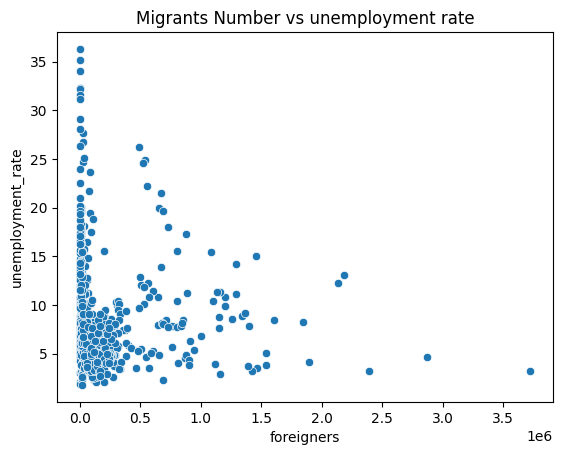

In [95]:
sns.scatterplot(data=merged2, x='foreigners', y='unemployment_rate')
plt.title('Migrants Number vs unemployment rate')
plt.show()

Widać ogólny trend malejący, wraz ze wzrostem liczby migrantów maleje stopa bezrobocia

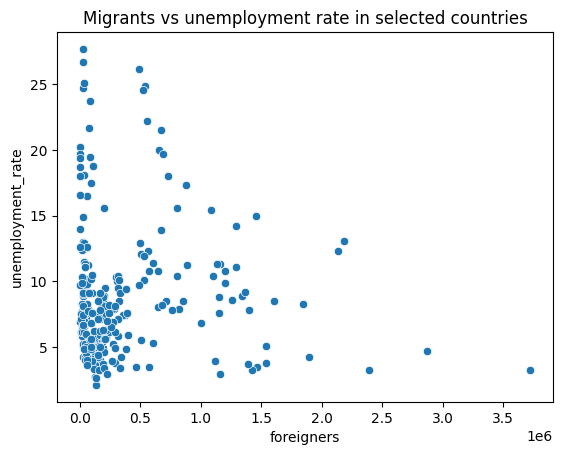

In [96]:
sns.scatterplot(data=merged2[merged2['geo'].isin(selected_countries)], x='foreigners', y='unemployment_rate')
plt.title('Migrants vs unemployment rate in selected countries')
plt.show()


Widać jakiś trend malejący

Dla wybranych krajów podobny trend jak dla wszystkich

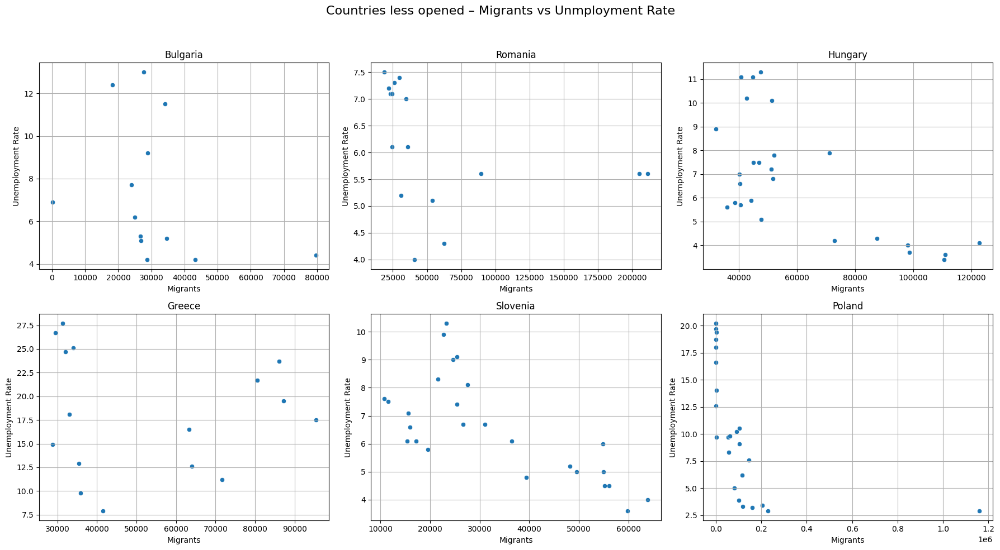

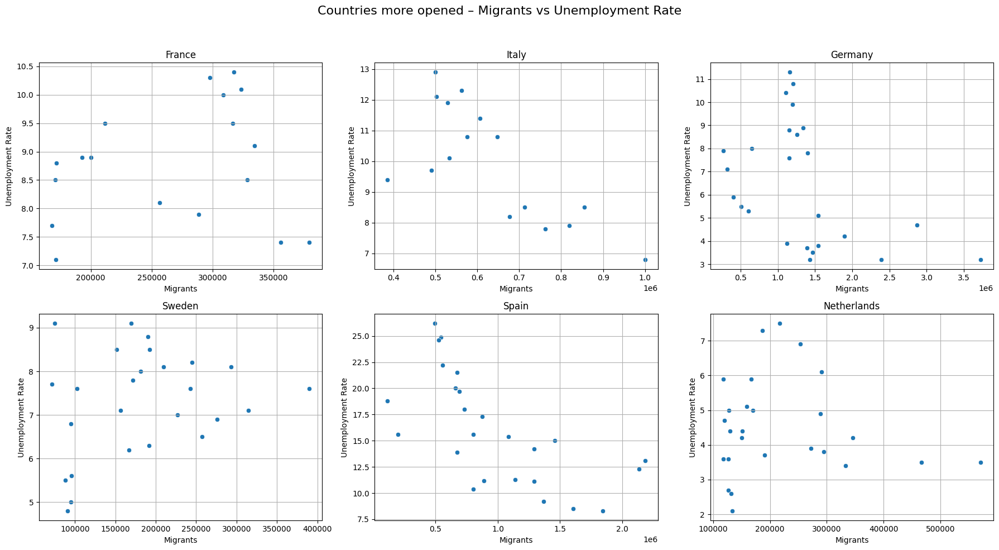

In [97]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Migrants vs Unmployment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Migrants')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Migrants vs Unemployment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Migrants')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

W przypadku: Hiszpani, Polski, Słoweni, Węgier, Włoch widoczny jest trend malejący. 

#### Polska

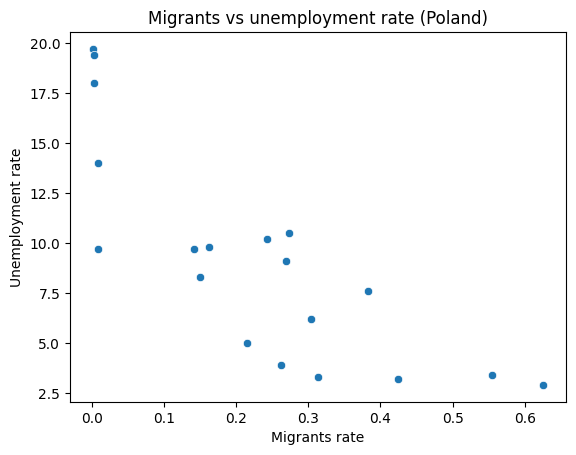

In [98]:
poland_data = merged2[(merged2['geo'] == "Poland") & 
                      (merged2['foreigners_pop_share'] < 3)  # delete outliers
                  ] 

sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='unemployment_rate')
plt.title('Migrants vs unemployment rate (Poland)')
plt.xlabel('Migrants rate')
plt.ylabel('Unemployment rate')
plt.show()

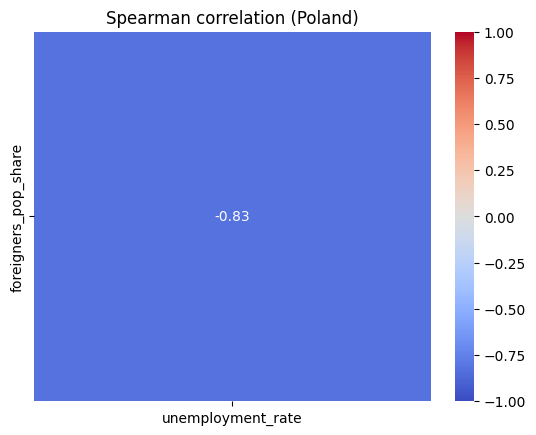

In [99]:
# korelacja po zmianach dla Polski
cols = ['foreigners_pop_share', 'unemployment_rate']
corr = poland_data[cols].corr(method='spearman')
corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')
sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Spearman correlation (Poland)")
plt.show()

### Klasteryzacja

#### Empoloyment rate

In [100]:

filtered = merged2[~merged2['geo'].isin(['Luxembourg', 'Malta', 'Lichtenstein', 'Iceland', 'North Macedonia', 'Montenegro'])]
features = filtered.groupby('geo').agg({
    'employment_rate': ['mean', 'std'],
    'foreigners_pop_share': ['mean', 'std']
}).dropna()

features.columns = ['employment_mean', 'employment_std', 'foreigners_pop_share_mean', 'foreigners_pop_share_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

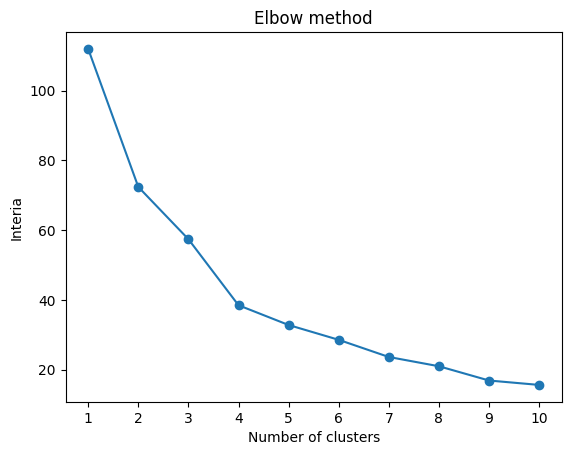

In [101]:
# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

Dobrym pomysłem jest podział na 4 grupy

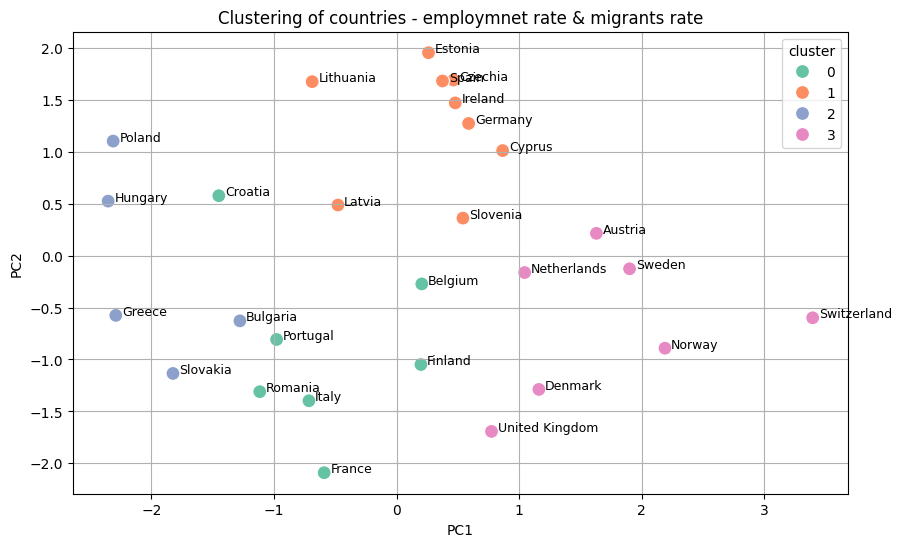

In [102]:
kmeans = KMeans(n_clusters=4, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries - employmnet rate & migrants rate')
plt.grid(True)
plt.show()


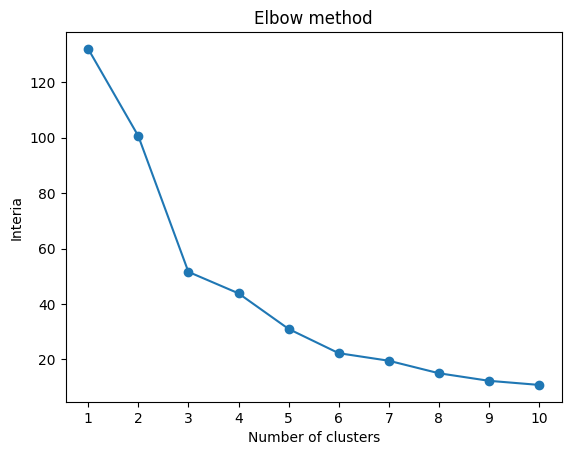

In [103]:
features = merged2.groupby('geo').agg({
    'employment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['employment_mean', 'employment_std', 'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)


# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()


3 klastry

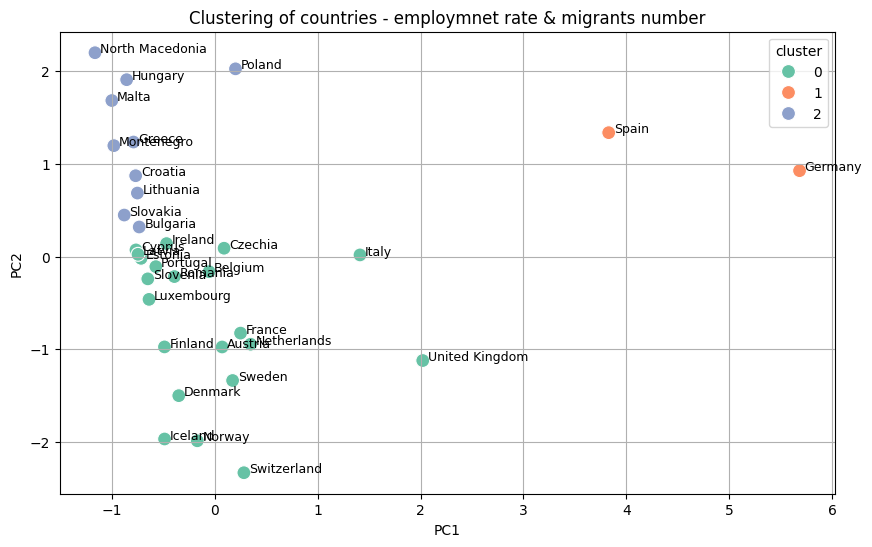

In [104]:
kmeans = KMeans(n_clusters=3, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries - employmnet rate & migrants number')
plt.grid(True)
plt.show()

* W klastrze 0: głównie kraje otwarte na migrantów 
* W klastrze 1: Hiszpania i Niemcy - największe ilości przyjomowanych migrantów
* W klastrze 2: Kraje bardziej konserwatywne, zamknięte na migrantów (oprócz Malty)

Dobry podział

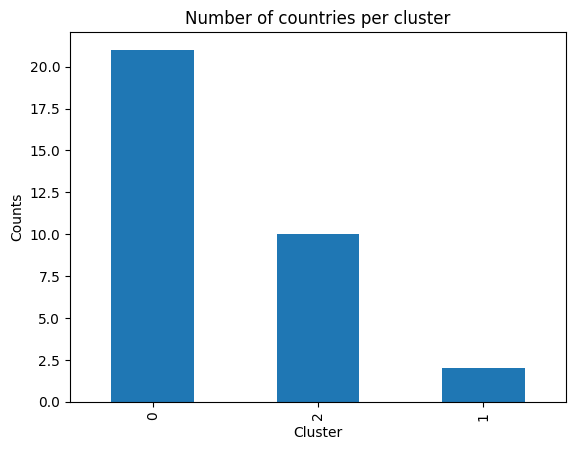

In [105]:
features["cluster"].value_counts().plot(kind="bar")

plt.xlabel("Cluster")
plt.ylabel("Counts")
plt.title("Number of countries per cluster")

plt.show()

#### Unemployment rate

In [106]:
features = merged2.groupby('geo').agg({
    'unemployment_rate': ['mean', 'std'],
    'foreigners_pop_share': ['mean', 'std']
}).dropna()

features.columns = ['unemployment_mean', 'unemployment_std', 'foreigners_pop_share_mean', 'foreigners_pop_share_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

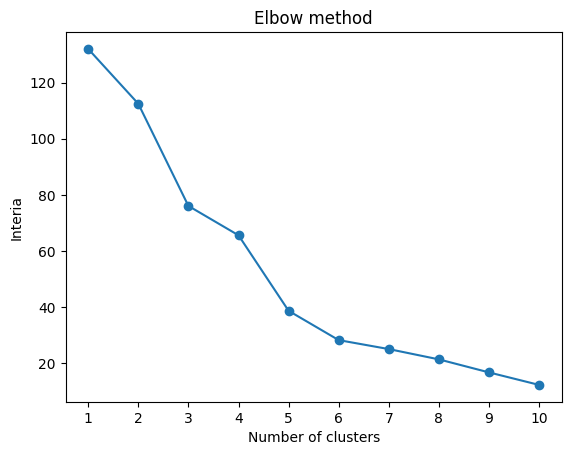

In [107]:
# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

3 lub 4 klastry

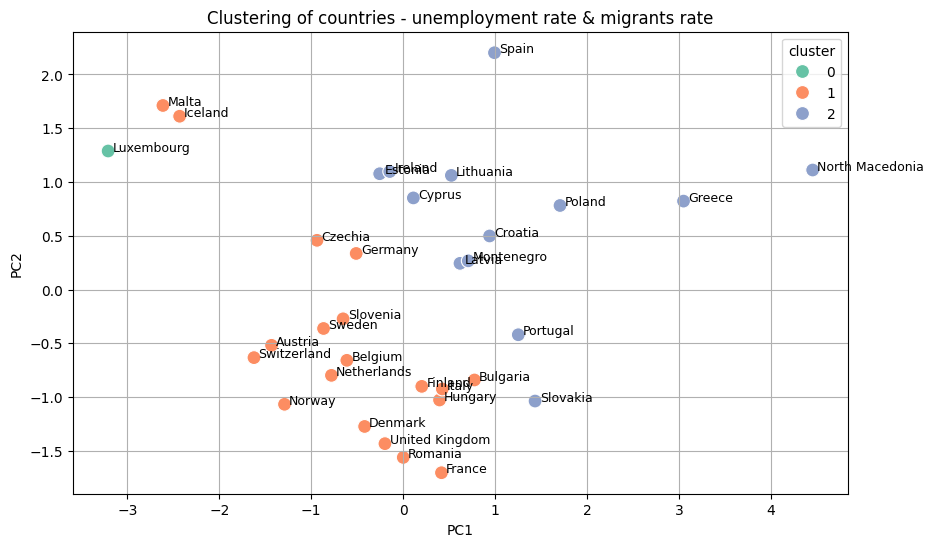

In [108]:
kmeans = KMeans(n_clusters=3, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries - unemployment rate & migrants rate')
plt.grid(True)
plt.show()

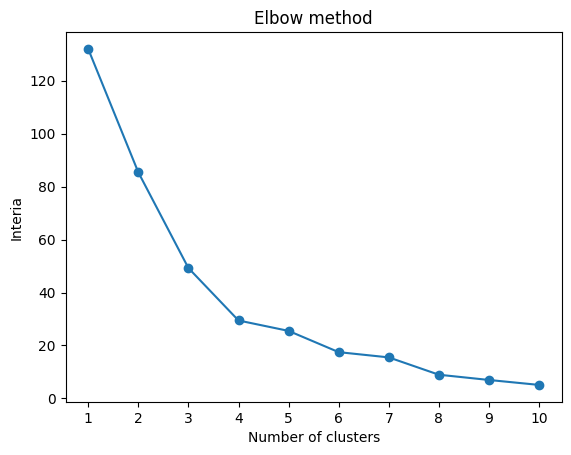

In [109]:
features = merged2.groupby('geo').agg({
    'unemployment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['unemployment_mean', 'unemployment_std', 'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)


# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

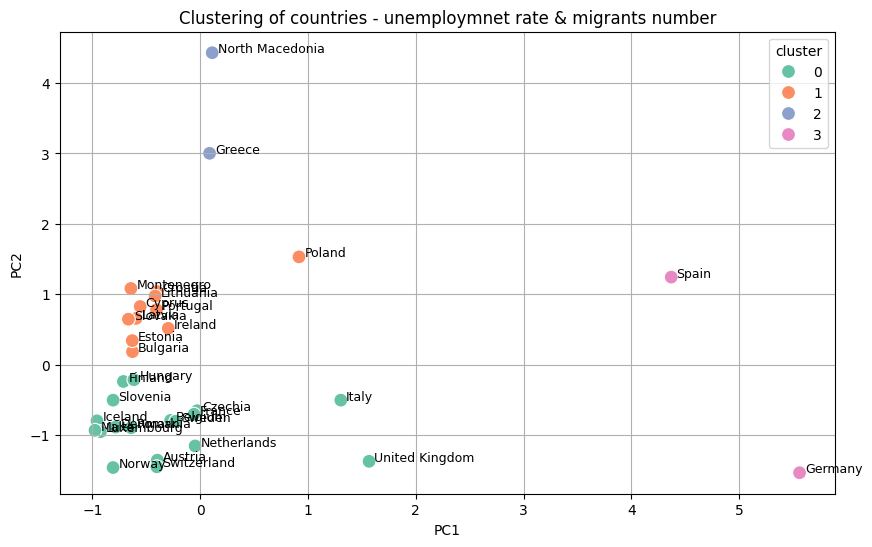

In [110]:
kmeans = KMeans(n_clusters=4, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries - unemploymnet rate & migrants number')
plt.grid(True)
plt.show()

* Fajny podział
* Klaster 0: głównie kraje otwarte na migrantów
* Klaster 1: głównie kraje zamknięte na migrantów, bardziej konserwatywne
* Klaster 2: Północna Macedonia + Grecja - w badanym okresie występowały tu kryzysy gospodarcze
* Klaster 3: Niemcy i Hiszpania - kraje przyjmujące ekstremalną liczbę migrantów (w porównaniu do innych krajów UE)

#### Sprawdzenie klasteryzacji dla wybranych krajów

In [111]:
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]

selected_countries_2 = ["Bulgaria", "Hungary", "Slovenia", "Poland"] + more_migrants
selected = merged2[merged2['geo'].isin(selected_countries_2)]

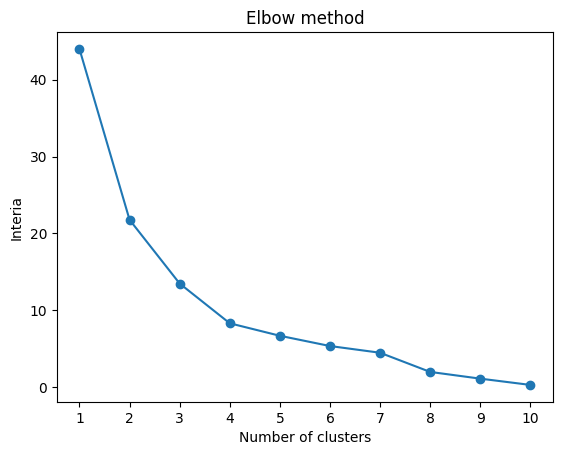

In [112]:
features = selected.groupby('geo').agg({
    'employment_rate': ['mean', 'std'],
    'foreigners_pop_share': ['mean', 'std']
}).dropna()

features.columns = ['employment_mean', 'employment_std', 'foreigners_pop_share_mean', 'foreigners_pop_share_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)


# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

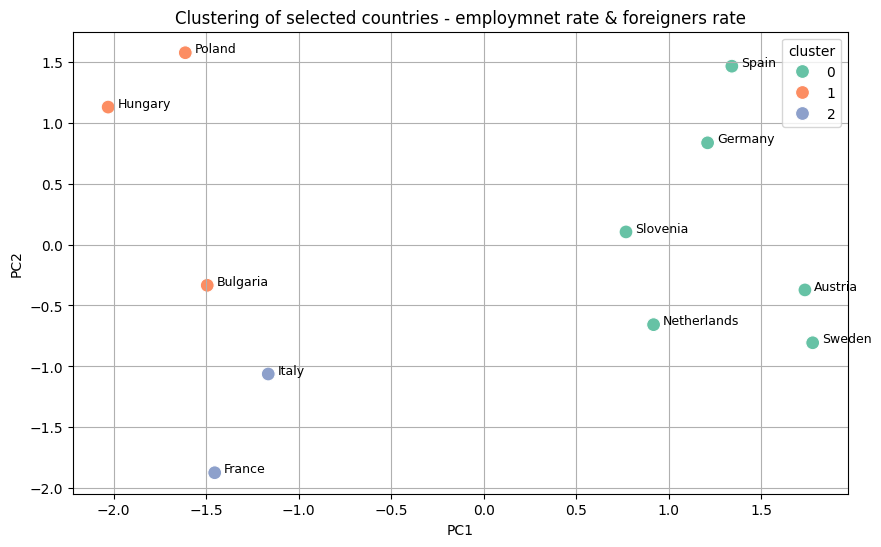

In [113]:
kmeans = KMeans(n_clusters=3, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)



plt.title('Clustering of selected countries - employmnet rate & foreigners rate')
plt.grid(True)
plt.show()

Do dalszej Analizy - czy Słowenia jest krajem niechętnie przyjmującym migrantów?

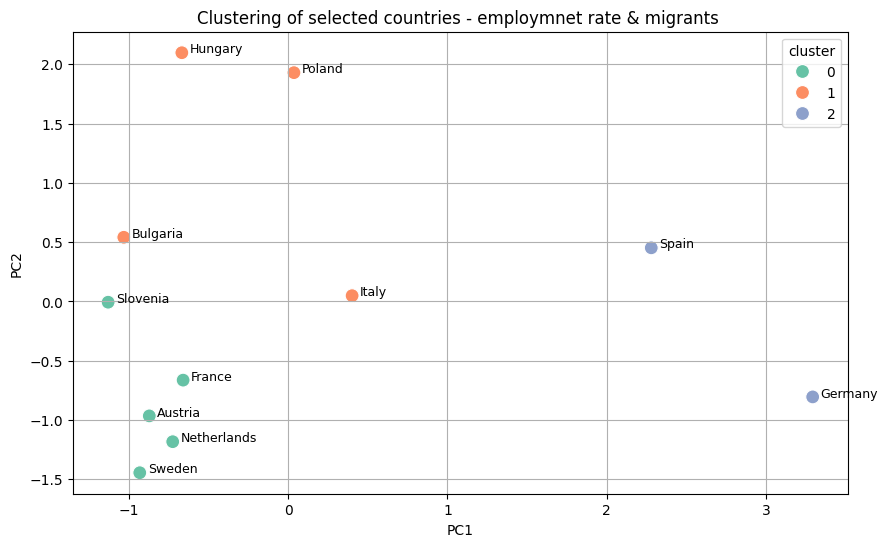

In [114]:
# foreigners number vs employment rate
features = selected.groupby('geo').agg({
    'employment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['employment_mean', 'employment_std', 'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

kmeans = KMeans(n_clusters=3, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=4)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)



plt.title('Clustering of selected countries - employmnet rate & migrants ')
plt.grid(True)
plt.show()

Mocno nietrafiona klasteryzacja

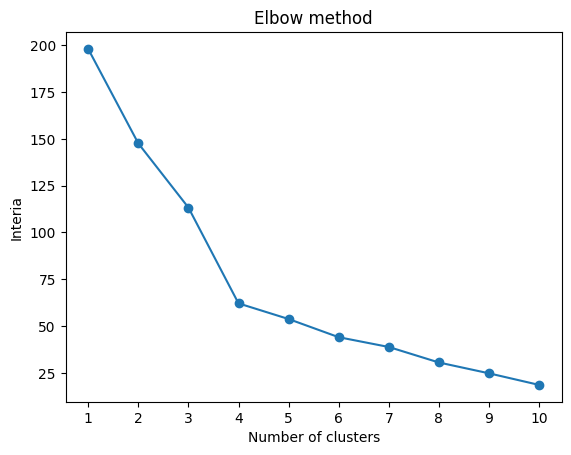

In [116]:
features = merged2.groupby('geo').agg({
    'unemployment_rate': ['mean', 'std'],
    'employment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['unemployment_mean', 'unemployment_std', 'employment_rate_mean', 'unemployment_std',  'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)


# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

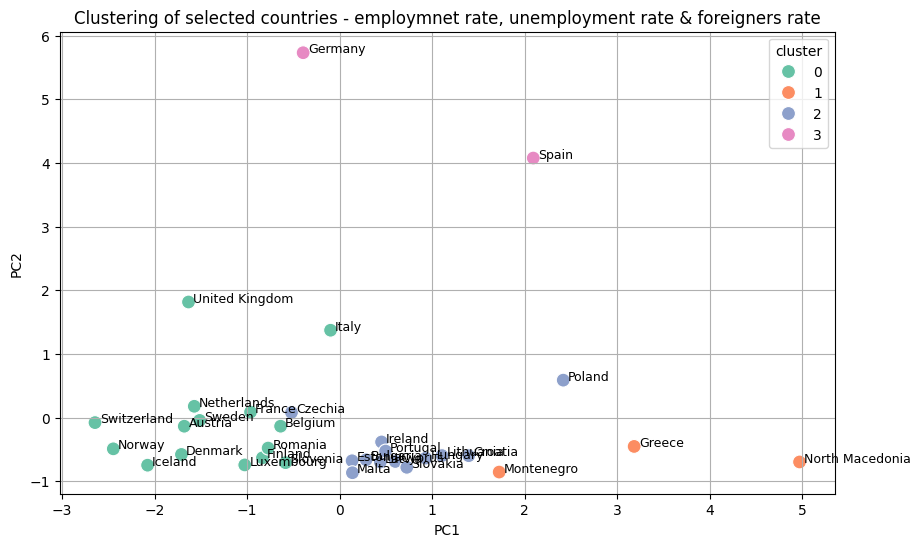

In [119]:
kmeans = KMeans(n_clusters=4, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)



plt.title('Clustering of selected countries - employmnet rate, unemployment rate & foreigners rate')
plt.grid(True)
plt.show()

# Właściwa analiza - cz. II - badanie wpływu odsetka cudzoziemców w kraju na rynek pracy

In [450]:
pop_cit = pd.read_csv('../processed_data/population_by_citizenship_combined_data.csv')
emplo_data = pd.read_csv('../processed_data/employmnet_rates_yearly.csv')
unemplo_data = pd.read_csv('../processed_data/unemploymnet_rates_yearly.csv')

In [451]:
merged = pd.merge(pop_cit, emplo_data, on=['geo', 'year'], how='left')

In [452]:
merged2 = pd.merge(merged, unemplo_data, on=['geo', 'year', 'Sex', 'citizenship'], how='left')

In [453]:
merged2.head()

,geo,year,EU,from_Ukraine,national,non_EU,foreigners,iso_a3,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,citizenship,employment_rate,Sex,unemployment_rate
0,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,Foreign country,57.0,Females,10.4
1,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,Foreign country,70.3,Males,11.8
2,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,Foreign country,63.5,Total,11.2
3,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,Reporting country,69.0,Females,4.5
4,Austria,2015,560680.0,8582.0,7438848.0,1715038.0,2275718.0,AUT,23.425833,17.654294,0.088342,0.377112,75.362501,Reporting country,76.0,Males,5.2


In [454]:
# analiza dla obydwu płci 
merged2 = merged2[merged['citizenship'] == 'Total']
merged2 = merged2.drop(columns=['citizenship'])
merged2 = merged2[merged2['Sex'] == 'Total']
merged2 = merged2.drop_duplicates(subset=['geo', 'year'])

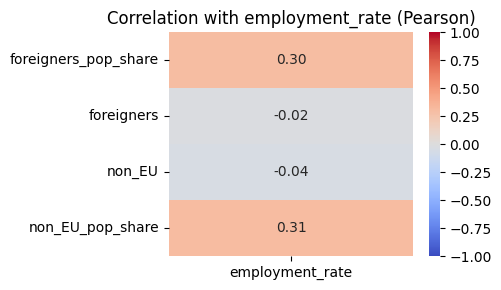

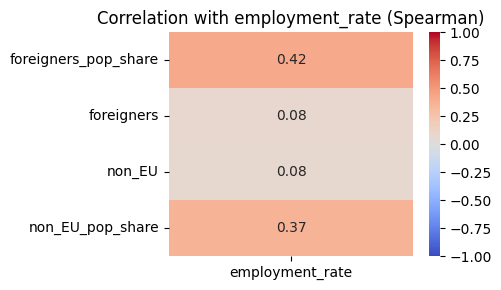

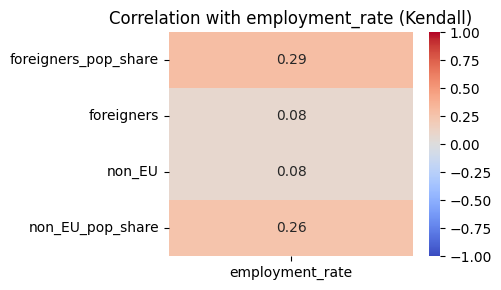

In [455]:
methods = ['pearson', 'spearman', 'kendall']
cols = ['foreigners_pop_share', 'foreigners', 'non_EU', 'non_EU_pop_share', 'employment_rate']

for method in methods:
    corr = merged2[cols].corr(method=method)
    
    corr_subset = corr[['employment_rate']].drop('employment_rate')

    plt.figure(figsize=(5, 3))
    sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, cbar=True)
    plt.title(f"Correlation with employment_rate ({method.capitalize()})")
    plt.tight_layout()
    plt.show()

Wybrana metryka korelacji: Spearmana

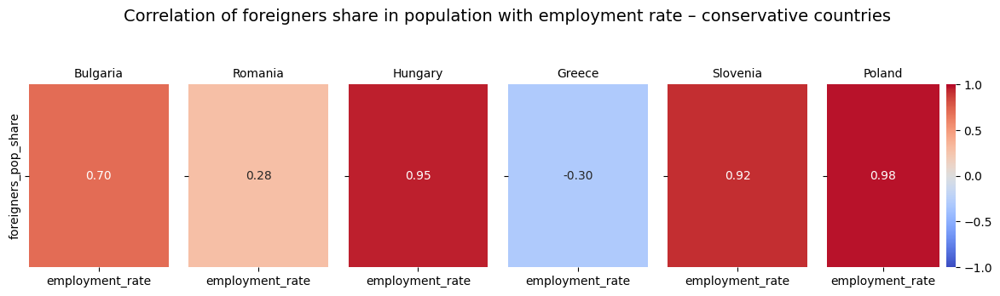

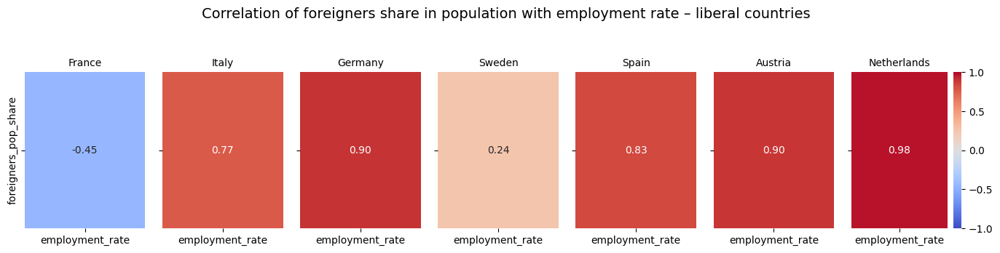

In [456]:
cols = ['foreigners_pop_share', 'employment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['employment_rate']].drop('employment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation of foreigners share in population with employment rate – conservative countries")

plot_country_group(more_migrants, "Correlation of foreigners share in population with employment rate – liberal countries")

 * Nietypowym przypadkiem wydaje się Frnacja, gdzie employment_rate jest UJEMNIE skorelowany z odsetkiem cudzoziemców w populacji.
* Wynik dla Grecji jest raczej nie adekwatny z uwagi na kryzys gospodarczy w okolicach 2010 roku
* Dla Rumunii i Bługarii sporo danych brakowało (też wyniki mogą być nieadekwatne)
* Dla pozostałych natomiast osiągane są bardzo wysokie wyniki korelacji.

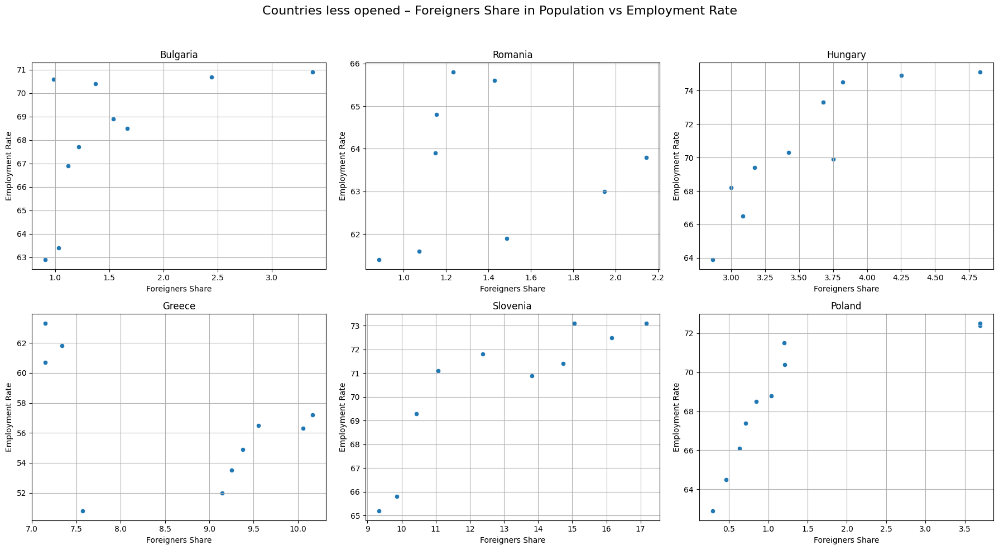

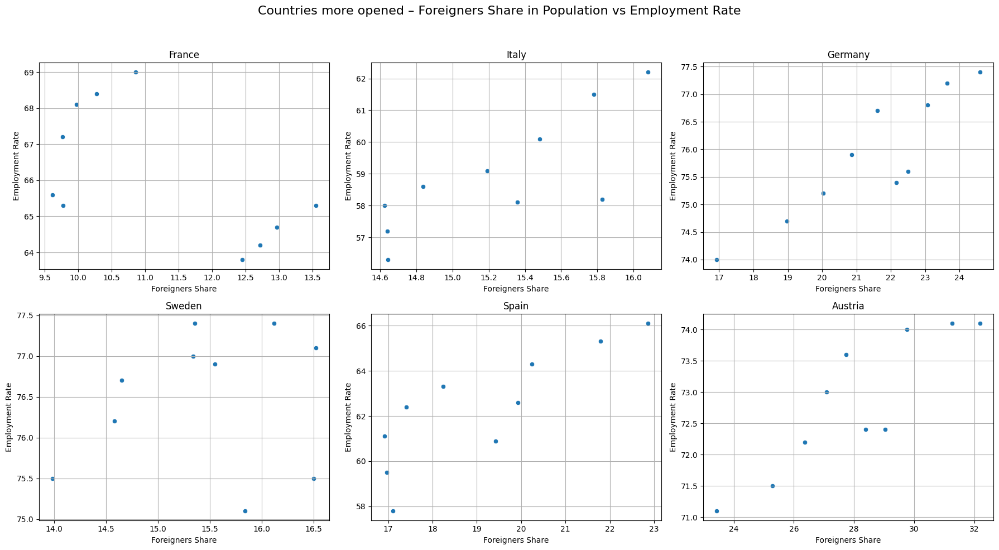

In [457]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Foreigners Share in Population vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Share')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Foreigners Share in Population vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Share')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Widoczne tendencje wzrostowe

### Węgry, Słowenia, Polska

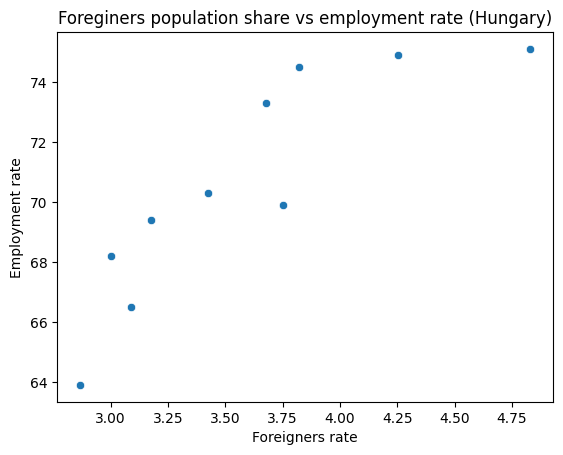

In [354]:
hungary_data = merged2[(merged2['geo'] == "Hungary")
                  ] 

sns.scatterplot(data=hungary_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers population share vs employment rate (Hungary)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

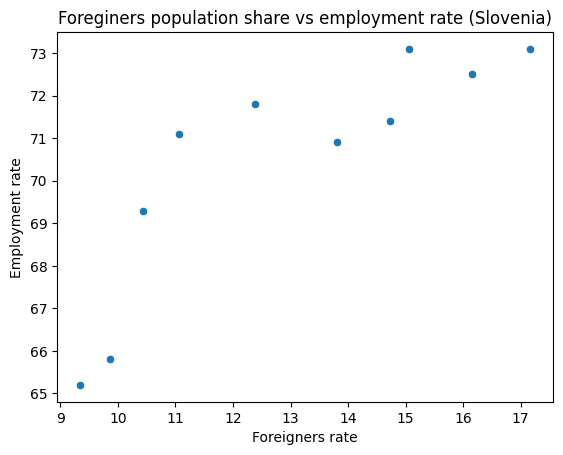

In [361]:
slovenia_data = merged2[(merged2['geo'] == "Slovenia")
                  ] 

sns.scatterplot(data=slovenia_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers population share vs employment rate (Slovenia)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

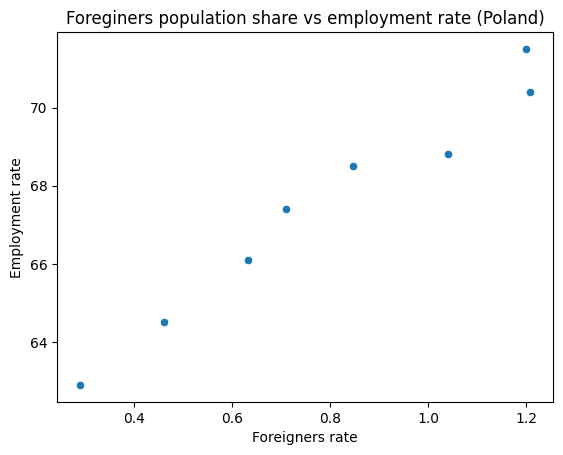

In [362]:
poland_data = merged2[(merged2['geo'] == "Poland") &
                      (merged2['foreigners_pop_share'] < 3) # delete outliers
                  ] 

sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers population share vs employment rate (Poland)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

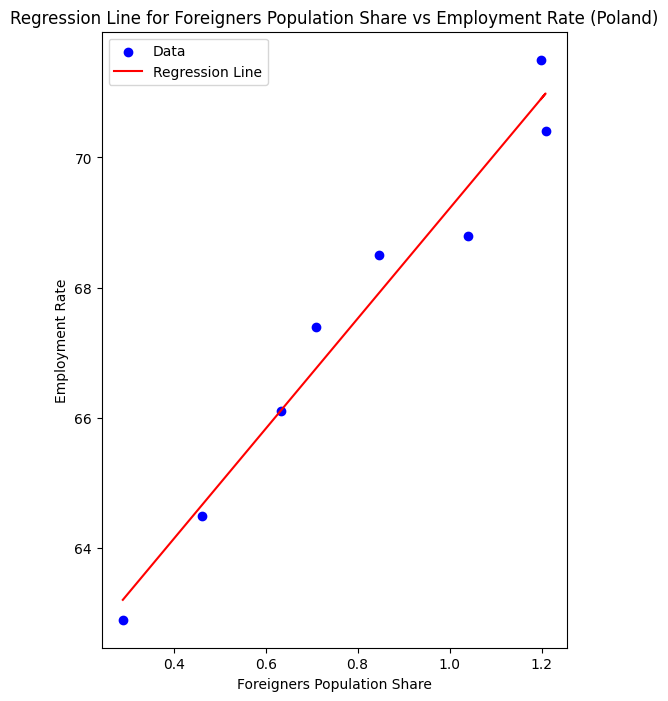

In [363]:
# Regresja liniowa
model = LinearRegression()
X = poland_data[['foreigners_pop_share']]
y = poland_data['employment_rate']
model.fit(X, y)
y_pred = model.predict(X)
plt.figure(figsize=(6,8))
plt.scatter(poland_data['foreigners_pop_share'], poland_data['employment_rate'], label="Data", color="blue")
plt.plot(poland_data['foreigners_pop_share'], y_pred, color='red', label='Regression Line')
plt.title('Regression Line for Foreigners Population Share vs Employment Rate (Poland)')
plt.xlabel('Foreigners Population Share')
plt.ylabel('Employment Rate')
plt.legend()
plt.show()

In [364]:
r2 = model.score(X, y)
print("R²:", r2)

R²: 0.9640096554113712


Bardzo wysokie R^2

### Studium przypadku - Francja

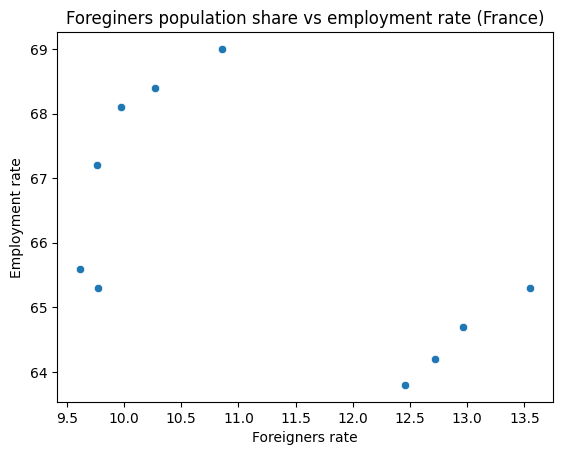

In [448]:
france_data = merged2[(merged2['geo'] == "France")
                  ] 

sns.scatterplot(data=france_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers population share vs employment rate (France)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

Na wykresie kształtują się dwie linie

### Model regresyjny dla wszystkich krajów

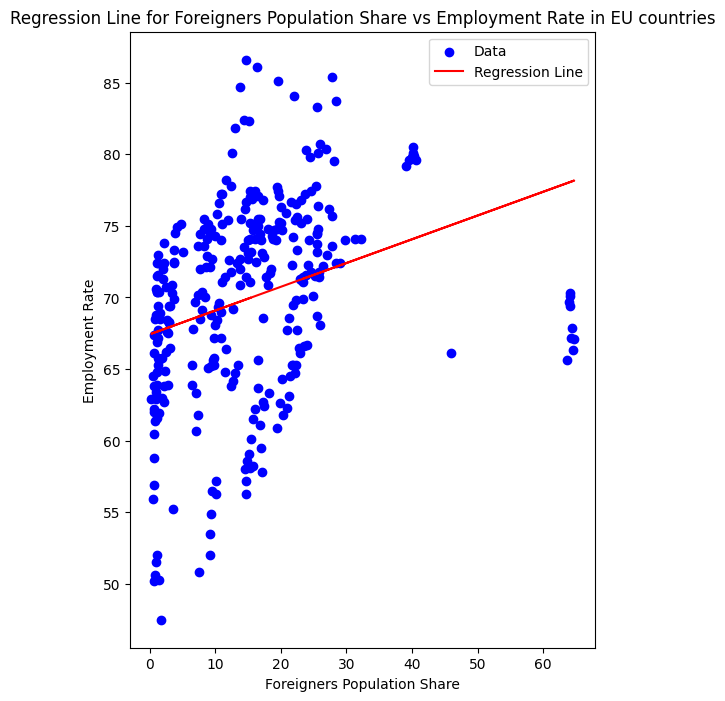

In [ ]:
model_all = LinearRegression()
reg_df = merged2.dropna(subset=['foreigners_pop_share', 'employment_rate'])
X_all = reg_df[['foreigners_pop_share']]
y_all = reg_df['employment_rate']
model_all.fit(X_all, y_all)
y_pred = model_all.predict(X_all)
plt.figure(figsize=(6,8))
plt.scatter(reg_df['foreigners_pop_share'], reg_df['employment_rate'], label="Data", color="blue")
plt.plot(reg_df['foreigners_pop_share'], y_pred, color='red', label='Regression Line')
plt.title('Regression Line for Foreigners Population Share vs Employment Rate in EU countries')
plt.xlabel('Foreigners Population Share')
plt.ylabel('Employment Rate')
plt.legend()
plt.show()

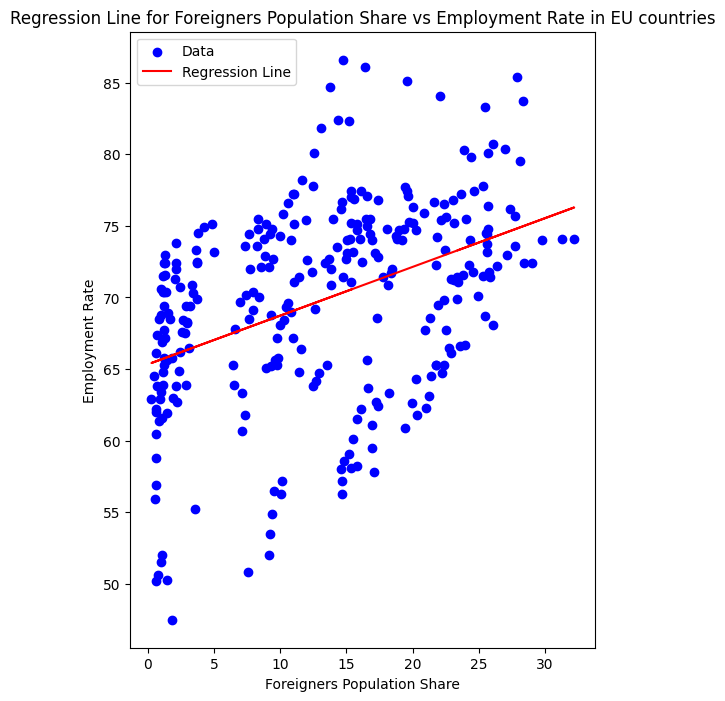

In [370]:
model_all = LinearRegression()
reg_df = merged2.dropna(subset=['foreigners_pop_share', 'employment_rate'])
reg_df = reg_df[reg_df['foreigners_pop_share'] < 35] # delete outliers
X_all = reg_df[['foreigners_pop_share']]
y_all = reg_df['employment_rate']
model_all.fit(X_all, y_all)
y_pred = model_all.predict(X_all)
plt.figure(figsize=(6,8))
plt.scatter(reg_df['foreigners_pop_share'], reg_df['employment_rate'], label="Data", color="blue")
plt.plot(reg_df['foreigners_pop_share'], y_pred, color='red', label='Regression Line')
plt.title('Regression Line for Foreigners Population Share vs Employment Rate in EU countries')
plt.xlabel('Foreigners Population Share')
plt.ylabel('Employment Rate')
plt.legend()
plt.show()

In [373]:
r2 = model_all.score(X_all, y_all)
print("R²:", r2)

R²: 0.17283646393410768


* Bardzo zły wynik. 
* Analiza ma zatem tylko sens, rozpatrując kraje z osobna.

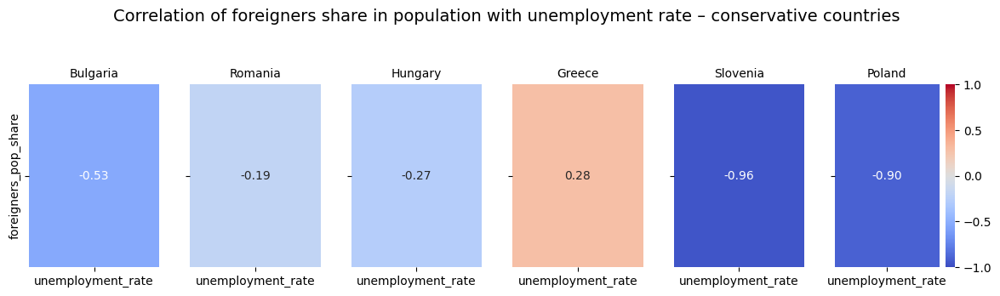

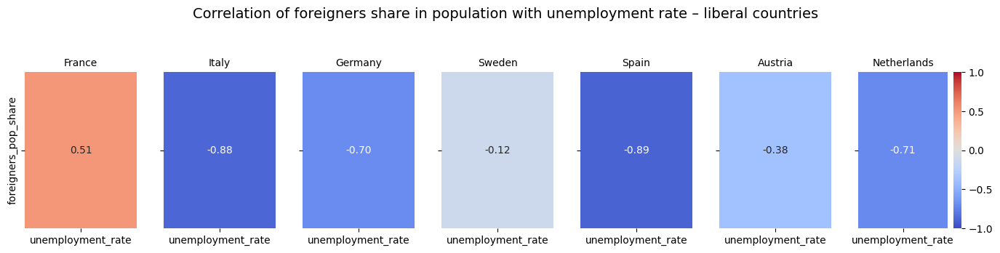

In [458]:
cols = ['foreigners_pop_share', 'unemployment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain", "Austria", "Netherlands"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation of foreigners share in population with unemployment rate – conservative countries")

plot_country_group(more_migrants, "Correlation of foreigners share in population with unemployment rate – liberal countries")

* Dość widoczna korelacja pomiędzy odestkiem cudzoziemców wśród obywateli kraju oraz stopą bezrobocia
* Dla Słoweni, Włoch, Polski, Niemiec, Hiszpani i Holandi - bardzo wysokie ujemne korelacje -> im więcej cudzoziemców w populacji danego kraju tym niższa stopa bezrobocia
* Ciekawy przypadek Francji - dość wysoka (0.51 - jest jakiś wpływ) dodatania korelacja

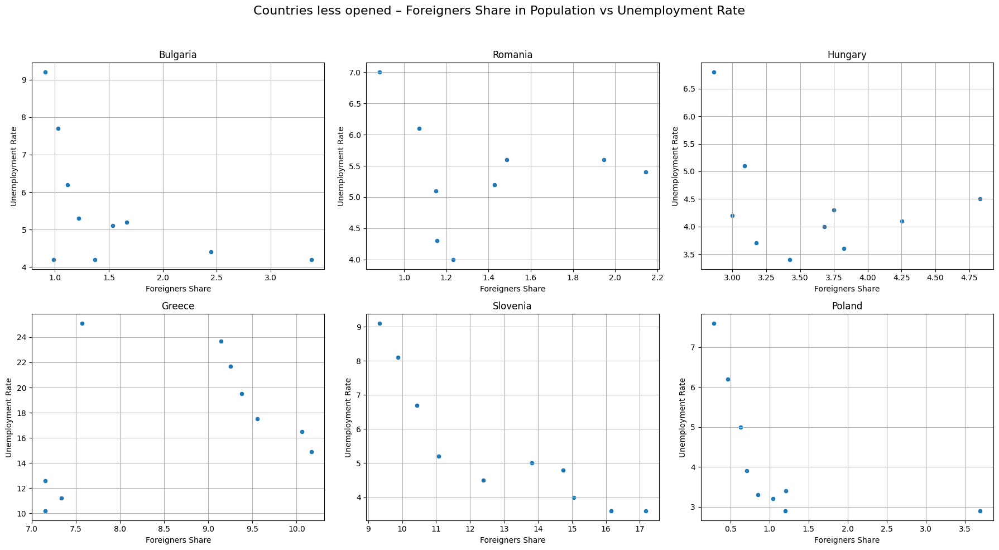

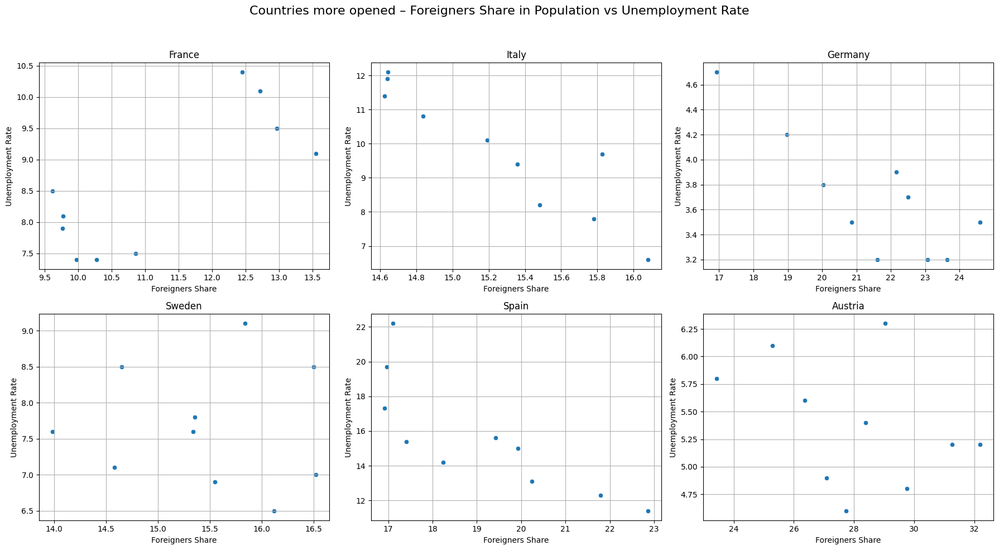

In [459]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Foreigners Share in Population vs Unemployment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Share')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Foreigners Share in Population vs Unemployment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Share')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

* Przypadek Francji - znowu (jak w przypadku employmnet rate) kształtują się dwie linie -> do głębszej analizy

### Studium przypadku - Polska
Analiza korelacji z unemployment rate

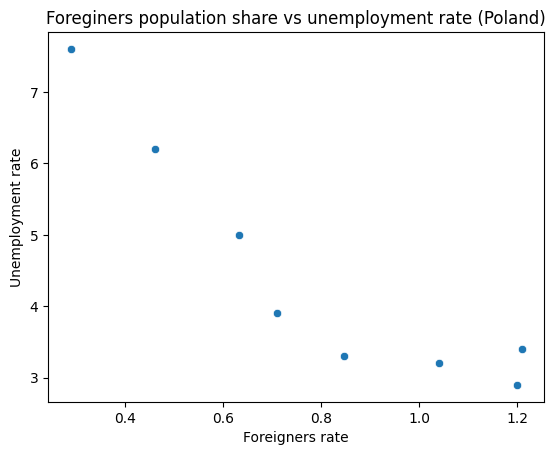

In [349]:
poland_data = merged2[(merged2['geo'] == "Poland") &
                    (merged2['foreigners_pop_share'] < 3)
                  ] 

sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='unemployment_rate')
plt.title('Foreginers population share vs unemployment rate (Poland)')
plt.xlabel('Foreigners rate')
plt.ylabel('Unemployment rate')
plt.show()

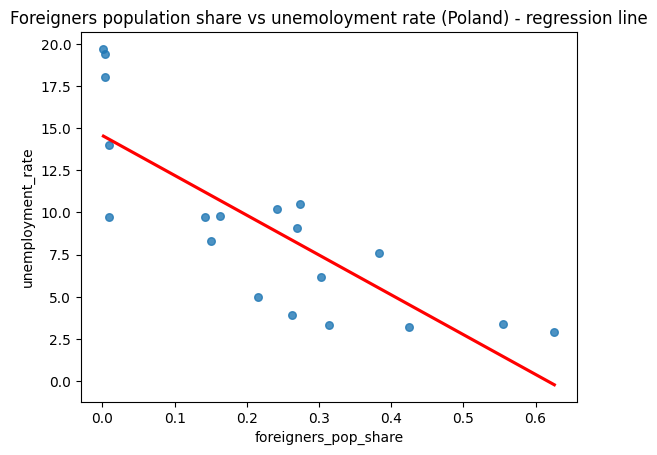

In [462]:
# z prostą regresją
sns.regplot(
    data=poland_data,
    x='foreigners_pop_share',
    y='unemployment_rate',
    scatter_kws={'s': 30},
    line_kws={'color': 'red'},
    ci=None
)
plt.title('Foreigners population share vs unemoloyment rate (Poland) - regression line')
plt.show()

# Modele wykorzystujące więcej wskaźników
Połącznie wszystkich wskaźników dotyczących gospodarki/ekonomii z migracją
* stopa bezrobocia
* wskaźnik zatrudnień
* średnie wynagrodzenie
* ceny produktów 
* HICP 
Zbudowanie modelu w oparciu o te dane 